## CredX Risk Analysis

<b> Business understanding </b>: 
CredX is a leading credit card provider that gets thousands of credit card applications every year. But in the past few years, it has experienced an increase in credit loss. The CEO believes that the best strategy to mitigate credit risk is to ‘acquire the right customers’.

 

In this project, our task is to help CredX identify the right customers using predictive models. Using past data of the bank’s applicants, you need to determine the factors affecting credit risk, create strategies to mitigate the acquisition risk and assess the financial benefit of your project.   

<b> Understanding the data</b>: 
There are two data sets in this project: demographic and credit bureau data.  

- <b> Demographic/application data </b> : This is obtained from the information provided by the applicants at the time of credit card application. It contains customer-level information on age, gender, income, marital status, etc.

- <b> Credit bureau</b>:  This is taken from the credit bureau and contains variables such as 'number of times 30 DPD or worse in last 3/6/12 months', 'outstanding balance', 'number of trades', etc.

#### Capstone Project by Sanyam & Habeeb

We will understand the business objective and understand the data using univariate and multivariate analysis. Then we'll build multiple supervised learning models, choose the best among them and analyze the financial benefits of the analytics project.

- Data Understanding
- Data Cleaning
- Data Preparation
- Data Modelling
- Model Evaluation

In [1]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Import the numpy ,pandas matplotlib and  packages

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# the commonly used alias for seaborn is sns
import seaborn as sns

# set a seaborn style of your taste
sns.set_style("whitegrid")


In [3]:
Demographic = pd.read_csv("Demographic data.csv", sep=",")
Demographic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71295 entries, 0 to 71294
Data columns (total 12 columns):
Application ID                                 71295 non-null int64
Age                                            71295 non-null int64
Gender                                         71293 non-null object
Marital Status (at the time of application)    71289 non-null object
No of dependents                               71292 non-null float64
Income                                         71295 non-null float64
Education                                      71176 non-null object
Profession                                     71281 non-null object
Type of residence                              71287 non-null object
No of months in current residence              71295 non-null int64
No of months in current company                71295 non-null int64
Performance Tag                                69870 non-null float64
dtypes: float64(3), int64(4), object(5)
memory usage: 6.5+ MB


In [4]:
Credit_Bureau = pd.read_csv("Credit Bureau data.csv", sep=",")
Credit_Bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71295 entries, 0 to 71294
Data columns (total 19 columns):
Application ID                                                     71295 non-null int64
No of times 90 DPD or worse in last 6 months                       71295 non-null int64
No of times 60 DPD or worse in last 6 months                       71295 non-null int64
No of times 30 DPD or worse in last 6 months                       71295 non-null int64
No of times 90 DPD or worse in last 12 months                      71295 non-null int64
No of times 60 DPD or worse in last 12 months                      71295 non-null int64
No of times 30 DPD or worse in last 12 months                      71295 non-null int64
Avgas CC Utilization in last 12 months                             70237 non-null float64
No of trades opened in last 6 months                               71294 non-null float64
No of trades opened in last 12 months                              71295 non-null int64
No of P

In [5]:
Demographic.isnull().sum()

Application ID                                    0
Age                                               0
Gender                                            2
Marital Status (at the time of application)       6
No of dependents                                  3
Income                                            0
Education                                       119
Profession                                       14
Type of residence                                 8
No of months in current residence                 0
No of months in current company                   0
Performance Tag                                1425
dtype: int64

In [6]:
Demographic.isnull().sum()

Application ID                                    0
Age                                               0
Gender                                            2
Marital Status (at the time of application)       6
No of dependents                                  3
Income                                            0
Education                                       119
Profession                                       14
Type of residence                                 8
No of months in current residence                 0
No of months in current company                   0
Performance Tag                                1425
dtype: int64

In [7]:
Credit_Bureau.isnull().sum()

Application ID                                                        0
No of times 90 DPD or worse in last 6 months                          0
No of times 60 DPD or worse in last 6 months                          0
No of times 30 DPD or worse in last 6 months                          0
No of times 90 DPD or worse in last 12 months                         0
No of times 60 DPD or worse in last 12 months                         0
No of times 30 DPD or worse in last 12 months                         0
Avgas CC Utilization in last 12 months                             1058
No of trades opened in last 6 months                                  1
No of trades opened in last 12 months                                 0
No of PL trades opened in last 6 months                               0
No of PL trades opened in last 12 months                              0
No of Inquiries in last 6 months (excluding home & auto loans)        0
No of Inquiries in last 12 months (excluding home & auto loans) 

In [8]:
# let's look at the first few rows of the dataframe
Demographic.head()

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,Performance Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [9]:
# let's look at the first few rows of the dataframe
Credit_Bureau.head()

,Application ID,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
0,954457215,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


In [10]:
#looking Shape of Data
print("Demographic data Shape:",Demographic.shape)
print("Credit_Bureau data Shape:",Credit_Bureau.shape)

Demographic data Shape: (71295, 12)
Credit_Bureau data Shape: (71295, 19)


In [11]:
# Looking at all the column names
Demographic.columns

Index(['Application ID', 'Age', 'Gender',
       'Marital Status (at the time of application)', 'No of dependents',
       'Income', 'Education', 'Profession ', 'Type of residence',
       'No of months in current residence', 'No of months in current company',
       'Performance Tag'],
      dtype='object')

In [12]:
# Looking at all the column names
Credit_Bureau.columns

Index(['Application ID', 'No of times 90 DPD or worse in last 6 months',
       'No of times 60 DPD or worse in last 6 months',
       'No of times 30 DPD or worse in last 6 months',
       'No of times 90 DPD or worse in last 12 months',
       'No of times 60 DPD or worse in last 12 months',
       'No of times 30 DPD or worse in last 12 months',
       'Avgas CC Utilization in last 12 months',
       'No of trades opened in last 6 months',
       'No of trades opened in last 12 months',
       'No of PL trades opened in last 6 months',
       'No of PL trades opened in last 12 months',
       'No of Inquiries in last 6 months (excluding home & auto loans)',
       'No of Inquiries in last 12 months (excluding home & auto loans)',
       'Presence of open home loan', 'Outstanding Balance',
       'Total No of Trades', 'Presence of open auto loan', 'Performance Tag'],
      dtype='object')

In [13]:
#Replacing Column Names spaces With '_' 
Demographic.columns = Demographic.columns.str.replace(' ', '_')
Demographic.columns = Demographic.columns.str.replace('_+$', '')
Demographic.rename(columns={'Marital_Status_(at_the_time_of_application)':'Marital_Status'},inplace=True)
Credit_Bureau.columns = Credit_Bureau.columns.str.replace(' ', '_')
Credit_Bureau.columns = Credit_Bureau.columns.str.replace('_+$', '')

In [14]:
# Looking at all the column names
Demographic.columns

Index(['Application_ID', 'Age', 'Gender', 'Marital_Status', 'No_of_dependents',
       'Income', 'Education', 'Profession', 'Type_of_residence',
       'No_of_months_in_current_residence', 'No_of_months_in_current_company',
       'Performance_Tag'],
      dtype='object')

In [15]:
# Looking at all the column names
Credit_Bureau.columns

Index(['Application_ID', 'No_of_times_90_DPD_or_worse_in_last_6_months',
       'No_of_times_60_DPD_or_worse_in_last_6_months',
       'No_of_times_30_DPD_or_worse_in_last_6_months',
       'No_of_times_90_DPD_or_worse_in_last_12_months',
       'No_of_times_60_DPD_or_worse_in_last_12_months',
       'No_of_times_30_DPD_or_worse_in_last_12_months',
       'Avgas_CC_Utilization_in_last_12_months',
       'No_of_trades_opened_in_last_6_months',
       'No_of_trades_opened_in_last_12_months',
       'No_of_PL_trades_opened_in_last_6_months',
       'No_of_PL_trades_opened_in_last_12_months',
       'No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)',
       'No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)',
       'Presence_of_open_home_loan', 'Outstanding_Balance',
       'Total_No_of_Trades', 'Presence_of_open_auto_loan', 'Performance_Tag'],
      dtype='object')

In [16]:
# Copy the dataset into a back up dataframe for future use
Demographic_copy = Demographic
Credit_Bureau_copy = Credit_Bureau

### Demographic Data

In [17]:
# look at data statistics
Demographic.describe(include='all')

,Application_ID,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag
count,7.129500e+04,71295.000000,71293,71289,71292.000000,71295.000000,71176,71281,71287,71295.000000,71295.000000,69870.000000
unique,NaN,NaN,2,2,NaN,NaN,5,3,5,NaN,NaN,NaN
top,NaN,NaN,M,Married,NaN,NaN,Professional,SAL,Rented,NaN,NaN,NaN
freq,NaN,NaN,54456,60730,NaN,NaN,24839,40439,53397,NaN,NaN,NaN
mean,4.989601e+08,44.943039,NaN,NaN,2.865188,27.195224,NaN,NaN,NaN,34.563420,33.958244,0.042193
std,2.885905e+08,9.939211,NaN,NaN,1.382319,15.514626,NaN,NaN,NaN,36.759758,20.410824,0.201030
min,1.004500e+05,-3.000000,NaN,NaN,1.000000,-0.500000,NaN,NaN,NaN,6.000000,3.000000,0.000000
25%,2.483719e+08,37.000000,NaN,NaN,2.000000,14.000000,NaN,NaN,NaN,6.000000,16.000000,0.000000
50%,4.975698e+08,45.000000,NaN,NaN,3.000000,27.000000,NaN,NaN,NaN,11.000000,34.000000,0.000000
75%,7.495868e+08,53.000000,NaN,NaN,4.000000,40.000000,NaN,NaN,NaN,60.000000,51.000000,0.000000


In [18]:
len(Demographic['Application_ID'].unique())

71292

In [19]:
duplicateRowsDF = Demographic[Demographic.duplicated(['Application_ID'])]
duplicateRowsDF

,Application_ID,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag
27586,765011468,38,M,Married,4.0,4.5,Professional,SAL,Rented,6,72,0.0
42637,653287861,40,M,Married,5.0,32.0,Phd,SE,Rented,45,46,1.0
59022,671989187,57,M,Married,4.0,7.0,Professional,SE,Rented,42,3,0.0


So,Based On The Application ID There are 3 Duplicates Present in the Data

In [20]:
#Removing of Duplicated Data
Demographic = Demographic[~Demographic.duplicated(['Application_ID'])]

In [21]:
# percentage of missing values in each column
round(Demographic.isnull().sum()/len(Demographic.index), 2)*100

Application_ID                       0.0
Age                                  0.0
Gender                               0.0
Marital_Status                       0.0
No_of_dependents                     0.0
Income                               0.0
Education                            0.0
Profession                           0.0
Type_of_residence                    0.0
No_of_months_in_current_residence    0.0
No_of_months_in_current_company      0.0
Performance_Tag                      2.0
dtype: float64

In [457]:
## seperating no impute to be taken for WoE analysis
Demographic_unimpute = Demographic

## extracting the null entries from the additional testing (rejected applications)
Demographic_PT_null = Demographic_copy[Demographic_copy.Performance_Tag.isnull()]

In [435]:
Demographic=Demographic[~np.isnan(Demographic['Performance_Tag'])]

In [24]:
# percentage of missing values in each column
round(Demographic.isnull().sum()/len(Demographic.index), 2)*100

Application_ID                       0.0
Age                                  0.0
Gender                               0.0
Marital_Status                       0.0
No_of_dependents                     0.0
Income                               0.0
Education                            0.0
Profession                           0.0
Type_of_residence                    0.0
No_of_months_in_current_residence    0.0
No_of_months_in_current_company      0.0
Performance_Tag                      0.0
dtype: float64

In [25]:
#looking Shape of Data
print("Demographic data Shape:",Demographic.shape)

Demographic data Shape: (69867, 12)


In [26]:
Demographic.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69867 entries, 0 to 71294
Data columns (total 12 columns):
Application_ID                       69867 non-null int64
Age                                  69867 non-null int64
Gender                               69865 non-null object
Marital_Status                       69861 non-null object
No_of_dependents                     69864 non-null float64
Income                               69867 non-null float64
Education                            69749 non-null object
Profession                           69854 non-null object
Type_of_residence                    69859 non-null object
No_of_months_in_current_residence    69867 non-null int64
No_of_months_in_current_company      69867 non-null int64
Performance_Tag                      69867 non-null float64
dtypes: float64(3), int64(4), object(5)
memory usage: 6.9+ MB


Gender,Marital_Status,No_of_dependents,Education,Profession and Type_of_residence have missing null values

In [27]:
Demographic['Performance_Tag'].value_counts()

0.0    66920
1.0     2947
Name: Performance_Tag, dtype: int64

In [28]:
# look at data statistics
Demographic['Age'].describe(include='all')

count    69867.000000
mean        44.995577
std          9.930092
min         -3.000000
25%         37.000000
50%         45.000000
75%         53.000000
max         65.000000
Name: Age, dtype: float64

In [29]:
Demographic['Age'].unique()

array([48, 31, 32, 43, 35, 20, 42, 34, 30, 22, 37, 41, 38, 33, 45, 51, 36,
       29, 40, 19, 25, 28, 50, 27, 26, 49, 47, 39, 17, 44, 23, 46, 52, 53,
       24, 18, 15, 21, 16, 64, 56, 55, 60, 59, 54, 58, 62, 65, 61, 57, 63,
        0, -3])

In [30]:
Demographic.loc[Demographic.Age<18,'Age'] = 18
Demographic.head()

,Application_ID,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [31]:
Demographic['Age'].unique()

array([48, 31, 32, 43, 35, 20, 42, 34, 30, 22, 37, 41, 38, 33, 45, 51, 36,
       29, 40, 19, 25, 28, 50, 27, 26, 49, 47, 39, 18, 44, 23, 46, 52, 53,
       24, 21, 64, 56, 55, 60, 59, 54, 58, 62, 65, 61, 57, 63])

In [32]:
Demographic['Gender'].value_counts()

M    53359
F    16506
Name: Gender, dtype: int64

In [33]:
## checking null entries for gender
Demographic.loc[Demographic.Gender.isnull()]

,Application_ID,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag
39501,320437253,42,NaN,Married,5.0,4.5,Bachelor,SE_PROF,Rented,96,58,0.0
55578,862922520,18,NaN,Married,3.0,59.0,Bachelor,SE,Owned,6,48,0.0


In [34]:
## replacing the null entries for Gender with most common entry across gender i.e. 'Male'
Demographic["Gender"].fillna(Demographic['Gender'].mode()[0], inplace = True) 

In [35]:
Demographic['Gender'].value_counts()

M    53361
F    16506
Name: Gender, dtype: int64

In [36]:
Demographic['Marital_Status'].value_counts()

Married    59544
Single     10317
Name: Marital_Status, dtype: int64

In [37]:
## replacing the null entries for Marital_Status with most common entry across gender i.e. 'Married'
Demographic['Marital_Status'].fillna(Demographic['Marital_Status'].mode()[0], inplace = True) 

In [38]:
Demographic['Marital_Status'].value_counts()

Married    59550
Single     10317
Name: Marital_Status, dtype: int64

In [39]:
Demographic['No_of_dependents'].value_counts()

3.0    15645
1.0    15218
2.0    15128
4.0    11998
5.0    11875
Name: No_of_dependents, dtype: int64

In [40]:
## replacing the null entries for No_of_dependents with median entry of No_of_dependents
Demographic.loc[Demographic.No_of_dependents.isnull(),'No_of_dependents'] = Demographic.No_of_dependents.median()
Demographic['No_of_dependents'].value_counts()

3.0    15648
1.0    15218
2.0    15128
4.0    11998
5.0    11875
Name: No_of_dependents, dtype: int64

In [41]:
Demographic['Income'].unique()

array([40. , 55. , 46. , 53. , 44. , 39. , 49. , 48. , 38. , 43. , 51. ,
       54. , 50. , 28. , 52. , 27. , 37. , 36. , 42. , 32. , 24. , 25. ,
       47. , 31. , 33. , 35. , 26. , 34. , 41. , 45. , 13. , 19. , 29. ,
       18. ,  7. , 30. , 23. , 21. , 14. ,  2. , 22. ,  3. ,  6. , 15. ,
       16. , 20. , 11. , 17. , 12. ,  5. ,  4. , 10. ,  9. , -0.5,  8. ,
        1. ,  0. ,  4.5, 60. , 57. , 59. , 58. , 56. ])

In [42]:

Demographic.Income[Demographic.Income<0] =Demographic.Income.median()

In [43]:
Demographic['Income'].unique()

array([40. , 55. , 46. , 53. , 44. , 39. , 49. , 48. , 38. , 43. , 51. ,
       54. , 50. , 28. , 52. , 27. , 37. , 36. , 42. , 32. , 24. , 25. ,
       47. , 31. , 33. , 35. , 26. , 34. , 41. , 45. , 13. , 19. , 29. ,
       18. ,  7. , 30. , 23. , 21. , 14. ,  2. , 22. ,  3. ,  6. , 15. ,
       16. , 20. , 11. , 17. , 12. ,  5. ,  4. , 10. ,  9. ,  8. ,  1. ,
        0. ,  4.5, 60. , 57. , 59. , 58. , 56. ])

In [44]:
Demographic['Income'].describe()

count    69867.000000
mean        27.440888
std         15.446660
min          0.000000
25%         14.000000
50%         27.000000
75%         40.000000
max         60.000000
Name: Income, dtype: float64

In [45]:
Demographic['Education'].value_counts()

Professional    24384
Masters         23481
Bachelor        17302
Phd              4463
Others            119
Name: Education, dtype: int64

In [46]:
## replacing the null entries for Education with value of 'unknown'
Demographic.loc[Demographic.Education.isnull(),'Education'] = 'unknown'

In [47]:
Demographic['Education'].value_counts()

Professional    24384
Masters         23481
Bachelor        17302
Phd              4463
Others            119
unknown           118
Name: Education, dtype: int64

In [48]:
Demographic['Profession'].value_counts()

SAL        39673
SE_PROF    16256
SE         13925
Name: Profession, dtype: int64

In [49]:
## replacing the null entries for Profession with value of mode of Profession
Demographic['Profession'].fillna(Demographic['Profession'].mode()[0], inplace = True) 

In [50]:
Demographic['Profession'].value_counts()

SAL        39686
SE_PROF    16256
SE         13925
Name: Profession, dtype: int64

In [51]:
Demographic['Type_of_residence'].value_counts()

Rented                 52277
Owned                  14003
Living with Parents     1778
Company provided        1603
Others                   198
Name: Type_of_residence, dtype: int64

In [52]:
## replacing the null entries for Profession with value of mode of Profession
Demographic['Type_of_residence'].fillna(Demographic['Type_of_residence'].mode()[0], inplace = True)

In [53]:
Demographic['Type_of_residence'].value_counts()

Rented                 52285
Owned                  14003
Living with Parents     1778
Company provided        1603
Others                   198
Name: Type_of_residence, dtype: int64

In [54]:
Demographic['No_of_months_in_current_residence'].unique()

array([113, 112, 104,  94, 116, 108, 115, 111,  90,  83, 106,  81, 100,
       107,  96,  92, 103,  82,  97,  80,  77,  76,  86,  54,  93,  98,
        64,  58,  91,  84,  71, 101,  99, 109, 110, 114,  70,  72,  95,
        69, 105,  89,  74,  44,  53,  63,  85, 102,  56,  78,  66,  75,
        79,  29,  88,  87,  73,  67,  68,  61,  34,  40,  48,  65,  60,
        62,  46,  59,  33,  50,  49,  35,  37,  18,  43,  30,  52,  32,
        26,  38,  25,   7,  47,  23,  13,  41,  51,  20,  36,  57,  28,
        11,  16,  42,   6,  55,  39,  45,  17,  14,  31,  22,  24,  21,
        10,  27,   9,  19,  12,  15,   8, 120, 122, 118, 119, 123, 117,
       121, 126, 125, 124])

In [55]:
Demographic['No_of_months_in_current_residence'].describe()

count    69867.000000
mean        34.608299
std         36.846256
min          6.000000
25%          6.000000
50%         10.000000
75%         61.000000
max        126.000000
Name: No_of_months_in_current_residence, dtype: float64

In [56]:
Demographic['No_of_months_in_current_company'].unique()

array([ 56,  46,  49,  53,  43,  52,  41,  40,  58,  57,  50, 123,  51,
        19,  38,  33,  36,  44,  39,  35,  37,  45,  17,  42,   4,  25,
        55,  32,  54,  31,  47,  13,  30,  18,  48,  10,  28,  29,   3,
        20,  22,  34,  24,  12,   5,  15,  27,  14,   6,  16,   9,  26,
        21,   8,  23,  11,   7, 128,  98,  61,  59,  60,  62, 133,  68,
        83,  67,  74,  71,  70,  65,  69,  63,  66,  75,  73,  64,  72,
        96,  91, 121, 126, 105])

In [57]:
Demographic['No_of_months_in_current_company'].describe()

count    69867.000000
mean        34.198921
std         20.349768
min          3.000000
25%         17.000000
50%         34.000000
75%         51.000000
max        133.000000
Name: No_of_months_in_current_company, dtype: float64

In [58]:
Demographic.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69867 entries, 0 to 71294
Data columns (total 12 columns):
Application_ID                       69867 non-null int64
Age                                  69867 non-null int64
Gender                               69867 non-null object
Marital_Status                       69867 non-null object
No_of_dependents                     69867 non-null float64
Income                               69867 non-null float64
Education                            69867 non-null object
Profession                           69867 non-null object
Type_of_residence                    69867 non-null object
No_of_months_in_current_residence    69867 non-null int64
No_of_months_in_current_company      69867 non-null int64
Performance_Tag                      69867 non-null float64
dtypes: float64(3), int64(4), object(5)
memory usage: 6.9+ MB


In [59]:
### Checking the Default Rate
Default_Rate = (sum(Demographic['Performance_Tag'])/len(Demographic['Performance_Tag'].index))*100
Default_Rate

4.218014227031359

### WOE,IV calculation: Demographic Data

#### Unimputed Data 

In [60]:
## describing the dataset with no imputation
Demographic_unimpute.describe()

,Application_ID,Age,No_of_dependents,Income,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag
count,7.129200e+04,71292.000000,71289.000000,71292.000000,71292.000000,71292.000000,69867.000000
mean,4.989518e+08,44.943037,2.865126,27.195758,34.563570,33.957976,0.042180
std,2.885936e+08,9.939266,1.382312,15.514524,36.760345,20.410377,0.201001
min,1.004500e+05,-3.000000,1.000000,-0.500000,6.000000,3.000000,0.000000
25%,2.483706e+08,37.000000,2.000000,14.000000,6.000000,16.000000,0.000000
50%,4.975655e+08,45.000000,3.000000,27.000000,11.000000,34.000000,0.000000
75%,7.495782e+08,53.000000,4.000000,40.000000,60.000000,51.000000,0.000000
max,1.000084e+09,65.000000,5.000000,60.000000,126.000000,133.000000,1.000000


In [61]:
Demographic_unimpute.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 71292 entries, 0 to 71294
Data columns (total 12 columns):
Application_ID                       71292 non-null int64
Age                                  71292 non-null int64
Gender                               71290 non-null object
Marital_Status                       71286 non-null object
No_of_dependents                     71289 non-null float64
Income                               71292 non-null float64
Education                            71173 non-null object
Profession                           71278 non-null object
Type_of_residence                    71284 non-null object
No_of_months_in_current_residence    71292 non-null int64
No_of_months_in_current_company      71292 non-null int64
Performance_Tag                      69867 non-null float64
dtypes: float64(3), int64(4), object(5)
memory usage: 7.1+ MB


For WOE,IV Calculation : we have used the WOE Function from Here
https://www.listendata.com/2015/03/weight-of-evidence-woe-and-information.html

In [62]:
## creating functions for woe and IV
def iv_woe(data, target, bins=8, show_woe=False):
    
    #Empty Dataframe
    newDF,woeDF = pd.DataFrame(), pd.DataFrame()
    
    #Extract Column Names
    cols = data.columns
    
    #Run WOE and IV on all the independent variables
    for ivars in cols[~cols.isin([target])]:
        null_data = data[data[ivars].isnull()]
        nonnull_data = data[data[ivars].notnull()]
        
        if (data[ivars].dtype.kind in 'bifc') and (len(np.unique(data[ivars]))>8):            
            binned_x = pd.qcut(nonnull_data[ivars], bins,  duplicates='drop')
            d0 = pd.DataFrame({'x': binned_x, 'y': nonnull_data[target]})
        else:
            d0 = pd.DataFrame({'x': nonnull_data[ivars], 'y': nonnull_data[target]})
            
        if(~null_data.empty):
            d1 = pd.DataFrame({'x' : 'NULL', 'y' : null_data[target]})
            d0 = pd.concat([d0, d1], axis = 0)
            
        d = d0.groupby("x", as_index=False).agg({"y": ["count", "sum"]})
        d.columns = ['Cutoff', 'N', 'Defaults']                
        d['% of Defaults'] = np.maximum(d['Defaults'], 0.5) / d['Defaults'].sum()
        d['Non-Defaults'] = d['N'] - d['Defaults']
        d['% of Non-Defaults'] = np.maximum(d['Non-Defaults'], 0.5) / d['Non-Defaults'].sum()
        d['WoE'] = np.log(d['% of Defaults']/d['% of Non-Defaults'])
        d['IV'] = round(d['WoE'] * (d['% of Defaults'] - d['% of Non-Defaults']),6)
        d.insert(loc=0, column='Variable', value=ivars)
        print("Information value of " + ivars + " is " + str(round(d['IV'].sum(),6)))
        temp =pd.DataFrame({"Variable" : [ivars], "IV" : [d['IV'].sum()]}, columns = ["Variable", "IV"])
        newDF=pd.concat([newDF,temp], axis=0)
        woeDF=pd.concat([woeDF,d], axis=0)

        woeDF['min_val']=0
        woeDF['max_val']=0
        for cols in np.unique(woeDF.Variable):
            if (data[cols].dtype.kind in 'bifc') and (len(np.unique(data[cols]))>8):
                woeDF.loc[(woeDF.Variable==cols) & (woeDF.Cutoff!='NULL'),'min_val'
                         ] = woeDF[woeDF.Variable==cols
                                  ]['Cutoff'].apply(lambda x: 0 if x=='NULL' else float(str(x).split(',')[0].split('(')[1].strip()))
                woeDF.loc[(woeDF.Variable==cols) & (woeDF.Cutoff!='NULL'),'max_val'
                         ] = woeDF[woeDF.Variable==cols
                                  ]['Cutoff'].apply(lambda x: 0 if x=='NULL' else float(str(x).split(',')[1].split(']')[0].strip()))


        #Show WOE Table
        if show_woe == True:
            print(d)
    return newDF, woeDF

In [63]:
## evaluating woe and iv for demographics data (without any imputation)
iv_Demographic, woe_Demographic = iv_woe(data = Demographic_unimpute.drop(['Application_ID'],axis=1), 
                                           target = 'Performance_Tag', bins=8, show_woe = True)

Information value of Age is 0.004529
  Variable          Cutoff     N  Defaults  % of Defaults  Non-Defaults  \
0      Age  (-3.001, 32.0]  8726     370.0       0.125551        8356.0   
1      Age    (32.0, 37.0]  8758     370.0       0.125551        8388.0   
2      Age    (37.0, 41.0]  9444     436.0       0.147947        9008.0   
3      Age    (41.0, 45.0]  9238     375.0       0.127248        8863.0   
4      Age    (45.0, 49.0]  9090     398.0       0.135053        8692.0   
5      Age    (49.0, 53.0]  9093     333.0       0.112996        8760.0   
6      Age    (53.0, 57.0]  7619     335.0       0.113675        7284.0   
7      Age    (57.0, 65.0]  7899     330.0       0.111978        7569.0   

   % of Non-Defaults       WoE        IV  
0           0.124866  0.005478  0.000004  
1           0.125344  0.001656  0.000000  
2           0.134608  0.094484  0.001260  
3           0.132442 -0.040004  0.000208  
4           0.129886  0.039004  0.000202  
5           0.130903 -0.14709

In [64]:
iv_Demographic.sort_values('IV',ascending='False')

,Variable,IV
0,Marital_Status,0.000146
0,Gender,0.000569
0,Education,0.000782
0,Type_of_residence,0.000938
0,Profession,0.002223
0,No_of_dependents,0.002819
0,Age,0.004529
0,No_of_months_in_current_company,0.019821
0,Income,0.039013
0,No_of_months_in_current_residence,0.069628


In [65]:
woe_Demographic

,% of Defaults,% of Non-Defaults,Cutoff,Defaults,IV,N,Non-Defaults,Variable,WoE,max_val,min_val
0,0.125551,0.124866,"(-3.001, 32.0]",370.0,0.000004,8726,8356.0,Age,0.005478,32.0,-3.001
1,0.125551,0.125344,"(32.0, 37.0]",370.0,0.000000,8758,8388.0,Age,0.001656,37.0,32.000
2,0.147947,0.134608,"(37.0, 41.0]",436.0,0.001260,9444,9008.0,Age,0.094484,41.0,37.000
3,0.127248,0.132442,"(41.0, 45.0]",375.0,0.000208,9238,8863.0,Age,-0.040004,45.0,41.000
4,0.135053,0.129886,"(45.0, 49.0]",398.0,0.000202,9090,8692.0,Age,0.039004,49.0,45.000
5,0.112996,0.130903,"(49.0, 53.0]",333.0,0.002634,9093,8760.0,Age,-0.147099,53.0,49.000
6,0.113675,0.108846,"(53.0, 57.0]",335.0,0.000210,7619,7284.0,Age,0.043405,57.0,53.000
7,0.111978,0.113105,"(57.0, 65.0]",330.0,0.000011,7899,7569.0,Age,-0.010013,65.0,57.000
0,0.243638,0.235923,F,718.0,0.000248,16506,15788.0,Gender,0.032174,0.0,0.000
1,0.756362,0.764047,M,2229.0,0.000078,53359,51130.0,Gender,-0.010108,0.0,0.000


In [66]:
woe_Demographic.sort_values(by=['Variable','WoE'], ascending = False)

,% of Defaults,% of Non-Defaults,Cutoff,Defaults,IV,N,Non-Defaults,Variable,WoE,max_val,min_val
2,0.000170,0.000120,NULL,0.0,0.000018,8,8.0,Type_of_residence,0.350121,0.0,0.000
0,0.024771,0.022863,Company provided,73.0,0.000153,1603,1530.0,Type_of_residence,0.080147,0.0,0.000
1,0.027146,0.025374,Living with Parents,80.0,0.000120,1778,1698.0,Type_of_residence,0.067530,0.0,0.000
4,0.201222,0.200389,Owned,593.0,0.000003,14003,13410.0,Type_of_residence,0.004149,0.0,0.000
5,0.745165,0.748371,Rented,2196.0,0.000014,52277,50081.0,Type_of_residence,-0.004294,0.0,0.000
3,0.001697,0.002884,Others,5.0,0.000630,198,193.0,Type_of_residence,-0.530542,0.0,0.000
2,0.217509,0.198506,SE,641.0,0.001737,13925,13284.0,Profession,0.091424,0.0,0.000
3,0.229725,0.232800,SE_PROF,677.0,0.000041,16256,15579.0,Profession,-0.013298,0.0,0.000
1,0.552766,0.568500,SAL,1629.0,0.000442,39673,38044.0,Profession,-0.028067,0.0,0.000
0,0.000170,0.000194,NULL,0.0,0.000003,13,13.0,Profession,-0.135386,0.0,0.000


In [67]:
iv_Demographic.IV.sum()

0.14046799999999998

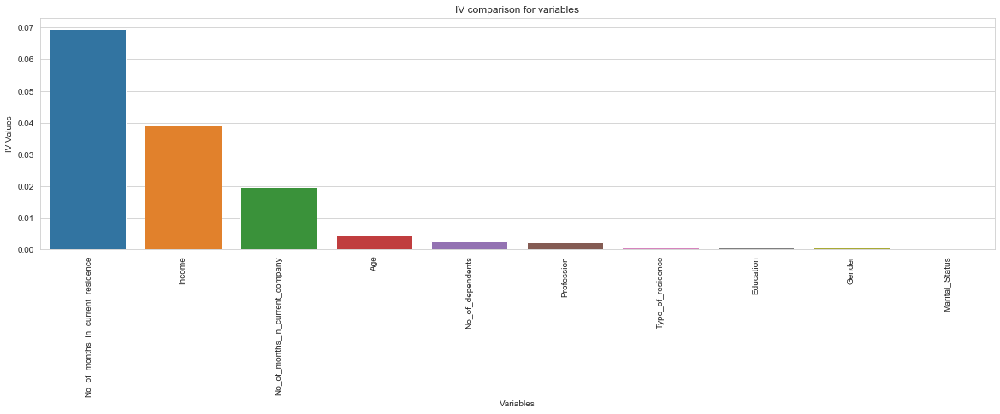

In [68]:
## plotting all the consolidated IV values of the demographics variable
plt.figure(figsize=(20,5))
ax = sns.barplot(x='Variable', y='IV', data=iv_Demographic.sort_values(by='IV', ascending = False))
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.title('IV comparison for variables')
plt.xlabel('Variables')
plt.ylabel('IV Values')
plt.show()

The variable No_of_months_in_current_residence is most significant in getting information about the default rate.

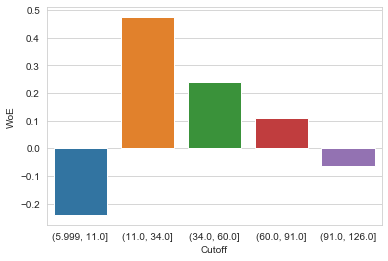

In [69]:
sns.barplot(y='WoE', x="Cutoff", data=woe_Demographic[woe_Demographic.Variable=='No_of_months_in_current_residence'])
plt.show()

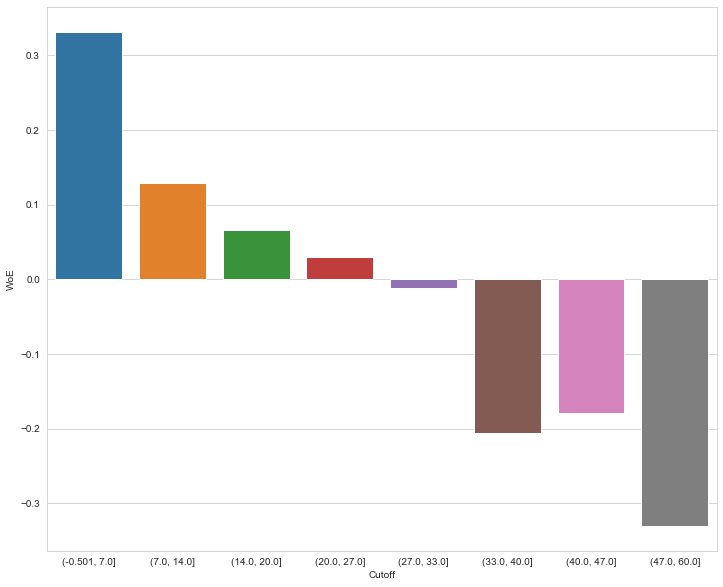

In [70]:
plt.figure(figsize=(12,10))
sns.barplot(y='WoE', x="Cutoff", data=woe_Demographic[woe_Demographic.Variable=='Income'])
plt.show()

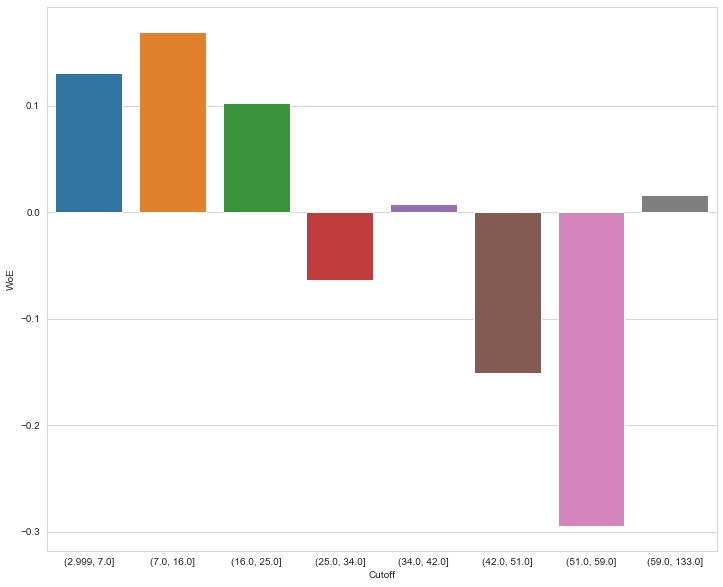

In [71]:
plt.figure(figsize=(12,10))
sns.barplot(y='WoE', x="Cutoff", data=woe_Demographic[woe_Demographic.Variable=='No_of_months_in_current_company'])
plt.show()

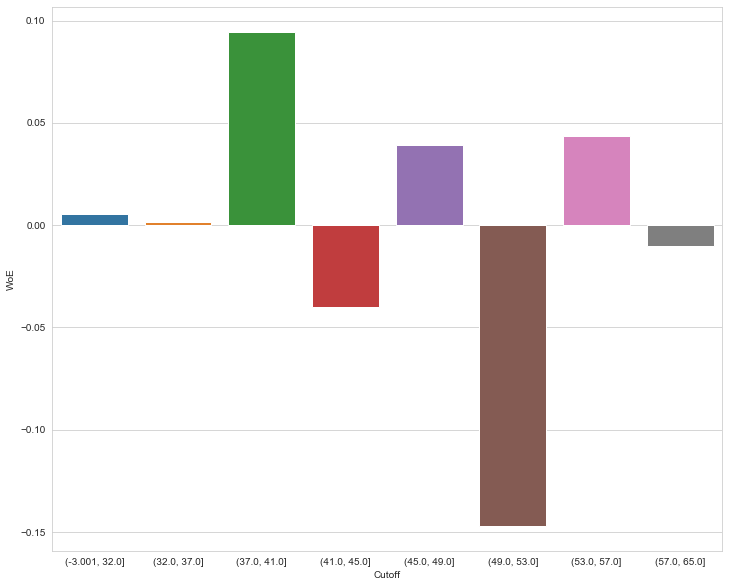

In [72]:
plt.figure(figsize=(12,10))
sns.barplot(y='WoE', x="Cutoff", data=woe_Demographic[woe_Demographic.Variable=='Age'])
plt.show()

In [73]:
## function to create woe transformed dataframe from original dataframe
def create_woe_dataframe(no_impute_df,woe_df) :
    woe_data = pd.DataFrame(no_impute_df).copy()

    for cols in woe_data.columns:
        df = woe_df[woe_df.Variable==cols]
        if (woe_data[cols].dtype.kind in 'bifc') and (len(np.unique(woe_data[cols]))>8):
            for idx in df.index :
                minval = df[idx:idx+1].min_val.sum()
                maxval = df[idx:idx+1].max_val.sum()
                woe_data.loc[(woe_data[cols]>minval) & (woe_data[cols]<=maxval),cols] = df[idx:idx+1].WoE.sum()
        else:
            for idx in df.index :
                cutoff = list(df[idx:idx+1].Cutoff)[0]
                woe_data.loc[woe_data[cols]==cutoff,cols] = df[idx:idx+1].WoE.sum()

        woe_data.loc[pd.isnull(woe_data[cols]),cols] = df[df.Cutoff=='NULL'].WoE.sum()
        woe_data[cols] = pd.to_numeric(woe_data[cols])
    
    return woe_data

In [74]:
## creating demographics WoE dataframe from original demographics dataframe
woe_demographic_data = create_woe_dataframe(Demographic_unimpute,woe_Demographic)
woe_demographic_data.head()

,Application_ID,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag
0,954457215.0,0.039004,0.032174,-0.003987,-0.085222,-0.205213,0.017314,-0.028067,-0.004294,-0.063215,-0.294512,0.0
1,432830445.0,0.005478,-0.010108,-0.003987,-0.025204,-0.330574,-0.017931,-0.013298,-0.004294,-0.063215,-0.150676,0.0
2,941387308.0,0.005478,-0.010108,0.023327,-0.085222,-0.178761,0.017314,-0.013298,-0.004294,-0.063215,-0.150676,0.0
3,392161677.0,-0.040004,-0.010108,-0.003987,0.040085,-0.330574,0.017314,0.091424,-0.004294,-0.063215,-0.294512,0.0
4,182011211.0,0.001656,0.032174,-0.003987,0.004391,-0.178761,-0.017931,-0.028067,-0.004294,-0.063215,-0.150676,0.0


In [75]:
## saving WoE dataframe into csv file
woe_demographic_data.to_csv('woe_demographic_data.csv',index=False)

### Credit Bureau Data 

In [76]:
# look at data statistics
Credit_Bureau.describe(include='all')

,Application_ID,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,No_of_times_30_DPD_or_worse_in_last_12_months,Avgas_CC_Utilization_in_last_12_months,No_of_trades_opened_in_last_6_months,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans),No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans),Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,Performance_Tag
count,7.129500e+04,71295.000000,71295.000000,71295.000000,71295.000000,71295.000000,71295.000000,70237.000000,71294.000000,71295.000000,71295.000000,71295.000000,71295.000000,71295.000000,71023.000000,7.102300e+04,71295.000000,71295.000000,69870.000000
mean,4.989601e+08,0.270313,0.430535,0.577207,0.450340,0.655488,0.800912,29.696926,2.298048,5.826888,1.206901,2.397447,1.763532,3.535241,0.256424,1.249163e+06,8.186633,0.084620,0.042193
std,2.885905e+08,0.534166,0.825334,1.074436,0.808387,1.089535,1.331940,29.533308,2.070191,5.065096,1.352936,2.420086,1.971294,3.582199,0.436662,1.278874e+06,7.090776,0.278318,0.201030
min,1.004500e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,2.483719e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.115320e+05,3.000000,0.000000,0.000000
50%,4.975698e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,2.000000,5.000000,1.000000,2.000000,1.000000,3.000000,0.000000,7.749920e+05,6.000000,0.000000,0.000000
75%,7.495868e+08,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,46.000000,3.000000,9.000000,2.000000,4.000000,3.000000,5.000000,1.000000,2.920796e+06,10.000000,0.000000,0.000000
max,1.000084e+09,3.000000,5.000000,7.000000,5.000000,7.000000,9.000000,113.000000,12.000000,28.000000,6.000000,12.000000,10.000000,20.000000,1.000000,5.218801e+06,44.000000,1.000000,1.000000


In [78]:
Credit_Bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71295 entries, 0 to 71294
Data columns (total 19 columns):
Application_ID                                                     71295 non-null int64
No_of_times_90_DPD_or_worse_in_last_6_months                       71295 non-null int64
No_of_times_60_DPD_or_worse_in_last_6_months                       71295 non-null int64
No_of_times_30_DPD_or_worse_in_last_6_months                       71295 non-null int64
No_of_times_90_DPD_or_worse_in_last_12_months                      71295 non-null int64
No_of_times_60_DPD_or_worse_in_last_12_months                      71295 non-null int64
No_of_times_30_DPD_or_worse_in_last_12_months                      71295 non-null int64
Avgas_CC_Utilization_in_last_12_months                             70237 non-null float64
No_of_trades_opened_in_last_6_months                               71294 non-null float64
No_of_trades_opened_in_last_12_months                              71295 non-null int64
No_of_P

In [77]:
Credit_Bureau['Performance_Tag'].value_counts()

0.0    66922
1.0     2948
Name: Performance_Tag, dtype: int64

In [79]:
## seperating no impute to be taken for WoE analysis
Credit_Bureau_unimpute = Credit_Bureau

## extracting the null entries from the additional testing (rejected applications)
Credit_Bureau_PT_null = Credit_Bureau_copy[Credit_Bureau_copy.Performance_Tag.isnull()]

In [80]:
# percentage of missing values in each column
round(Credit_Bureau.isnull().sum()/len(Credit_Bureau.index), 2)*100

Application_ID                                                     0.0
No_of_times_90_DPD_or_worse_in_last_6_months                       0.0
No_of_times_60_DPD_or_worse_in_last_6_months                       0.0
No_of_times_30_DPD_or_worse_in_last_6_months                       0.0
No_of_times_90_DPD_or_worse_in_last_12_months                      0.0
No_of_times_60_DPD_or_worse_in_last_12_months                      0.0
No_of_times_30_DPD_or_worse_in_last_12_months                      0.0
Avgas_CC_Utilization_in_last_12_months                             1.0
No_of_trades_opened_in_last_6_months                               0.0
No_of_trades_opened_in_last_12_months                              0.0
No_of_PL_trades_opened_in_last_6_months                            0.0
No_of_PL_trades_opened_in_last_12_months                           0.0
No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)     0.0
No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)    0.0
Presen

In [81]:
len(Credit_Bureau['Application_ID'].unique())

71292

In [82]:
duplicateRowsDF1 = Credit_Bureau[Credit_Bureau.duplicated(['Application_ID'])]
duplicateRowsDF1

,Application_ID,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,No_of_times_30_DPD_or_worse_in_last_12_months,Avgas_CC_Utilization_in_last_12_months,No_of_trades_opened_in_last_6_months,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans),No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans),Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,Performance_Tag
27586,765011468,0,0,0,0,0,0,11.0,1.0,3,0,0,1,3,0.0,29817.0,6,0,0.0
42637,653287861,1,1,1,2,2,2,113.0,2.0,5,1,3,1,3,0.0,628075.0,6,0,1.0
59022,671989187,0,1,2,0,2,3,76.0,3.0,7,1,4,2,6,0.0,822298.0,7,0,0.0


So,Based On The Application ID There are 3 Duplicates Present in the Data

In [83]:
#Removing of Duplicated Data
Credit_Bureau = Credit_Bureau[~Credit_Bureau.duplicated(['Application_ID'])]

In [84]:
Credit_Bureau=Credit_Bureau[~np.isnan(Credit_Bureau['Performance_Tag'])]

In [85]:
# percentage of missing values in each column
round(Credit_Bureau.isnull().sum()/len(Credit_Bureau.index), 2)*100

Application_ID                                                     0.0
No_of_times_90_DPD_or_worse_in_last_6_months                       0.0
No_of_times_60_DPD_or_worse_in_last_6_months                       0.0
No_of_times_30_DPD_or_worse_in_last_6_months                       0.0
No_of_times_90_DPD_or_worse_in_last_12_months                      0.0
No_of_times_60_DPD_or_worse_in_last_12_months                      0.0
No_of_times_30_DPD_or_worse_in_last_12_months                      0.0
Avgas_CC_Utilization_in_last_12_months                             1.0
No_of_trades_opened_in_last_6_months                               0.0
No_of_trades_opened_in_last_12_months                              0.0
No_of_PL_trades_opened_in_last_6_months                            0.0
No_of_PL_trades_opened_in_last_12_months                           0.0
No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)     0.0
No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)    0.0
Presen

In [86]:
Credit_Bureau.isnull().sum()

Application_ID                                                        0
No_of_times_90_DPD_or_worse_in_last_6_months                          0
No_of_times_60_DPD_or_worse_in_last_6_months                          0
No_of_times_30_DPD_or_worse_in_last_6_months                          0
No_of_times_90_DPD_or_worse_in_last_12_months                         0
No_of_times_60_DPD_or_worse_in_last_12_months                         0
No_of_times_30_DPD_or_worse_in_last_12_months                         0
Avgas_CC_Utilization_in_last_12_months                             1023
No_of_trades_opened_in_last_6_months                                  1
No_of_trades_opened_in_last_12_months                                 0
No_of_PL_trades_opened_in_last_6_months                               0
No_of_PL_trades_opened_in_last_12_months                              0
No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)        0
No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans) 

In [87]:
#looking Shape of Data
print("Credit_Bureau data Shape:",Credit_Bureau.shape)

Credit_Bureau data Shape: (69867, 19)


In [88]:
Credit_Bureau.loc[Credit_Bureau.Avgas_CC_Utilization_in_last_12_months.isnull(),
                 'Avgas_CC_Utilization_in_last_12_months'] = Credit_Bureau.Avgas_CC_Utilization_in_last_12_months.median()
Credit_Bureau.loc[Credit_Bureau.Outstanding_Balance.isnull(),'Avgas_CC_Utilization_in_last_12_months'] = 0
Credit_Bureau.loc[Credit_Bureau.Outstanding_Balance.isnull(),'Outstanding_Balance'] = 0

In [89]:
Credit_Bureau.isnull().sum()

Application_ID                                                       0
No_of_times_90_DPD_or_worse_in_last_6_months                         0
No_of_times_60_DPD_or_worse_in_last_6_months                         0
No_of_times_30_DPD_or_worse_in_last_6_months                         0
No_of_times_90_DPD_or_worse_in_last_12_months                        0
No_of_times_60_DPD_or_worse_in_last_12_months                        0
No_of_times_30_DPD_or_worse_in_last_12_months                        0
Avgas_CC_Utilization_in_last_12_months                               0
No_of_trades_opened_in_last_6_months                                 1
No_of_trades_opened_in_last_12_months                                0
No_of_PL_trades_opened_in_last_6_months                              0
No_of_PL_trades_opened_in_last_12_months                             0
No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)       0
No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)      0
Presen

In [90]:
Credit_Bureau['Presence_of_open_home_loan'].value_counts()

0.0    51524
1.0    18071
Name: Presence_of_open_home_loan, dtype: int64

In [91]:
Credit_Bureau.loc[Credit_Bureau.Presence_of_open_home_loan.isnull(),'Presence_of_open_home_loan'] = 0

In [92]:
Credit_Bureau.loc[Credit_Bureau.No_of_trades_opened_in_last_6_months.isnull(),
                 'No_of_trades_opened_in_last_6_months'] = Credit_Bureau.No_of_trades_opened_in_last_6_months.mode()[0]

In [93]:
Credit_Bureau.isnull().sum()

Application_ID                                                     0
No_of_times_90_DPD_or_worse_in_last_6_months                       0
No_of_times_60_DPD_or_worse_in_last_6_months                       0
No_of_times_30_DPD_or_worse_in_last_6_months                       0
No_of_times_90_DPD_or_worse_in_last_12_months                      0
No_of_times_60_DPD_or_worse_in_last_12_months                      0
No_of_times_30_DPD_or_worse_in_last_12_months                      0
Avgas_CC_Utilization_in_last_12_months                             0
No_of_trades_opened_in_last_6_months                               0
No_of_trades_opened_in_last_12_months                              0
No_of_PL_trades_opened_in_last_6_months                            0
No_of_PL_trades_opened_in_last_12_months                           0
No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)     0
No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)    0
Presence_of_open_home_loan        

#### Data Visualization 

In [94]:
# create plotting functions

In [95]:
# create plotting functions
def data_type(variable):
    if variable.dtype == np.int64 or variable.dtype == np.float64:
        return 'numerical'
    elif variable.dtype == 'object':
        return 'object'
    
def univariate(variable, stats=True):
    
    if data_type(variable) == 'numerical':
        sns.distplot(variable,bins=20)
        if stats == True:
            print(variable.describe())
    
    elif data_type(variable) == 'object':
        sns.countplot(variable)
        if stats == True:
            print(variable.value_counts())              
    else:
        print("Invalid variable passed: either pass a numeric variable or a categorical vairable.")
        
def bivariate(var1, var2):
    if data_type(var1) == 'numerical' and data_type(var2) == 'numerical':
        sns.regplot(var1, var2)
    elif (data_type(var1) == 'object' and data_type(var2) == 'numerical') or (data_type(var1) == 'numerical' and data_type(var2) == 'object'):        
        sns.boxplot(var1, var2)

['Gender', 'Marital_Status', 'Education', 'Profession', 'Type_of_residence']


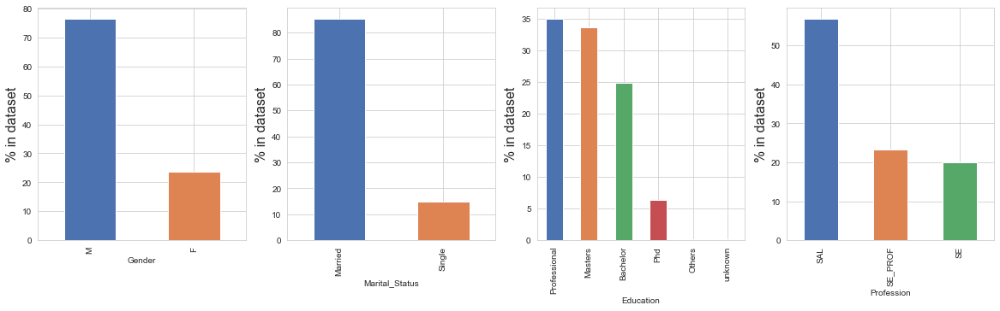

In [96]:
# Plot the percentage of car's with respect to different car features
cat_cols= list(Demographic.columns[Demographic.dtypes == 'object'])
print(cat_cols)
plt.figure(figsize = (20, 17))
for var in cat_cols[:-1]:
        plt.subplot(3,4,cat_cols[:-1].index(var)+1)
        values = (Demographic[var].value_counts(normalize=True)*100)
        ax = values.plot.bar(color=sns.color_palette('deep', 16))
        ax.set_ylabel('% in dataset', fontsize=16)
        ax.set_xlabel(var, fontsize=10)

['Application_ID', 'Age', 'No_of_dependents', 'Income', 'No_of_months_in_current_residence', 'No_of_months_in_current_company', 'Performance_Tag']


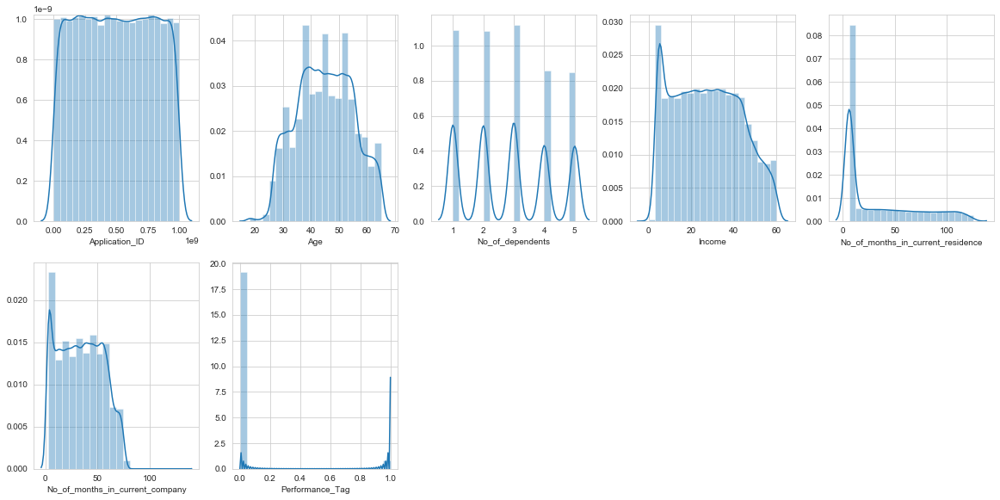

In [97]:
numerical_values= list(Demographic.columns[Demographic.dtypes != 'object'])
print(numerical_values)
plt.figure(figsize=(20, 15))
for var in numerical_values:
        plt.subplot(3,5,numerical_values.index(var)+1)
        sns.distplot( Demographic[var],bins=20)
plt.show()

### Univariate EDA

count    69867.000000
mean        45.001918
std          9.907948
min         18.000000
25%         37.000000
50%         45.000000
75%         53.000000
max         65.000000
Name: Age, dtype: float64


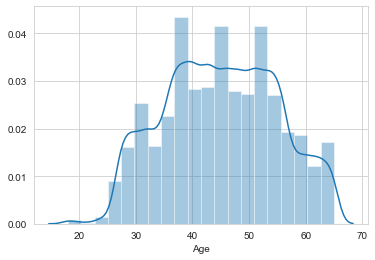

In [98]:
univariate(Demographic.Age)

count    71292.000000
mean        -0.002043
std          0.068123
min         -0.147099
25%         -0.040004
50%          0.001656
75%          0.039004
max          0.094484
Name: Age, dtype: float64


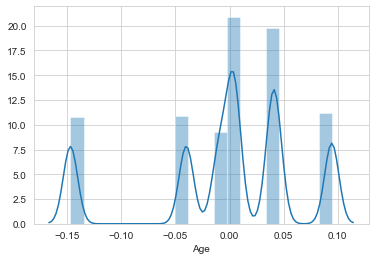

In [99]:
univariate(woe_demographic_data.Age)

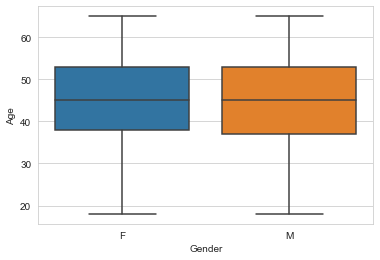

In [100]:
bivariate(Demographic['Gender'],Demographic['Age'])

Professional    24384
Masters         23481
Bachelor        17302
Phd              4463
Others            119
unknown           118
Name: Education, dtype: int64


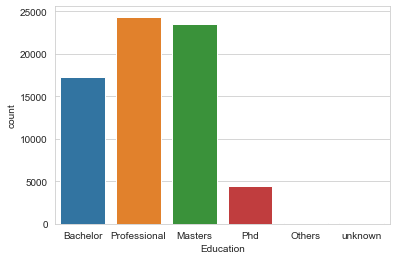

In [101]:
univariate(Demographic['Education'])

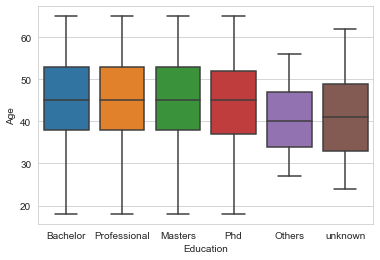

In [102]:
bivariate(Demographic['Education'],Demographic['Age'])

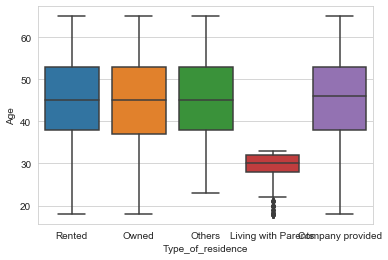

In [103]:
bivariate(Demographic['Type_of_residence'],Demographic['Age'])

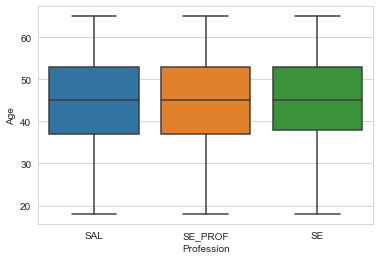

In [104]:
bivariate(Demographic['Profession'],Demographic['Age'])

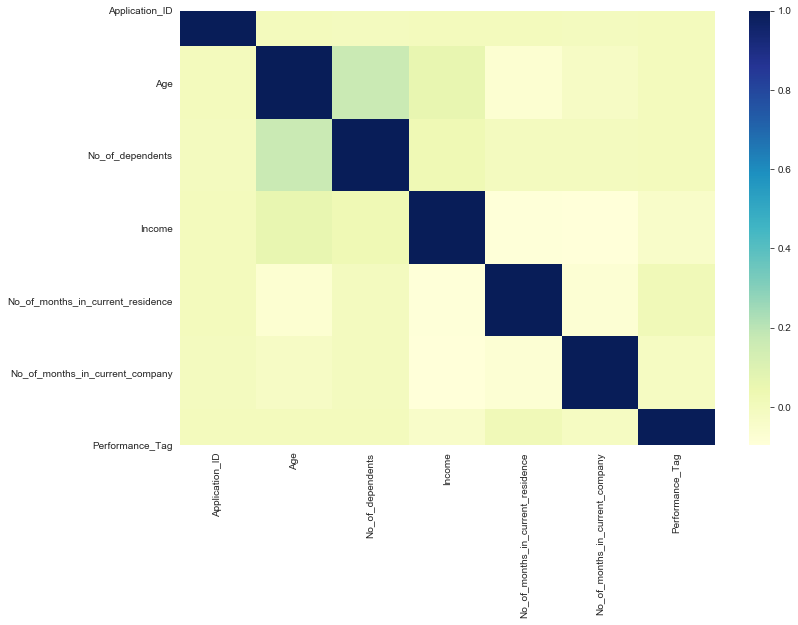

In [105]:
# figure size
plt.figure(figsize=(12, 8))

# heatmap with a color map of choice
sns.heatmap(Demographic.corr(), cmap="YlGnBu")
plt.show()

count    69867.000000
mean         0.248973
std          0.505659
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          3.000000
Name: No_of_times_90_DPD_or_worse_in_last_6_months, dtype: float64


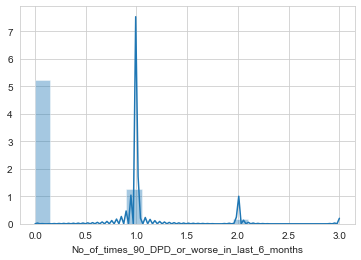

In [106]:
univariate(Credit_Bureau.No_of_times_90_DPD_or_worse_in_last_6_months)

count    69867.000000
mean         0.523495
std          1.000760
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          7.000000
Name: No_of_times_30_DPD_or_worse_in_last_6_months, dtype: float64


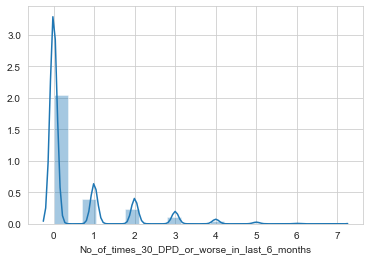

In [107]:
univariate(Credit_Bureau.No_of_times_30_DPD_or_worse_in_last_6_months)

count    6.986700e+04
mean     4.992179e+08
std      2.885551e+08
min      1.004500e+05
25%      2.485673e+08
50%      4.980015e+08
75%      7.498625e+08
max      1.000084e+09
Name: Application_ID, dtype: float64
count    69867.000000
mean         0.248973
std          0.505659
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          3.000000
Name: No_of_times_90_DPD_or_worse_in_last_6_months, dtype: float64
count    69867.000000
mean         0.391673
std          0.771887
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          5.000000
Name: No_of_times_60_DPD_or_worse_in_last_6_months, dtype: float64
count    69867.000000
mean         0.523495
std          1.000760
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          7.000000
Name: No_of_times_30_DPD_or_worse_in_last_6_months, dtype: float64
count    69867.000000
mean         0.414831
std          0

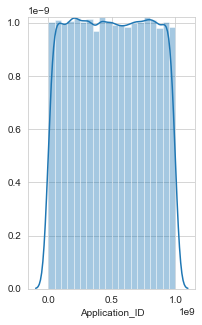

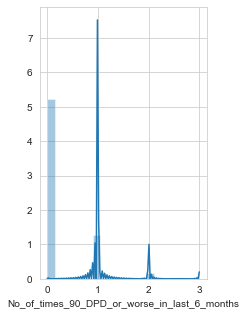

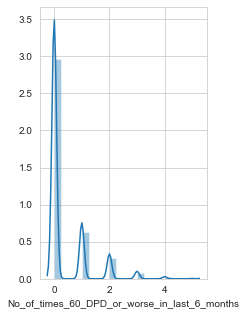

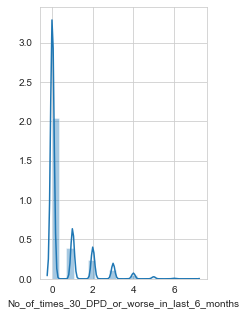

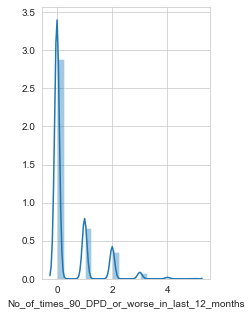

...

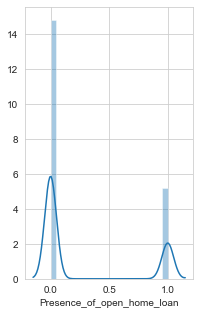

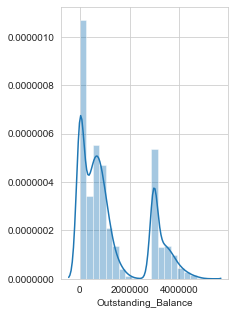

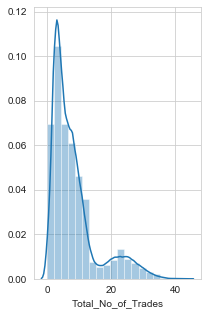

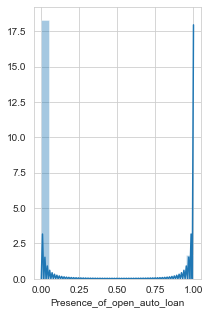

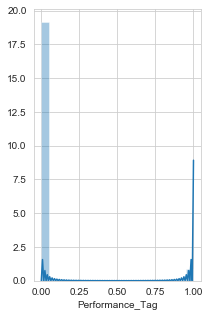

In [108]:

for i in Credit_Bureau.columns:
    # figure size
    plt.figure(figsize=(3, 5))
    univariate(Credit_Bureau[i])

In [109]:
Credit_Bureau.columns

Index(['Application_ID', 'No_of_times_90_DPD_or_worse_in_last_6_months',
       'No_of_times_60_DPD_or_worse_in_last_6_months',
       'No_of_times_30_DPD_or_worse_in_last_6_months',
       'No_of_times_90_DPD_or_worse_in_last_12_months',
       'No_of_times_60_DPD_or_worse_in_last_12_months',
       'No_of_times_30_DPD_or_worse_in_last_12_months',
       'Avgas_CC_Utilization_in_last_12_months',
       'No_of_trades_opened_in_last_6_months',
       'No_of_trades_opened_in_last_12_months',
       'No_of_PL_trades_opened_in_last_6_months',
       'No_of_PL_trades_opened_in_last_12_months',
       'No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)',
       'No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)',
       'Presence_of_open_home_loan', 'Outstanding_Balance',
       'Total_No_of_Trades', 'Presence_of_open_auto_loan', 'Performance_Tag'],
      dtype='object')

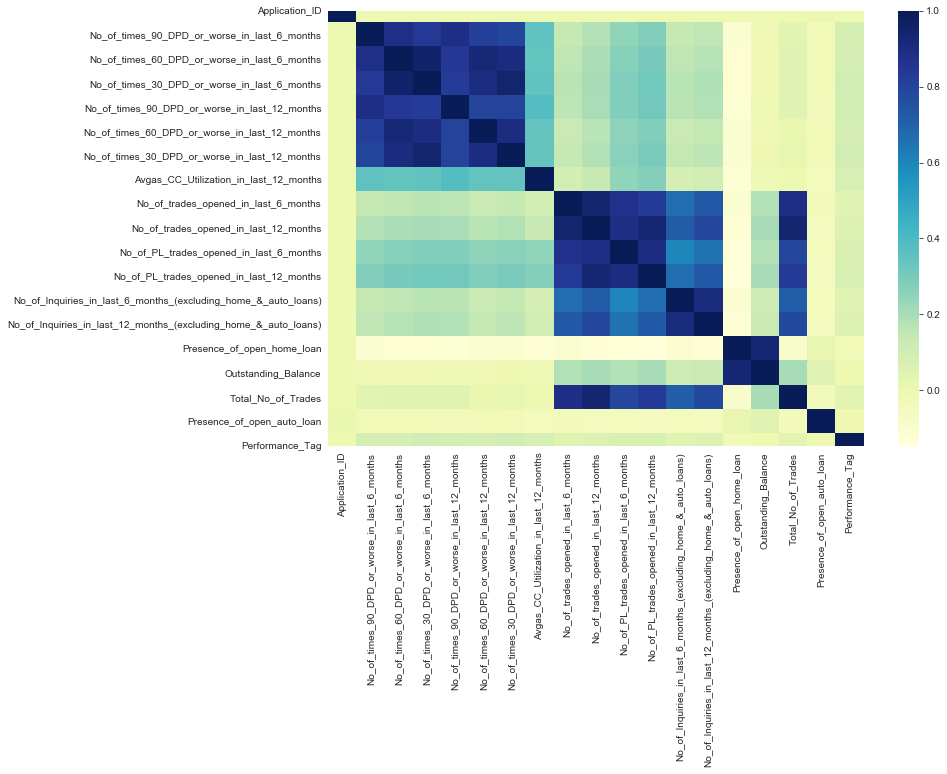

In [110]:
# figure size
plt.figure(figsize=(12, 8))

# heatmap with a color map of choice
sns.heatmap(Credit_Bureau.corr(), cmap="YlGnBu")
plt.show()

In [111]:
def prospects_df(df,variable):
    count_prospects = df.groupby(variable)['Performance_Tag'].sum().reset_index(name = 'count_prospects')
    No_of_prospect = df.groupby(variable)['Performance_Tag'].count().reset_index(name = 'No_of_prospects')
    agg_No = count_prospects.merge(No_of_prospect, on = variable)
    agg_No['No_non_prospects'] = agg_No['No_of_prospects'] - agg_No['count_prospects']
    agg_No['Default_rate'] = 100*(agg_No['count_prospects']/agg_No['No_of_prospects']).round(4)
    return agg_No

In [112]:
prospects_df(Demographic,'Education')

,Education,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,Bachelor,742.0,17302,16560.0,4.29
1,Masters,998.0,23481,22483.0,4.25
2,Others,8.0,119,111.0,6.72
3,Phd,183.0,4463,4280.0,4.10
4,Professional,1011.0,24384,23373.0,4.15
5,unknown,5.0,118,113.0,4.24


In [113]:
Demographic.columns

Index(['Application_ID', 'Age', 'Gender', 'Marital_Status', 'No_of_dependents',
       'Income', 'Education', 'Profession', 'Type_of_residence',
       'No_of_months_in_current_residence', 'No_of_months_in_current_company',
       'Performance_Tag'],
      dtype='object')

In [114]:
prospects_df(Demographic,'Marital_Status')

,Marital_Status,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,Married,2502.0,59550,57048.0,4.20
1,Single,445.0,10317,9872.0,4.31


In [115]:
prospects_df(Demographic,'Gender')

,Gender,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,F,718.0,16506,15788.0,4.35
1,M,2229.0,53361,51132.0,4.18


In [116]:
prospects_df(Demographic,'Profession')

,Profession,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,SAL,1629.0,39686,38057.0,4.10
1,SE,641.0,13925,13284.0,4.60
2,SE_PROF,677.0,16256,15579.0,4.16


In [117]:
prospects_df(Demographic,'No_of_dependents')

,No_of_dependents,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,1.0,667.0,15218,14551.0,4.38
1,2.0,588.0,15128,14540.0,3.89
2,3.0,695.0,15648,14953.0,4.44
3,4.0,494.0,11998,11504.0,4.12
4,5.0,503.0,11875,11372.0,4.24


In [118]:
prospects_df(Demographic,'Type_of_residence')

,Type_of_residence,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,Company provided,73.0,1603,1530.0,4.55
1,Living with Parents,80.0,1778,1698.0,4.50
2,Others,5.0,198,193.0,2.53
3,Owned,593.0,14003,13410.0,4.23
4,Rented,2196.0,52285,50089.0,4.20


In [119]:
Credit_Bureau.columns

Index(['Application_ID', 'No_of_times_90_DPD_or_worse_in_last_6_months',
       'No_of_times_60_DPD_or_worse_in_last_6_months',
       'No_of_times_30_DPD_or_worse_in_last_6_months',
       'No_of_times_90_DPD_or_worse_in_last_12_months',
       'No_of_times_60_DPD_or_worse_in_last_12_months',
       'No_of_times_30_DPD_or_worse_in_last_12_months',
       'Avgas_CC_Utilization_in_last_12_months',
       'No_of_trades_opened_in_last_6_months',
       'No_of_trades_opened_in_last_12_months',
       'No_of_PL_trades_opened_in_last_6_months',
       'No_of_PL_trades_opened_in_last_12_months',
       'No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)',
       'No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)',
       'Presence_of_open_home_loan', 'Outstanding_Balance',
       'Total_No_of_Trades', 'Presence_of_open_auto_loan', 'Performance_Tag'],
      dtype='object')

In [120]:
prospects_df(Credit_Bureau,'No_of_times_90_DPD_or_worse_in_last_6_months')

,No_of_times_90_DPD_or_worse_in_last_6_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1794.0,54664,52870.0,3.28
1,1,970.0,13219,12249.0,7.34
2,2,160.0,1776,1616.0,9.01
3,3,23.0,208,185.0,11.06


In [121]:
prospects_df(Credit_Bureau,'No_of_times_60_DPD_or_worse_in_last_6_months')

,No_of_times_60_DPD_or_worse_in_last_6_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1582.0,51870,50288.0,3.05
1,1,783.0,11130,10347.0,7.04
2,2,389.0,4917,4528.0,7.91
3,3,148.0,1469,1321.0,10.07
4,4,39.0,411,372.0,9.49
5,5,6.0,70,64.0,8.57


In [122]:
prospects_df(Credit_Bureau,'No_of_times_60_DPD_or_worse_in_last_6_months')

,No_of_times_60_DPD_or_worse_in_last_6_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1582.0,51870,50288.0,3.05
1,1,783.0,11130,10347.0,7.04
2,2,389.0,4917,4528.0,7.91
3,3,148.0,1469,1321.0,10.07
4,4,39.0,411,372.0,9.49
5,5,6.0,70,64.0,8.57


In [123]:
prospects_df(Credit_Bureau,'No_of_times_90_DPD_or_worse_in_last_12_months')

,No_of_times_90_DPD_or_worse_in_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1510.0,50492,48982.0,2.99
1,1,796.0,11663,10867.0,6.83
2,2,488.0,6160,5672.0,7.92
3,3,120.0,1244,1124.0,9.65
4,4,28.0,272,244.0,10.29
5,5,5.0,36,31.0,13.89


In [124]:
prospects_df(Credit_Bureau,'No_of_times_60_DPD_or_worse_in_last_12_months')

,No_of_times_60_DPD_or_worse_in_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1378.0,45868,44490.0,3.00
1,1,663.0,12816,12153.0,5.17
2,2,482.0,6414,5932.0,7.51
3,3,274.0,3205,2931.0,8.55
4,4,101.0,1048,947.0,9.64
5,5,36.0,398,362.0,9.05
6,6,13.0,111,98.0,11.71
7,7,0.0,7,7.0,0.00


In [125]:
prospects_df(Credit_Bureau,'No_of_times_30_DPD_or_worse_in_last_12_months')

,No_of_times_30_DPD_or_worse_in_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1316.0,44857,43541.0,2.93
1,1,518.0,11474,10956.0,4.51
2,2,451.0,6116,5665.0,7.37
3,3,349.0,4136,3787.0,8.44
4,4,173.0,1924,1751.0,8.99
5,5,89.0,853,764.0,10.43
6,6,38.0,376,338.0,10.11
7,7,11.0,107,96.0,10.28
8,8,2.0,23,21.0,8.70
9,9,0.0,1,1.0,0.00


In [126]:
prospects_df(Credit_Bureau,'Avgas_CC_Utilization_in_last_12_months')

,Avgas_CC_Utilization_in_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0.0,17.0,503,486.0,3.38
1,1.0,8.0,649,641.0,1.23
2,2.0,22.0,1080,1058.0,2.04
3,3.0,24.0,1604,1580.0,1.50
4,4.0,44.0,1960,1916.0,2.24
...,...,...,...,...,...
109,109.0,3.0,33,30.0,9.09
110,110.0,0.0,30,30.0,0.00
111,111.0,1.0,36,35.0,2.78
112,112.0,2.0,41,39.0,4.88


In [127]:
prospects_df(Credit_Bureau,'No_of_times_30_DPD_or_worse_in_last_12_months')

,No_of_times_30_DPD_or_worse_in_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1316.0,44857,43541.0,2.93
1,1,518.0,11474,10956.0,4.51
2,2,451.0,6116,5665.0,7.37
3,3,349.0,4136,3787.0,8.44
4,4,173.0,1924,1751.0,8.99
5,5,89.0,853,764.0,10.43
6,6,38.0,376,338.0,10.11
7,7,11.0,107,96.0,10.28
8,8,2.0,23,21.0,8.70
9,9,0.0,1,1.0,0.00


In [128]:
prospects_df(Credit_Bureau,'No_of_times_30_DPD_or_worse_in_last_12_months')

,No_of_times_30_DPD_or_worse_in_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1316.0,44857,43541.0,2.93
1,1,518.0,11474,10956.0,4.51
2,2,451.0,6116,5665.0,7.37
3,3,349.0,4136,3787.0,8.44
4,4,173.0,1924,1751.0,8.99
5,5,89.0,853,764.0,10.43
6,6,38.0,376,338.0,10.11
7,7,11.0,107,96.0,10.28
8,8,2.0,23,21.0,8.70
9,9,0.0,1,1.0,0.00


In [129]:
prospects_df(Credit_Bureau,'No_of_times_30_DPD_or_worse_in_last_12_months')

,No_of_times_30_DPD_or_worse_in_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1316.0,44857,43541.0,2.93
1,1,518.0,11474,10956.0,4.51
2,2,451.0,6116,5665.0,7.37
3,3,349.0,4136,3787.0,8.44
4,4,173.0,1924,1751.0,8.99
5,5,89.0,853,764.0,10.43
6,6,38.0,376,338.0,10.11
7,7,11.0,107,96.0,10.28
8,8,2.0,23,21.0,8.70
9,9,0.0,1,1.0,0.00


In [130]:
prospects_df(Credit_Bureau,'No_of_times_30_DPD_or_worse_in_last_12_months')

,No_of_times_30_DPD_or_worse_in_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1316.0,44857,43541.0,2.93
1,1,518.0,11474,10956.0,4.51
2,2,451.0,6116,5665.0,7.37
3,3,349.0,4136,3787.0,8.44
4,4,173.0,1924,1751.0,8.99
5,5,89.0,853,764.0,10.43
6,6,38.0,376,338.0,10.11
7,7,11.0,107,96.0,10.28
8,8,2.0,23,21.0,8.70
9,9,0.0,1,1.0,0.00


In [131]:
prospects_df(Credit_Bureau,'Avgas_CC_Utilization_in_last_12_months')

,Avgas_CC_Utilization_in_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0.0,17.0,503,486.0,3.38
1,1.0,8.0,649,641.0,1.23
2,2.0,22.0,1080,1058.0,2.04
3,3.0,24.0,1604,1580.0,1.50
4,4.0,44.0,1960,1916.0,2.24
...,...,...,...,...,...
109,109.0,3.0,33,30.0,9.09
110,110.0,0.0,30,30.0,0.00
111,111.0,1.0,36,35.0,2.78
112,112.0,2.0,41,39.0,4.88


In [132]:
prospects_df(Credit_Bureau,'No_of_trades_opened_in_last_6_months')

,No_of_trades_opened_in_last_6_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0.0,272.0,12194,11922.0,2.23
1,1.0,534.0,20122,19588.0,2.65
2,2.0,638.0,12116,11478.0,5.27
3,3.0,599.0,9402,8803.0,6.37
4,4.0,436.0,6297,5861.0,6.92
5,5.0,212.0,3665,3453.0,5.78
6,6.0,109.0,2336,2227.0,4.67
7,7.0,65.0,1649,1584.0,3.94
8,8.0,52.0,1154,1102.0,4.51
9,9.0,21.0,618,597.0,3.40


In [133]:
prospects_df(Credit_Bureau,'No_of_trades_opened_in_last_12_months')

,No_of_trades_opened_in_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,111.0,4956,4845.0,2.24
1,1,178.0,11377,11199.0,1.56
2,2,178.0,9323,9145.0,1.91
3,3,198.0,4678,4480.0,4.23
4,4,208.0,4850,4642.0,4.29
5,5,232.0,4547,4315.0,5.10
6,6,267.0,4207,3940.0,6.35
7,7,268.0,4090,3822.0,6.55
8,8,305.0,3799,3494.0,8.03
9,9,214.0,3376,3162.0,6.34


In [134]:
prospects_df(Credit_Bureau,'No_of_PL_trades_opened_in_last_6_months')

,No_of_PL_trades_opened_in_last_6_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,699.0,31080,30381.0,2.25
1,1,691.0,13546,12855.0,5.10
2,2,803.0,12565,11762.0,6.39
3,3,501.0,7949,7448.0,6.30
4,4,197.0,3341,3144.0,5.90
5,5,48.0,1090,1042.0,4.40
6,6,8.0,296,288.0,2.70


In [135]:
prospects_df(Credit_Bureau,'No_of_PL_trades_opened_in_last_12_months')

,No_of_PL_trades_opened_in_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,457.0,25824,25367.0,1.77
1,1,247.0,6641,6394.0,3.72
2,2,366.0,6830,6464.0,5.36
3,3,507.0,8130,7623.0,6.24
4,4,535.0,7903,7368.0,6.77
5,5,391.0,6189,5798.0,6.32
6,6,243.0,4023,3780.0,6.04
7,7,109.0,2223,2114.0,4.90
8,8,50.0,1172,1122.0,4.27
9,9,28.0,601,573.0,4.66


In [136]:
prospects_df(Credit_Bureau,'No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)')

,No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans),count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,527.0,25069,24542.0,2.10
1,1,658.0,13175,12517.0,4.99
2,2,665.0,12831,12166.0,5.18
3,3,517.0,7258,6741.0,7.12
4,4,269.0,4248,3979.0,6.33
5,5,150.0,3019,2869.0,4.97
6,6,73.0,1750,1677.0,4.17
7,7,40.0,1149,1109.0,3.48
8,8,33.0,835,802.0,3.95
9,9,13.0,425,412.0,3.06


In [137]:
prospects_df(Credit_Bureau,'No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)')

,No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans),count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,307.0,20581,20274.0,1.49
1,1,155.0,3899,3744.0,3.98
2,2,382.0,7907,7525.0,4.83
3,3,443.0,8978,8535.0,4.93
4,4,380.0,7113,6733.0,5.34
5,5,362.0,4927,4565.0,7.35
6,6,247.0,3614,3367.0,6.83
7,7,209.0,2992,2783.0,6.99
8,8,141.0,2345,2204.0,6.01
9,9,71.0,1777,1706.0,4.00


In [138]:
prospects_df(Credit_Bureau,'Presence_of_open_home_loan')

,Presence_of_open_home_loan,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0.0,2340.0,51796,49456.0,4.52
1,1.0,607.0,18071,17464.0,3.36


In [139]:
prospects_df(Credit_Bureau,'Outstanding_Balance')

,Outstanding_Balance,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0.0,44.0,1081,1037.0,4.07
1,1.0,0.0,1,1.0,0.00
2,2.0,0.0,1,1.0,0.00
3,4.0,0.0,1,1.0,0.00
4,5.0,0.0,5,5.0,0.00
...,...,...,...,...,...
63939,5046778.0,1.0,1,0.0,100.00
63940,5047711.0,0.0,1,1.0,0.00
63941,5052166.0,1.0,1,0.0,100.00
63942,5151848.0,0.0,1,1.0,0.00


In [140]:
prospects_df(Credit_Bureau,'Total_No_of_Trades')

,Total_No_of_Trades,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,42.0,988,946.0,4.25
1,1,44.0,2926,2882.0,1.50
2,2,106.0,6766,6660.0,1.57
3,3,184.0,8615,8431.0,2.14
4,4,205.0,7490,7285.0,2.74
5,5,230.0,5714,5484.0,4.03
6,6,237.0,4966,4729.0,4.77
7,7,270.0,4828,4558.0,5.59
8,8,296.0,4533,4237.0,6.53
9,9,282.0,3906,3624.0,7.22


In [141]:
prospects_df(Credit_Bureau,'Presence_of_open_auto_loan')

,Presence_of_open_auto_loan,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,2728.0,63937,61209.0,4.27
1,1,219.0,5930,5711.0,3.69


### WOE,IV calculation for credit_bureau

In [142]:
## evaluating woe and iv for creditbureau data (without any imputation)
iv_credit_bureau, woe_credit_bureau = iv_woe(data = Credit_Bureau_unimpute.drop(['Application_ID'],axis=1), target = 'Performance_Tag', 
                              bins=8, show_woe = True)

Information value of No_of_times_90_DPD_or_worse_in_last_6_months is 0.162983
                                       Variable  Cutoff      N  Defaults  \
0  No_of_times_90_DPD_or_worse_in_last_6_months       0  54666    1794.0   
1  No_of_times_90_DPD_or_worse_in_last_6_months       1  13220     971.0   
2  No_of_times_90_DPD_or_worse_in_last_6_months       2   1776     160.0   
3  No_of_times_90_DPD_or_worse_in_last_6_months       3    208      23.0   

   % of Defaults  Non-Defaults  % of Non-Defaults       WoE        IV  
0       0.608548       52872.0           0.790054 -0.261025  0.047378  
1       0.329376       12249.0           0.183034  0.587528  0.085980  
2       0.054274        1616.0           0.024148  0.809865  0.024398  
3       0.007802         185.0           0.002764  1.037539  0.005227  
Information value of No_of_times_60_DPD_or_worse_in_last_6_months is 0.211539
                                       Variable  Cutoff      N  Defaults  \
0  No_of_times_60_DPD_or_wo

Information value of No_of_trades_opened_in_last_12_months is 0.292949
                                Variable         Cutoff      N  Defaults  \
0  No_of_trades_opened_in_last_12_months  (-0.001, 1.0]  16333     289.0   
1  No_of_trades_opened_in_last_12_months     (1.0, 2.0]   9323     178.0   
2  No_of_trades_opened_in_last_12_months     (2.0, 3.0]   4679     198.0   
3  No_of_trades_opened_in_last_12_months     (3.0, 5.0]   9398     441.0   
4  No_of_trades_opened_in_last_12_months     (5.0, 7.0]   8298     535.0   
5  No_of_trades_opened_in_last_12_months     (7.0, 9.0]   7175     519.0   
6  No_of_trades_opened_in_last_12_months    (9.0, 12.0]   6699     450.0   
7  No_of_trades_opened_in_last_12_months   (12.0, 28.0]   7965     338.0   

   % of Defaults  Non-Defaults  % of Non-Defaults       WoE        IV  
0       0.098033       16044.0           0.239742 -0.894263  0.126725  
1       0.060380        9145.0           0.136652 -0.816778  0.062297  
2       0.067164        4481

                     Variable  Cutoff      N  Defaults  % of Defaults  \
0  Presence_of_open_auto_loan       0  63940    2729.0       0.925712   
1  Presence_of_open_auto_loan       1   5930     219.0       0.074288   

   Non-Defaults  % of Non-Defaults       WoE        IV  
0       61211.0           0.914662  0.012009  0.000133  
1        5711.0           0.085338 -0.138677  0.001532  


In [143]:
iv_credit_bureau.sort_values('IV',ascending=False)

,Variable,IV
0,Avgas_CC_Utilization_in_last_12_months,0.306828
0,No_of_trades_opened_in_last_12_months,0.292949
0,No_of_PL_trades_opened_in_last_12_months,0.256190
0,Outstanding_Balance,0.246929
0,No_of_times_30_DPD_or_worse_in_last_6_months,0.244460
0,Total_No_of_Trades,0.242566
0,No_of_PL_trades_opened_in_last_6_months,0.224342
0,No_of_times_90_DPD_or_worse_in_last_12_months,0.216015
0,No_of_times_60_DPD_or_worse_in_last_6_months,0.211539
0,No_of_times_30_DPD_or_worse_in_last_12_months,0.191285


IV value for the Avgas_CC_Utilization_12_months and Trades_opened_last_12_months variables are among highest of all creditbureau variables. The next significant variables to follow are PL_Trades_opened_last_12_months, Outstanding_Balance and No_30_DPD_last_6_months

In [144]:
woe_credit_bureau

,% of Defaults,% of Non-Defaults,Cutoff,Defaults,IV,N,Non-Defaults,Variable,WoE,max_val,min_val
0,0.608548,0.790054,0,1794.0,0.047378,54666,52872.0,No_of_times_90_DPD_or_worse_in_last_6_months,-0.261025,0.0,0.0
1,0.329376,0.183034,1,971.0,0.085980,13220,12249.0,No_of_times_90_DPD_or_worse_in_last_6_months,0.587528,0.0,0.0
2,0.054274,0.024148,2,160.0,0.024398,1776,1616.0,No_of_times_90_DPD_or_worse_in_last_6_months,0.809865,0.0,0.0
3,0.007802,0.002764,3,23.0,0.005227,208,185.0,No_of_times_90_DPD_or_worse_in_last_6_months,1.037539,0.0,0.0
0,0.536635,0.751457,0,1582.0,0.072330,51871,50289.0,No_of_times_60_DPD_or_worse_in_last_6_months,-0.336696,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
5,0.170624,0.099071,"(8.0, 10.0]",503.0,0.038899,7133,6630.0,Total_No_of_Trades,0.543631,10.0,8.0
6,0.167571,0.098697,"(10.0, 16.0]",494.0,0.036459,7099,6605.0,Total_No_of_Trades,0.529354,16.0,10.0
7,0.113976,0.126610,"(16.0, 44.0]",336.0,0.001328,8809,8473.0,Total_No_of_Trades,-0.105128,44.0,16.0
0,0.925712,0.914662,0,2729.0,0.000133,63940,61211.0,Presence_of_open_auto_loan,0.012009,0.0,0.0


In [145]:
#the overall IV for the creditbureau dataset
iv_credit_bureau.IV.sum()

3.258668

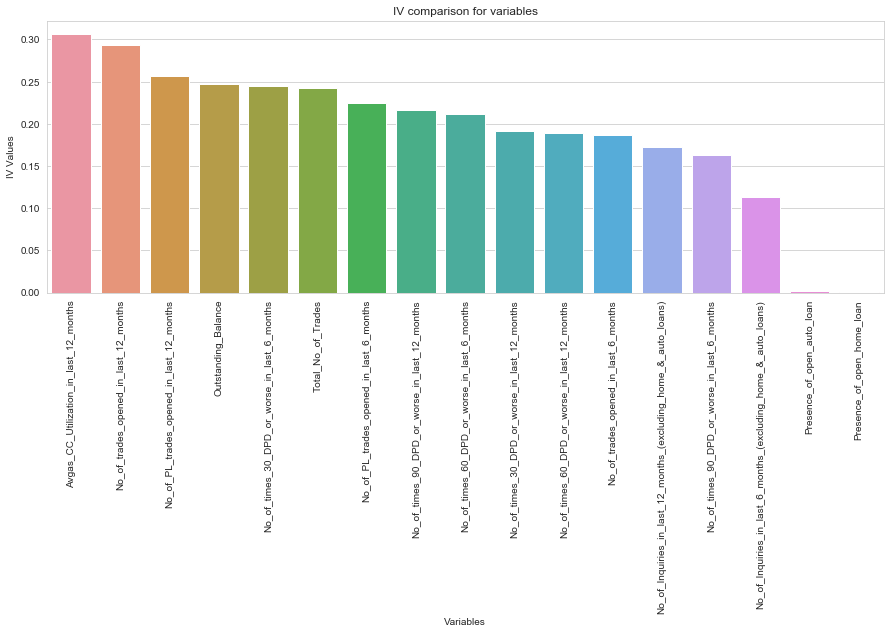

In [146]:
## plotting all the consolidated IV values of the creditbureau variable
plt.figure(figsize=(15,5))
ax = sns.barplot(x='Variable', y='IV', data=iv_credit_bureau.sort_values(by='IV', ascending = False))
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.title('IV comparison for variables')
plt.xlabel('Variables')
plt.ylabel('IV Values')
plt.show()

### Combined Data : Demographic,Credit_Bureau

In [147]:
#Are there any Application ID present in  Demographic data and which are not present in Credit_Bureau data? Answer yes or no: Y/N answer:no
if(len(set(Demographic['Application_ID']).difference(set(Credit_Bureau['Application_ID'])))==0) :
    print("No,All Application ID's Present")
else : print("Yes,there are missing ")

No,All Application ID's Present


In [148]:
#Merge the two data frames so that all variables (columns) in the Demographic dataframe are added to the Credit_Bureau data frame.
#Name the merged frame master_frame. How many observations are present in master_frame?

#Using the left merge on companies and rounds2 dataframe derived the master dataframe.
master_df =  pd.merge(Demographic, Credit_Bureau, how='inner', on=['Application_ID'])

In [149]:
#looking Shape of Data
print("Master data Shape:",master_df.shape)

Master data Shape: (69867, 30)


In [150]:
# Copy the dataset into a back up dataframe for future use
master_df_copy = master_df

In [151]:
# percentage of missing values in each column
round(master_df.isnull().sum()/len(master_df.index), 2)*100

Application_ID                                                     0.0
Age                                                                0.0
Gender                                                             0.0
Marital_Status                                                     0.0
No_of_dependents                                                   0.0
Income                                                             0.0
Education                                                          0.0
Profession                                                         0.0
Type_of_residence                                                  0.0
No_of_months_in_current_residence                                  0.0
No_of_months_in_current_company                                    0.0
Performance_Tag_x                                                  0.0
No_of_times_90_DPD_or_worse_in_last_6_months                       0.0
No_of_times_60_DPD_or_worse_in_last_6_months                       0.0
No_of_

In [152]:
master_df.columns

Index(['Application_ID', 'Age', 'Gender', 'Marital_Status', 'No_of_dependents',
       'Income', 'Education', 'Profession', 'Type_of_residence',
       'No_of_months_in_current_residence', 'No_of_months_in_current_company',
       'Performance_Tag_x', 'No_of_times_90_DPD_or_worse_in_last_6_months',
       'No_of_times_60_DPD_or_worse_in_last_6_months',
       'No_of_times_30_DPD_or_worse_in_last_6_months',
       'No_of_times_90_DPD_or_worse_in_last_12_months',
       'No_of_times_60_DPD_or_worse_in_last_12_months',
       'No_of_times_30_DPD_or_worse_in_last_12_months',
       'Avgas_CC_Utilization_in_last_12_months',
       'No_of_trades_opened_in_last_6_months',
       'No_of_trades_opened_in_last_12_months',
       'No_of_PL_trades_opened_in_last_6_months',
       'No_of_PL_trades_opened_in_last_12_months',
       'No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)',
       'No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)',
       'Presence_of_open_home_

In [153]:
master_df.head()

,Application_ID,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,...,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans),No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans),Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,Performance_Tag_y
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,...,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,...,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,...,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,...,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,...,1,0,0,0,0,1.0,3014283.0,4,0,0.0


In [154]:
master_df.drop('Performance_Tag_x',axis=1,inplace=True)
master_df.columns = master_df.columns.str.replace('Performance_Tag_y', 'Performance_Tag')

In [155]:
# feature type summary
master_df.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69867 entries, 0 to 69866
Data columns (total 29 columns):
Application_ID                                                     69867 non-null int64
Age                                                                69867 non-null int64
Gender                                                             69867 non-null object
Marital_Status                                                     69867 non-null object
No_of_dependents                                                   69867 non-null float64
Income                                                             69867 non-null float64
Education                                                          69867 non-null object
Profession                                                         69867 non-null object
Type_of_residence                                                  69867 non-null object
No_of_months_in_current_residence                                  69867 non-null int64
No

In [156]:
master_df.describe()

,Application_ID,Age,No_of_dependents,Income,No_of_months_in_current_residence,No_of_months_in_current_company,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,...,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans),No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans),Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,Performance_Tag
count,6.986700e+04,69867.000000,69867.000000,69867.000000,69867.000000,69867.000000,69867.000000,69867.000000,69867.000000,69867.000000,...,69867.000000,69867.000000,69867.000000,69867.000000,69867.000000,69867.000000,6.986700e+04,69867.000000,69867.000000,69867.000000
mean,4.992179e+08,45.001918,2.859504,27.440888,34.608299,34.198921,0.248973,0.391673,0.523495,0.414831,...,5.784977,1.189589,2.363462,1.757997,3.525012,0.258649,1.248491e+06,8.174775,0.084876,0.042180
std,2.885551e+08,9.907948,1.385518,15.446660,36.846256,20.349768,0.505659,0.771887,1.000760,0.763508,...,5.095437,1.352690,2.423655,1.985052,3.611761,0.437895,1.286047e+06,7.152940,0.278698,0.201001
min,1.004500e+05,18.000000,1.000000,0.000000,6.000000,3.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,2.485673e+08,37.000000,2.000000,14.000000,6.000000,17.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.066365e+05,3.000000,0.000000,0.000000
50%,4.980015e+08,45.000000,3.000000,27.000000,10.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,4.000000,1.000000,2.000000,1.000000,3.000000,0.000000,7.727330e+05,6.000000,0.000000,0.000000
75%,7.498625e+08,53.000000,4.000000,40.000000,61.000000,51.000000,0.000000,1.000000,1.000000,1.000000,...,9.000000,2.000000,4.000000,3.000000,5.000000,1.000000,2.924628e+06,10.000000,0.000000,0.000000
max,1.000084e+09,65.000000,5.000000,60.000000,126.000000,133.000000,3.000000,5.000000,7.000000,5.000000,...,28.000000,6.000000,12.000000,10.000000,20.000000,1.000000,5.218801e+06,44.000000,1.000000,1.000000


In [157]:
master_df['Performance_Tag']=master_df['Performance_Tag'].astype(int)

In [158]:
### Checking the Conversion Rate
Conversion_Rate = (sum(master_df['Performance_Tag'])/len(master_df['Performance_Tag'].index))*100
Conversion_Rate

4.218014227031359

In [159]:
## evaluating woe and iv for combined demographics and creditbureau data 
iv_master_df, woe_master_df = iv_woe(data = master_df.drop(['Application_ID'],axis=1), target = 'Performance_Tag', 
                              bins=8, show_woe = True)

Information value of Age is 0.004898
  Variable          Cutoff      N  Defaults  % of Defaults  Non-Defaults  \
0      Age  (17.999, 33.0]  10100       414       0.140482          9686   
1      Age    (33.0, 37.0]   7384       326       0.110621          7058   
2      Age    (37.0, 41.0]   9444       436       0.147947          9008   
3      Age    (41.0, 45.0]   9238       375       0.127248          8863   
4      Age    (45.0, 49.0]   9090       398       0.135053          8692   
5      Age    (49.0, 53.0]   9093       333       0.112996          8760   
6      Age    (53.0, 57.0]   7619       335       0.113675          7284   
7      Age    (57.0, 65.0]   7899       330       0.111978          7569   

   % of Non-Defaults       WoE        IV  
0           0.144740 -0.029861  0.000127  
1           0.105469  0.047691  0.000246  
2           0.134608  0.094484  0.001260  
3           0.132442 -0.040004  0.000208  
4           0.129886  0.039004  0.000202  
5           0.130903

Information value of No_of_times_30_DPD_or_worse_in_last_6_months is 0.244238
                                       Variable  Cutoff      N  Defaults  \
0  No_of_times_30_DPD_or_worse_in_last_6_months       0  50098      1455   
1  No_of_times_30_DPD_or_worse_in_last_6_months       1   9500       622   
2  No_of_times_30_DPD_or_worse_in_last_6_months       2   5897       466   
3  No_of_times_30_DPD_or_worse_in_last_6_months       3   2830       245   
4  No_of_times_30_DPD_or_worse_in_last_6_months       4   1045       107   
5  No_of_times_30_DPD_or_worse_in_last_6_months       5    386        43   
6  No_of_times_30_DPD_or_worse_in_last_6_months       6     96         8   
7  No_of_times_30_DPD_or_worse_in_last_6_months       7     15         1   

   % of Defaults  Non-Defaults  % of Non-Defaults       WoE        IV  
0       0.493722         48643           0.726883 -0.386792  0.090185  
1       0.211062          8878           0.132666  0.464319  0.036401  
2       0.158127     

Information value of No_of_PL_trades_opened_in_last_12_months is 0.25598
                                   Variable         Cutoff      N  Defaults  \
0  No_of_PL_trades_opened_in_last_12_months  (-0.001, 1.0]  32465       704   
1  No_of_PL_trades_opened_in_last_12_months     (1.0, 2.0]   6830       366   
2  No_of_PL_trades_opened_in_last_12_months     (2.0, 3.0]   8130       507   
3  No_of_PL_trades_opened_in_last_12_months     (3.0, 4.0]   7903       535   
4  No_of_PL_trades_opened_in_last_12_months     (4.0, 5.0]   6189       391   
5  No_of_PL_trades_opened_in_last_12_months    (5.0, 12.0]   8350       444   

   % of Defaults  Non-Defaults  % of Non-Defaults       WoE        IV  
0       0.238887         31761           0.474611 -0.686506  0.161826  
1       0.124194          6464           0.096593  0.251340  0.006937  
2       0.172039          7623           0.113912  0.412296  0.023966  
3       0.181541          7368           0.110102  0.500075  0.035725  
4       0.132

In [160]:
iv_master_df.sort_values('IV',ascending=False)

,Variable,IV
0,Avgas_CC_Utilization_in_last_12_months,0.303577
0,No_of_trades_opened_in_last_12_months,0.291660
0,No_of_PL_trades_opened_in_last_12_months,0.255980
0,Outstanding_Balance,0.247068
0,No_of_times_30_DPD_or_worse_in_last_6_months,0.244238
0,Total_No_of_Trades,0.238478
0,No_of_PL_trades_opened_in_last_6_months,0.224242
0,No_of_times_90_DPD_or_worse_in_last_12_months,0.215643
0,No_of_times_60_DPD_or_worse_in_last_6_months,0.211264
0,No_of_times_30_DPD_or_worse_in_last_12_months,0.190993


In [161]:
#the overall IV for the combined imputed dataset
iv_master_df.IV.sum()

3.4108930000000006

In [162]:
## displaying the WoE and IV values for all variables for combined demographics and creditbureau data set
woe_master_df.sort_values(['Variable','WoE'], ascending = False)

,% of Defaults,% of Non-Defaults,Cutoff,Defaults,IV,N,Non-Defaults,Variable,WoE,max_val,min_val
0,0.024771,0.022863,Company provided,73,0.000153,1603,1530,Type_of_residence,0.080147,0.0,0.000
1,0.027146,0.025374,Living with Parents,80,0.000120,1778,1698,Type_of_residence,0.067530,0.0,0.000
3,0.201222,0.200389,Owned,593,0.000003,14003,13410,Type_of_residence,0.004149,0.0,0.000
4,0.745165,0.748491,Rented,2196,0.000015,52285,50089,Type_of_residence,-0.004454,0.0,0.000
2,0.001697,0.002884,Others,5,0.000630,198,193,Type_of_residence,-0.530542,0.0,0.000
...,...,...,...,...,...,...,...,...,...,...,...
4,0.135053,0.129886,"(45.0, 49.0]",398,0.000202,9090,8692,Age,0.039004,49.0,45.000
7,0.111978,0.113105,"(57.0, 65.0]",330,0.000011,7899,7569,Age,-0.010013,65.0,57.000
0,0.140482,0.144740,"(17.999, 33.0]",414,0.000127,10100,9686,Age,-0.029861,33.0,17.999
3,0.127248,0.132442,"(41.0, 45.0]",375,0.000208,9238,8863,Age,-0.040004,45.0,41.000


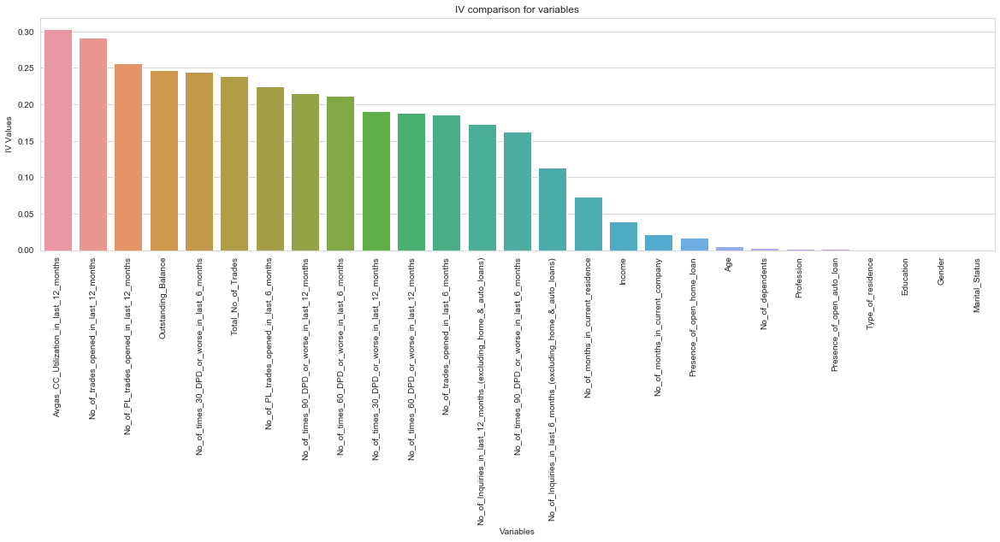

In [163]:
## plotting all the consolidated IV values of the combined dataset
plt.figure(figsize=(20,5))
ax = sns.barplot(x='Variable', y='IV', data=iv_master_df.sort_values(by='IV', ascending = False))
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.title('IV comparison for variables')
plt.xlabel('Variables')
plt.ylabel('IV Values')
plt.show()

The most significant variables for the combined data are Avgas_CC_Utilization_12_months, Trades_opened_last_12_months, PL_Trades_opened_last_12_months, Outstanding_Balance and No_30_DPD_last_6_months.

### WOE,IV Combined Unimputed Data

In [164]:
#merging the Unimputed Data
master_df_unimpute = pd.merge(Demographic_unimpute, Credit_Bureau_unimpute, how='inner', on=['Application_ID'])

In [165]:
#looking Shape of Data
print("Master data Shape:",master_df.shape)

Master data Shape: (69867, 29)


In [166]:
master_df_unimpute.drop('Performance_Tag_x',axis=1,inplace=True)
master_df_unimpute.columns = master_df_unimpute.columns.str.replace('Performance_Tag_y', 'Performance_Tag')

In [167]:
## evaluating woe and iv for combined demographics and creditbureau data (without any imputation)
iv_master_df_unimpute, woe_master_df_unimpute = iv_woe(data = master_df_unimpute.drop(['Application_ID'],axis=1), target = 'Performance_Tag', 
                              bins=8, show_woe = True)

Information value of Age is 0.004531
  Variable          Cutoff     N  Defaults  % of Defaults  Non-Defaults  \
0      Age  (-3.001, 32.0]  8728     371.0       0.125848        8357.0   
1      Age    (32.0, 37.0]  8758     370.0       0.125509        8388.0   
2      Age    (37.0, 41.0]  9444     436.0       0.147897        9008.0   
3      Age    (41.0, 45.0]  9238     375.0       0.127205        8863.0   
4      Age    (45.0, 49.0]  9090     398.0       0.135007        8692.0   
5      Age    (49.0, 53.0]  9093     333.0       0.112958        8760.0   
6      Age    (53.0, 57.0]  7620     335.0       0.113636        7285.0   
7      Age    (57.0, 65.0]  7899     330.0       0.111940        7569.0   

   % of Non-Defaults       WoE        IV  
0           0.124877  0.007748  0.000008  
1           0.125340  0.001346  0.000000  
2           0.134604  0.094175  0.001252  
3           0.132438 -0.040314  0.000211  
4           0.129883  0.038694  0.000198  
5           0.130899 -0.14740

Information value of No_of_times_30_DPD_or_worse_in_last_6_months is 0.24446
                                       Variable  Cutoff      N  Defaults  \
0  No_of_times_30_DPD_or_worse_in_last_6_months       0  50099    1455.0   
1  No_of_times_30_DPD_or_worse_in_last_6_months       1   9501     623.0   
2  No_of_times_30_DPD_or_worse_in_last_6_months       2   5898     466.0   
3  No_of_times_30_DPD_or_worse_in_last_6_months       3   2830     245.0   
4  No_of_times_30_DPD_or_worse_in_last_6_months       4   1045     107.0   
5  No_of_times_30_DPD_or_worse_in_last_6_months       5    386      43.0   
6  No_of_times_30_DPD_or_worse_in_last_6_months       6     96       8.0   
7  No_of_times_30_DPD_or_worse_in_last_6_months       7     15       1.0   

   % of Defaults  Non-Defaults  % of Non-Defaults       WoE        IV  
0       0.493555       48644.0           0.726876 -0.387122  0.090324  
1       0.211330        8878.0           0.132662  0.465616  0.036629  
2       0.158073      

Information value of No_of_PL_trades_opened_in_last_12_months is 0.25619
                                   Variable         Cutoff      N  Defaults  \
0  No_of_PL_trades_opened_in_last_12_months  (-0.001, 1.0]  32466     704.0   
1  No_of_PL_trades_opened_in_last_12_months     (1.0, 2.0]   6830     366.0   
2  No_of_PL_trades_opened_in_last_12_months     (2.0, 3.0]   8131     508.0   
3  No_of_PL_trades_opened_in_last_12_months     (3.0, 4.0]   7904     535.0   
4  No_of_PL_trades_opened_in_last_12_months     (4.0, 5.0]   6189     391.0   
5  No_of_PL_trades_opened_in_last_12_months    (5.0, 12.0]   8350     444.0   

   % of Defaults  Non-Defaults  % of Non-Defaults       WoE        IV  
0       0.238806       31762.0           0.474612 -0.686847  0.161963  
1       0.124152        6464.0           0.096590  0.251031  0.006919  
2       0.172320        7623.0           0.113909  0.413957  0.024180  
3       0.181479        7369.0           0.110113  0.499630  0.035656  
4       0.132

In [168]:
iv_master_df_unimpute.sort_values('IV',ascending=False)

,Variable,IV
0,Avgas_CC_Utilization_in_last_12_months,0.306828
0,No_of_trades_opened_in_last_12_months,0.292949
0,No_of_PL_trades_opened_in_last_12_months,0.256190
0,Outstanding_Balance,0.246929
0,No_of_times_30_DPD_or_worse_in_last_6_months,0.244460
0,Total_No_of_Trades,0.242566
0,No_of_PL_trades_opened_in_last_6_months,0.224342
0,No_of_times_90_DPD_or_worse_in_last_12_months,0.216015
0,No_of_times_60_DPD_or_worse_in_last_6_months,0.211539
0,No_of_times_30_DPD_or_worse_in_last_12_months,0.191285


In [169]:
## displaying the WoE and IV values for all variables for combined demographics and creditbureau data set
woe_master_df_unimpute.sort_values(['Variable','WoE'], ascending = False)

,% of Defaults,% of Non-Defaults,Cutoff,Defaults,IV,N,Non-Defaults,Variable,WoE,max_val,min_val
2,0.000170,0.000120,NULL,0.0,0.000018,8,8.0,Type_of_residence,0.349812,0.0,0.000
0,0.024763,0.022877,Company provided,73.0,0.000149,1604,1531.0,Type_of_residence,0.079184,0.0,0.000
1,0.027137,0.025388,Living with Parents,80.0,0.000117,1779,1699.0,Type_of_residence,0.066632,0.0,0.000
4,0.201153,0.200383,Owned,593.0,0.000003,14003,13410.0,Type_of_residence,0.003839,0.0,0.000
5,0.745251,0.748349,Rented,2197.0,0.000013,52278,50081.0,Type_of_residence,-0.004148,0.0,0.000
...,...,...,...,...,...,...,...,...,...,...,...
0,0.125848,0.124877,"(-3.001, 32.0]",371.0,0.000008,8728,8357.0,Age,0.007748,32.0,-3.001
1,0.125509,0.125340,"(32.0, 37.0]",370.0,0.000000,8758,8388.0,Age,0.001346,37.0,32.000
7,0.111940,0.113102,"(57.0, 65.0]",330.0,0.000012,7899,7569.0,Age,-0.010323,65.0,57.000
3,0.127205,0.132438,"(41.0, 45.0]",375.0,0.000211,9238,8863.0,Age,-0.040314,45.0,41.000


In [170]:
#the overall IV for the combined unimputed dataset
iv_master_df_unimpute.IV.sum()

3.3989000000000003

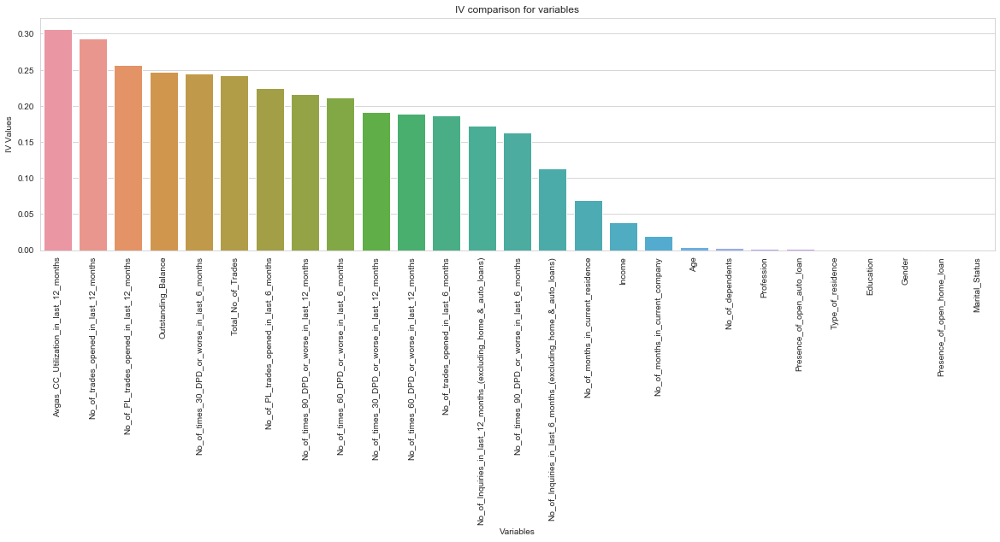

In [171]:
## plotting all the consolidated IV values of the combined dataset
plt.figure(figsize=(20,5))
ax = sns.barplot(x='Variable', y='IV', data=iv_master_df_unimpute.sort_values(by='IV', ascending = False))
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.title('IV comparison for variables')
plt.xlabel('Variables')
plt.ylabel('IV Values')
plt.show()

The most significant variables for the combined data are Avgas_CC_Utilization_12_months, Trades_opened_last_12_months, PL_Trades_opened_last_12_months, Outstanding_Balance and No_30_DPD_last_6_months.

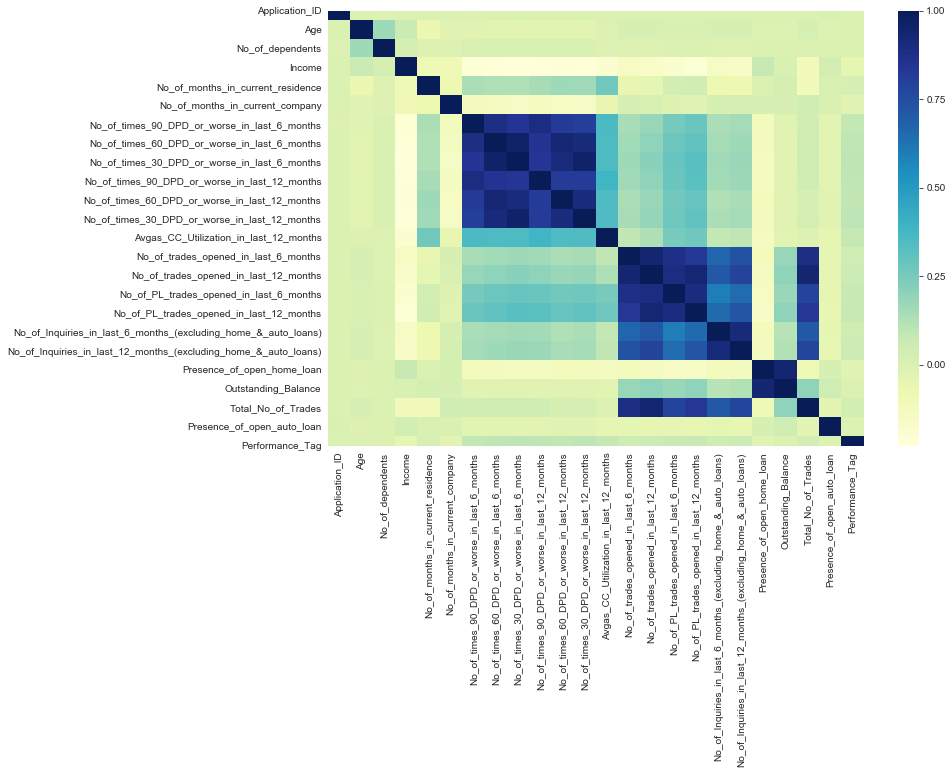

In [172]:
# figure size
plt.figure(figsize=(12, 8))

# heatmap with a color map of choice
sns.heatmap(master_df_unimpute.corr(), cmap="YlGnBu")
plt.show()

In [173]:
## creating WoE dataframe of combined data
woe_all_data = create_woe_dataframe(master_df_unimpute,woe_master_df_unimpute)
woe_all_data.head()

,Application_ID,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,...,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans),No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans),Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,Performance_Tag
0,954457215.0,0.038694,0.031865,-0.003915,-0.085600,-0.205632,0.018291,-0.027815,-0.004148,-0.060774,...,-0.816778,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,-0.939076,-0.448162,0.012009,0.0
1,432830445.0,0.007748,-0.010008,-0.003915,-0.025601,-0.330883,-0.018284,-0.013607,-0.004148,-0.060774,...,-0.816778,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,-0.819813,0.039354,0.012009,0.0
2,941387308.0,0.007748,-0.010008,0.022916,-0.085600,-0.179070,0.018291,-0.013607,-0.004148,-0.060774,...,-0.894263,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,-0.939076,-0.878091,0.012009,0.0
3,392161677.0,-0.040314,-0.010008,-0.003915,0.039776,-0.330883,0.018291,0.091115,-0.004148,-0.060774,...,-0.894263,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,0.201618,-0.448162,-0.138677,0.0
4,182011211.0,0.001346,0.031865,-0.003915,0.004081,-0.179070,-0.018284,-0.027815,-0.004148,-0.060774,...,-0.894263,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,-0.939076,-0.448162,0.012009,0.0


In [174]:
## saving the WoE dataframe to csv file
woe_all_data.to_csv('woe_all_data.csv',index=False)

### Model Building

### Models Building for Demographic Data (Non-transformed)

In [175]:
# Copy the demographic_original to demo
Demographic_model_df = Demographic.copy()

In [176]:
Demographic_model_df.head()

,Application_ID,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [177]:
# Creating a dummy variable for the variable 'Education' and dropping the first one.
Gender = pd.get_dummies(Demographic_model_df['Gender'],prefix='Gender',drop_first=True) 
#Adding the results to the master dataframe
Demographic_model_df = pd.concat([Demographic_model_df,Gender],axis=1)
# Droping the column Education
Demographic_model_df.drop(columns = 'Gender', inplace = True) 
Demographic_model_df.head()

,Application_ID,Age,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag,Gender_M
0,954457215,48,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0,0
1,432830445,31,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0,1
2,941387308,32,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0,1
3,392161677,43,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0,1
4,182011211,35,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0,0


In [178]:
# Creating a dummy variable for the variable 'Education' and dropping the first one.
Marital_Status = pd.get_dummies(Demographic_model_df['Marital_Status'],prefix='Marital_Status',drop_first=True)

#Adding the results to the master dataframe
Demographic_model_df = pd.concat([Demographic_model_df,Marital_Status],axis=1)

# Droping the column Education
Demographic_model_df.drop(columns = 'Marital_Status', inplace = True)

Demographic_model_df.head()

,Application_ID,Age,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag,Gender_M,Marital_Status_Single
0,954457215,48,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0,0,0
1,432830445,31,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0,1,0
2,941387308,32,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0,1,1
3,392161677,43,1.0,53.0,Bachelor,SE,Rented,94,53,0.0,1,0
4,182011211,35,5.0,44.0,Professional,SAL,Rented,112,43,0.0,0,0


In [179]:
# Creating a dummy variable for the variable 'Education' and dropping the first one.
Education = pd.get_dummies(Demographic_model_df['Education'],prefix='Education',drop_first=True)

#Adding the results to the master dataframe
Demographic_model_df = pd.concat([Demographic_model_df,Education],axis=1)

# Droping the column Education
Demographic_model_df.drop(columns = 'Education', inplace = True)

Demographic_model_df.head()

,Application_ID,Age,No_of_dependents,Income,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_unknown
0,954457215,48,2.0,40.0,SAL,Rented,113,56,0.0,0,0,0,0,0,0,0
1,432830445,31,4.0,55.0,SE_PROF,Rented,112,46,0.0,1,0,0,0,0,1,0
2,941387308,32,2.0,46.0,SE_PROF,Rented,104,49,0.0,1,1,0,0,0,0,0
3,392161677,43,1.0,53.0,SE,Rented,94,53,0.0,1,0,0,0,0,0,0
4,182011211,35,5.0,44.0,SAL,Rented,112,43,0.0,0,0,0,0,0,1,0


In [180]:
# Creating a dummy variable for the variable 'Education' and dropping the first one.
Profession = pd.get_dummies(Demographic_model_df['Profession'],prefix='Profession',drop_first=True)

#Adding the results to the master dataframe
Demographic_model_df = pd.concat([Demographic_model_df,Profession],axis=1)

# Droping the column Education
Demographic_model_df.drop(columns = 'Profession', inplace = True)

Demographic_model_df.head()

,Application_ID,Age,No_of_dependents,Income,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_unknown,Profession_SE,Profession_SE_PROF
0,954457215,48,2.0,40.0,Rented,113,56,0.0,0,0,0,0,0,0,0,0,0
1,432830445,31,4.0,55.0,Rented,112,46,0.0,1,0,0,0,0,1,0,0,1
2,941387308,32,2.0,46.0,Rented,104,49,0.0,1,1,0,0,0,0,0,0,1
3,392161677,43,1.0,53.0,Rented,94,53,0.0,1,0,0,0,0,0,0,1,0
4,182011211,35,5.0,44.0,Rented,112,43,0.0,0,0,0,0,0,1,0,0,0


In [181]:
# Creating a dummy variable for the variable 'Type_of_residence' and dropping the first one.
Type_of_residence = pd.get_dummies(Demographic_model_df['Type_of_residence'],prefix='Type_of_residence',drop_first=True)

#Adding the results to the master dataframe
Demographic_model_df = pd.concat([Demographic_model_df,Type_of_residence],axis=1)

# Droping the column Profession 
Demographic_model_df.drop(columns = 'Type_of_residence', inplace = True)

Demographic_model_df.head()

,Application_ID,Age,No_of_dependents,Income,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_unknown,Profession_SE,Profession_SE_PROF,Type_of_residence_Living with Parents,Type_of_residence_Others,Type_of_residence_Owned,Type_of_residence_Rented
0,954457215,48,2.0,40.0,113,56,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,432830445,31,4.0,55.0,112,46,0.0,1,0,0,0,0,1,0,0,1,0,0,0,1
2,941387308,32,2.0,46.0,104,49,0.0,1,1,0,0,0,0,0,0,1,0,0,0,1
3,392161677,43,1.0,53.0,94,53,0.0,1,0,0,0,0,0,0,1,0,0,0,0,1
4,182011211,35,5.0,44.0,112,43,0.0,0,0,0,0,0,1,0,0,0,0,0,0,1


In [182]:
Demographic_model_df['Performance_Tag']=Demographic_model_df['Performance_Tag'].astype(int)

In [183]:
# Import library to split the dataset into test and train

from sklearn.model_selection import train_test_split
# Putting feature variable to X
X = Demographic_model_df.drop(['Performance_Tag','Application_ID'],axis=1)

# Putting response variable to y
y = Demographic_model_df['Performance_Tag']

In [184]:
#Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100,stratify=y)

In [185]:
X_train.shape

(48906, 18)

In [186]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score
## scaling the  non-dummy variables with min-max scaling
from sklearn.preprocessing import MinMaxScaler
numerical_values= list(X.columns[X.dtypes != 'object'])
print(numerical_values)


['Age', 'No_of_dependents', 'Income', 'No_of_months_in_current_residence', 'No_of_months_in_current_company', 'Gender_M', 'Marital_Status_Single', 'Education_Masters', 'Education_Others', 'Education_Phd', 'Education_Professional', 'Education_unknown', 'Profession_SE', 'Profession_SE_PROF', 'Type_of_residence_Living with Parents', 'Type_of_residence_Others', 'Type_of_residence_Owned', 'Type_of_residence_Rented']


In [187]:
scaler = MinMaxScaler()
X_train[['Age','No_of_dependents','Income','No_of_months_in_current_residence','No_of_months_in_current_company']]=scaler.fit_transform(X_train[['Age','No_of_dependents','Income','No_of_months_in_current_residence','No_of_months_in_current_company']])

In [188]:
X_train.shape

(48906, 18)

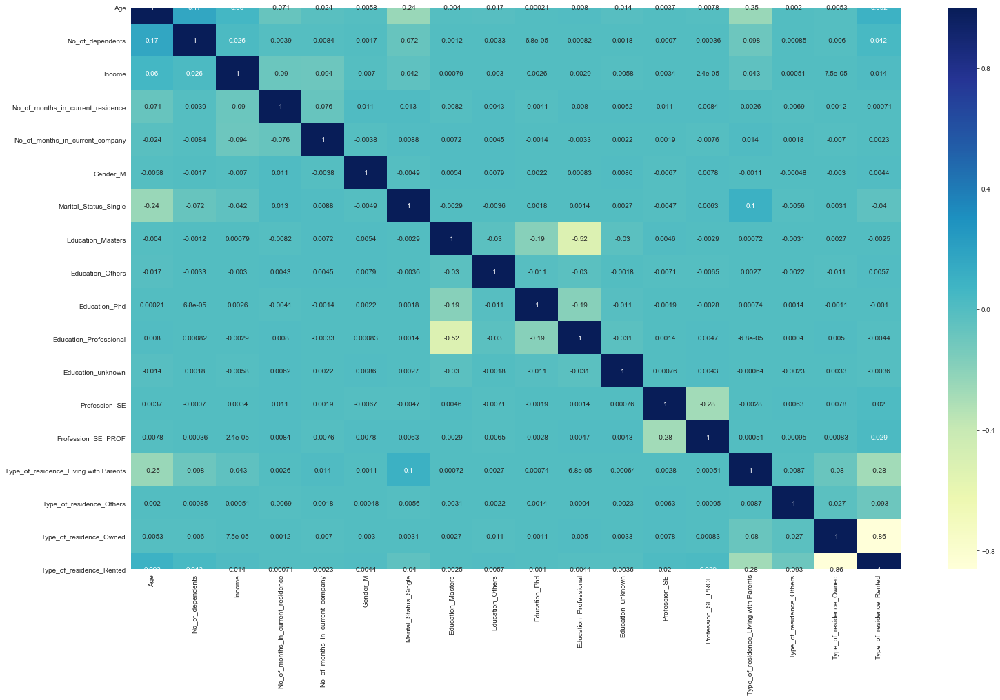

In [189]:
## In order to understand the correlation numerically for train set
## we need to prroduce the heat map to provide the directions going further
plt.figure(figsize = (25, 15))
sns.heatmap(X_train.corr(), annot = True,cmap="YlGnBu")
plt.show()

In [190]:
X_train.describe()

,Age,No_of_dependents,Income,No_of_months_in_current_residence,No_of_months_in_current_company,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_unknown,Profession_SE,Profession_SE_PROF,Type_of_residence_Living with Parents,Type_of_residence_Others,Type_of_residence_Owned,Type_of_residence_Rented
count,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000
mean,0.574423,0.464958,0.458020,0.238306,0.239712,0.764303,0.149736,0.336605,0.001718,0.064205,0.348587,0.001779,0.199710,0.232794,0.025355,0.002904,0.198871,0.749458
std,0.210678,0.346396,0.257687,0.306955,0.156313,0.424438,0.356816,0.472553,0.041409,0.245120,0.476528,0.042140,0.399786,0.422616,0.157202,0.053807,0.399155,0.433330
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.404255,0.250000,0.233333,0.000000,0.107692,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.574468,0.500000,0.450000,0.033333,0.238462,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.744681,0.750000,0.666667,0.458333,0.369231,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [191]:
import statsmodels.api as sm
def fit_LRM(X_train):
#Function to fit the logical regression model 
# Creating X_train dataframe with the selected variables
    # Adding a constant variable  
    X_train = sm.add_constant(X_train)
    logm = sm.GLM(y_train,X_train, family = sm.families.Binomial()).fit()
    print(logm.summary())
    return logm

In [192]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
def getVIF(X_train20):
    #X_train = df.drop(['const'], axis=1)
    # Calculate the VIFs for the new model
    vif = pd.DataFrame()
    X = X_train20
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return(vif)

In [193]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
## taking into account class imbalance
logreg = LogisticRegression(random_state=101,class_weight='balanced')

## running RFE with 15 variables as output
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 10)             
rfe = rfe.fit(X_train, y_train)

In [194]:
## list support variables
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('Age', True, 1),
 ('No_of_dependents', False, 4),
 ('Income', True, 1),
 ('No_of_months_in_current_residence', True, 1),
 ('No_of_months_in_current_company', True, 1),
 ('Gender_M', False, 5),
 ('Marital_Status_Single', True, 1),
 ('Education_Masters', False, 2),
 ('Education_Others', True, 1),
 ('Education_Phd', True, 1),
 ('Education_Professional', False, 3),
 ('Education_unknown', True, 1),
 ('Profession_SE', True, 1),
 ('Profession_SE_PROF', False, 8),
 ('Type_of_residence_Living with Parents', False, 6),
 ('Type_of_residence_Others', True, 1),
 ('Type_of_residence_Owned', False, 9),
 ('Type_of_residence_Rented', False, 7)]

In [195]:
## list of all the support variables
col = X_train.columns[rfe.support_]
col

Index(['Age', 'Income', 'No_of_months_in_current_residence',
       'No_of_months_in_current_company', 'Marital_Status_Single',
       'Education_Others', 'Education_Phd', 'Education_unknown',
       'Profession_SE', 'Type_of_residence_Others'],
      dtype='object')

In [196]:
X_train.columns[~rfe.support_]

Index(['No_of_dependents', 'Gender_M', 'Education_Masters',
       'Education_Professional', 'Profession_SE_PROF',
       'Type_of_residence_Living with Parents', 'Type_of_residence_Owned',
       'Type_of_residence_Rented'],
      dtype='object')

In [197]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [198]:
logm1 = fit_LRM(X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48895
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8494.5
Date:                Mon, 23 Dec 2019   Deviance:                       16989.
Time:                        12:10:55   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [199]:
getVIF(X_train_rfe)

,Features,VIF
0,Age,4.56
1,Income,3.36
3,No_of_months_in_current_company,2.73
2,No_of_months_in_current_residence,1.48
8,Profession_SE,1.23
4,Marital_Status_Single,1.15
6,Education_Phd,1.06
5,Education_Others,1.00
7,Education_unknown,1.00
9,Type_of_residence_Others,1.00


In [200]:
X_train1 = X_train_rfe.drop('Education_Phd', axis=1)

In [201]:
logm2 = fit_LRM(X_train1)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48896
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8494.6
Date:                Mon, 23 Dec 2019   Deviance:                       16989.
Time:                        12:10:55   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [202]:
getVIF(X_train1)

,Features,VIF
0,Age,4.54
1,Income,3.35
3,No_of_months_in_current_company,2.73
2,No_of_months_in_current_residence,1.48
7,Profession_SE,1.23
4,Marital_Status_Single,1.15
5,Education_Others,1.00
6,Education_unknown,1.00
8,Type_of_residence_Others,1.00


In [203]:
X_train2 = X_train1.drop('Age', axis=1)

In [204]:
logm3 = fit_LRM(X_train2)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48897
Model Family:                Binomial   Df Model:                            8
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8494.8
Date:                Mon, 23 Dec 2019   Deviance:                       16990.
Time:                        12:10:56   Pearson chi2:                 4.91e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [205]:
getVIF(X_train2)

,Features,VIF
0,Income,2.22
2,No_of_months_in_current_company,2.16
1,No_of_months_in_current_residence,1.41
6,Profession_SE,1.22
3,Marital_Status_Single,1.15
4,Education_Others,1.00
5,Education_unknown,1.00
7,Type_of_residence_Others,1.00


In [206]:

X_train3 = X_train2.drop('Education_Others', axis=1)

In [207]:
logm4 = fit_LRM(X_train3)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48898
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8495.1
Date:                Mon, 23 Dec 2019   Deviance:                       16990.
Time:                        12:10:56   Pearson chi2:                 4.91e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [208]:
getVIF(X_train3)

,Features,VIF
0,Income,2.21
2,No_of_months_in_current_company,2.16
1,No_of_months_in_current_residence,1.41
5,Profession_SE,1.22
3,Marital_Status_Single,1.15
4,Education_unknown,1.00
6,Type_of_residence_Others,1.00


In [209]:
X_train4 = X_train3.drop('Type_of_residence_Others', axis=1)
logm5 = fit_LRM(X_train4)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48899
Model Family:                Binomial   Df Model:                            6
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8495.5
Date:                Mon, 23 Dec 2019   Deviance:                       16991.
Time:                        12:10:56   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [210]:
getVIF(X_train4)

,Features,VIF
0,Income,2.21
2,No_of_months_in_current_company,2.16
1,No_of_months_in_current_residence,1.41
5,Profession_SE,1.22
3,Marital_Status_Single,1.15
4,Education_unknown,1.00


In [211]:
X_train5 = X_train4.drop('Education_unknown', axis=1)
logm6 = fit_LRM(X_train5)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48900
Model Family:                Binomial   Df Model:                            5
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8496.0
Date:                Mon, 23 Dec 2019   Deviance:                       16992.
Time:                        12:10:56   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [212]:
getVIF(X_train5)

,Features,VIF
0,Income,2.21
2,No_of_months_in_current_company,2.15
1,No_of_months_in_current_residence,1.41
4,Profession_SE,1.22
3,Marital_Status_Single,1.15


In [213]:
X_train6 = X_train5.drop('Marital_Status_Single', axis=1)
logm7 = fit_LRM(X_train6)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48901
Model Family:                Binomial   Df Model:                            4
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8496.4
Date:                Mon, 23 Dec 2019   Deviance:                       16993.
Time:                        12:10:56   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [214]:
getVIF(X_train6)

,Features,VIF
0,Income,2.19
2,No_of_months_in_current_company,2.12
1,No_of_months_in_current_residence,1.40
3,Profession_SE,1.22


In [215]:
## Now let us getting the prediction probability values from the model
logm7 = sm.GLM(y_train,X_train6, family = sm.families.Binomial()).fit()
y_train_pred = logm7.predict(X_train6)
y_train_pred[:10]

12070    0.018810
34673    0.030766
2052     0.005232
4726     0.016651
46964    0.181403
59465    0.005982
58879    0.047986
45215    0.044337
11770    0.009952
55493    0.094910
dtype: float64

In [216]:
## reshaping the values to get an array
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.01880972, 0.03076595, 0.00523243, 0.01665118, 0.18140257,
       0.00598204, 0.04798609, 0.04433711, 0.00995186, 0.09491033])

In [217]:
## putting the model provided probability values and the actual values in a dataframe along with row numbers
y_train_pred_final = pd.DataFrame({'unique_id':y_train.index+1,'Performance_Tag':y_train.values, 
                                   'Performance_Prob':y_train_pred})
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob
0,12071,0,0.018810
1,34674,0,0.030766
2,2053,0,0.005232
3,4727,0,0.016651
4,46965,0,0.181403


In [218]:
## this cut-off value will be tuned later

y_train_pred_final['predicted'] = y_train_pred_final.Performance_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted
0,12071,0,0.018810,0
1,34674,0,0.030766,0
2,2053,0,0.005232,0
3,4727,0,0.016651,0
4,46965,0,0.181403,0


In [219]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from imblearn.metrics import sensitivity_specificity_support
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

In [220]:
## need to prepare the Confusion matrix
confusion = confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final.predicted )
print(confusion)

[[46843     0]
 [ 2063     0]]


In [221]:
## Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Performance_Tag, y_train_pred_final.predicted))

0.9578170367644052


In [222]:
## function to draw the ROC curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(10, 10))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for model')
    plt.legend(loc="lower right")
    plt.show()

    return None

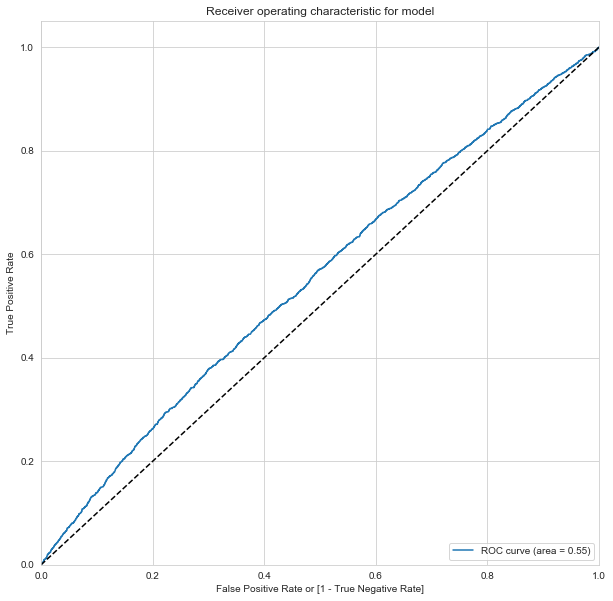

In [223]:
## using roc_cuve from the matrics
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Performance_Tag, y_train_pred_final.predicted, 
                                         drop_intermediate = False )
## draw ROC curve based on the probability values generated by the model
draw_roc(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob)

In [224]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Performance_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,12071,0,0.018810,0,1,0,0,0,0,0,0,0,0,0
1,34674,0,0.030766,0,1,0,0,0,0,0,0,0,0,0
2,2053,0,0.005232,0,1,0,0,0,0,0,0,0,0,0
3,4727,0,0.016651,0,1,0,0,0,0,0,0,0,0,0
4,46965,0,0.181403,0,1,1,0,0,0,0,0,0,0,0


In [225]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci','ppv','npv'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    ppv = cm1[1,1] /(cm1[1,1]+cm1[0,1])
    npv = cm1[0,0]/(cm1[0,0]+cm1[1,0])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci,ppv, npv ]
print(cutoff_df)

     prob  accuracy     sensi     speci       ppv       npv
0.0   0.0  0.042183  1.000000  0.000000  0.042183       NaN
0.1   0.1  0.788083  0.249152  0.811818  0.055097  0.960861
0.2   0.2  0.910420  0.076587  0.947143  0.059985  0.958830
0.3   0.3  0.945589  0.021813  0.986273  0.065407  0.958148
0.4   0.4  0.956161  0.002908  0.998143  0.064516  0.957860
0.5   0.5  0.957817  0.000000  1.000000       NaN  0.957817
0.6   0.6  0.957817  0.000000  1.000000       NaN  0.957817
0.7   0.7  0.957817  0.000000  1.000000       NaN  0.957817
0.8   0.8  0.957817  0.000000  1.000000       NaN  0.957817
0.9   0.9  0.957817  0.000000  1.000000       NaN  0.957817


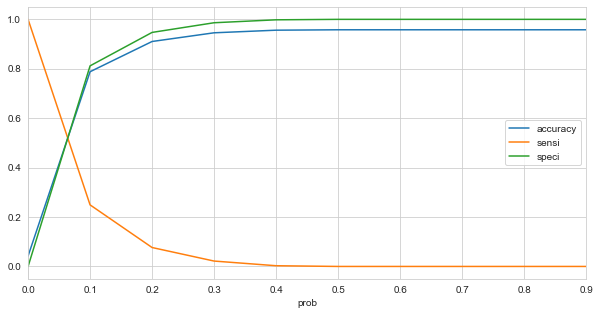

In [226]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'],figsize=(10, 5))
plt.show()

In [227]:
## making our final prediction on basis of optimal cut-off of 0.05
y_train_pred_final['final_predicted'] = y_train_pred_final.Performance_Prob.map( lambda x: 1 if x > 0.05 else 0)
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,12071,0,0.018810,0,1,0,0,0,0,0,0,0,0,0,0
1,34674,0,0.030766,0,1,0,0,0,0,0,0,0,0,0,0
2,2053,0,0.005232,0,1,0,0,0,0,0,0,0,0,0,0
3,4727,0,0.016651,0,1,0,0,0,0,0,0,0,0,0,0
4,46965,0,0.181403,0,1,1,0,0,0,0,0,0,0,0,1


In [228]:
## creating confusion matrix
confusion_matrix = metrics.confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted )
confusion_matrix

array([[28418, 18425],
       [ 1098,   965]])

In [229]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_train_pred_final.Performance_Tag, 
                                                  y_train_pred_final.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_train_pred_final.Performance_Tag, 
                                                              y_train_pred_final.final_predicted, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

print("AUC:    \t", round(roc_auc_score(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob),2))

Accuracy: 	 0.6
Sensitivity: 	0.47
Specificity: 	0.61
AUC:    	 0.55


In [230]:
from sklearn.metrics import precision_score, recall_score
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted ))

precision :  0.049767921609076844
recall :  0.46776539020843433


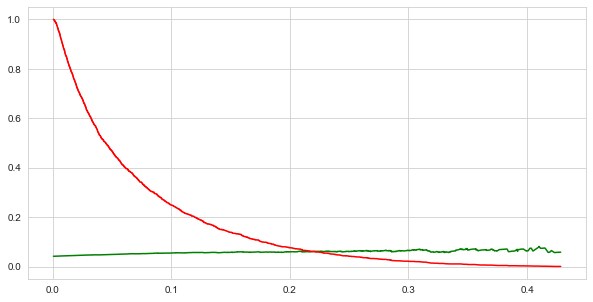

In [231]:
from sklearn.metrics import precision_recall_curve
## using precision_recall_curve from matrics
p, r, thresholds = precision_recall_curve(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob)

## creating plot from the precision recall curve
plt.figure(figsize=(10, 5))
plt.plot(thresholds, p[:-1], "g-", label ="precision")
plt.plot(thresholds, r[:-1], "r-", label ="recall")
plt.show()

#### Prediction on Test data

In [232]:
X_test[['Age','No_of_dependents','Income','No_of_months_in_current_residence','No_of_months_in_current_company']]=scaler.fit_transform(X_test[['Age','No_of_dependents','Income','No_of_months_in_current_residence','No_of_months_in_current_company']])

In [233]:
X_test.head()

,Age,No_of_dependents,Income,No_of_months_in_current_residence,No_of_months_in_current_company,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_unknown,Profession_SE,Profession_SE_PROF,Type_of_residence_Living with Parents,Type_of_residence_Others,Type_of_residence_Owned,Type_of_residence_Rented
51581,0.340426,0.25,0.100000,0.333333,0.104,1,0,0,0,0,1,0,0,0,0,0,1,0
49044,0.276596,0.00,0.116667,0.991667,0.000,1,1,0,0,0,1,0,0,0,0,0,0,1
31881,0.936170,0.50,0.366667,0.000000,0.080,1,0,1,0,0,0,0,0,1,0,0,0,1
3950,0.553191,0.75,0.833333,0.783333,0.208,1,1,0,0,1,0,0,1,0,0,0,0,1
5118,0.574468,0.50,0.450000,0.558333,0.464,0,0,0,0,0,0,0,0,0,0,0,0,1


In [234]:
# Now let's use our model to make predictions.
X_test_new = X_test[X_train6.columns]
X_test_new = sm.add_constant(X_test_new)
logm9 = sm.GLM(y_test,X_test_new, family = sm.families.Binomial()).fit()
# Making predictions
y_test_pred= logm9.predict(X_test_new)

In [235]:
y_test_pred[:10]

51581    0.060848
49044    0.069255
31881    0.048377
3950     0.035119
5118     0.035381
31776    0.042139
19441    0.042570
12297    0.043412
64607    0.035427
53606    0.028633
dtype: float64

In [236]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

y_test_df['unique_id'] = y_test_df.index+1

# Appending y_test_df and y_pred_1
y_pred_df = pd.concat([y_test_df, y_test_pred],axis=1)
y_pred_df.head()

,Performance_Tag,unique_id,0
51581,0,51582,0.060848
49044,0,49045,0.069255
31881,0,31882,0.048377
3950,0,3951,0.035119
5118,0,5119,0.035381


In [237]:
# Renaming the column 
y_pred_df= y_pred_df.rename(columns={ 0 : 'Performance_Prob'})
y_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob
51581,0,51582,0.060848
49044,0,49045,0.069255
31881,0,31882,0.048377
3950,0,3951,0.035119
5118,0,5119,0.035381


In [238]:
## evaluating result based on the cut-off value obtained above
y_pred_df['final_predicted'] = y_pred_df.Performance_Prob.map(lambda x: 1 if x > 0.05 else 0)
y_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob,final_predicted
51581,0,51582,0.060848,1
49044,0,49045,0.069255,1
31881,0,31882,0.048377,0
3950,0,3951,0.035119,0
5118,0,5119,0.035381,0


In [239]:
## creating confusion matrix for test data
confusion2 = metrics.confusion_matrix(y_pred_df.Performance_Tag, y_pred_df.final_predicted )
confusion2

array([[15691,  4386],
       [  628,   256]])

In [240]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_df.Performance_Tag, y_pred_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

print("AUC:    \t", round(roc_auc_score(y_pred_df.Performance_Tag, y_pred_df.Performance_Prob),2))

Accuracy: 	 0.76
Sensitivity: 	0.29
Specificity: 	0.78
AUC:    	 0.57


In [241]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ))

precision :  0.055148642826367944
recall :  0.2895927601809955


In [242]:
## making copy of the rejected applications data set
rejected_demographic = Demographic_PT_null

In [243]:
rejected_demographic.columns

Index(['Application_ID', 'Age', 'Gender', 'Marital_Status', 'No_of_dependents',
       'Income', 'Education', 'Profession', 'Type_of_residence',
       'No_of_months_in_current_residence', 'No_of_months_in_current_company',
       'Performance_Tag'],
      dtype='object')

In [244]:
## replacing the all the entries 'F' with 1 and enteries 'M': 0
rejected_demographic['Gender'] = rejected_demographic['Gender'].map({'F': 1, 'M': 0})
## replacing the all the entries 'Married' with 1 and enteries 'Single' with 0
rejected_demographic['Marital_Status'] = rejected_demographic['Marital_Status'].map({'Married': 1, 'Single': 0})
# Creating a dummy variable for the variable 'Education' and dropping the first one.
Education = pd.get_dummies(rejected_demographic['Education'],prefix='Education',drop_first=True)
#Adding the results to the master dataframe
rejected_demographic = pd.concat([rejected_demographic,Education],axis=1)
# Droping the column Education
rejected_demographic.drop(columns = 'Education', inplace = True)
# Creating a dummy variable for the variable 'Profession' and dropping the first one.
Profession = pd.get_dummies(rejected_demographic['Profession'],prefix='Profession',drop_first=True)
#Adding the results to the master dataframe
rejected_demographic = pd.concat([rejected_demographic,Profession],axis=1)
# Droping the column Profession
rejected_demographic.drop(columns = 'Profession', inplace = True)
# Creating a dummy variable for the variable 'Residence_Type' and dropping the first one.
Residence_Type = pd.get_dummies(rejected_demographic['Type_of_residence'],prefix='Type_of_residence',drop_first=True)
#Adding the results to the master dataframe
rejected_demographic = pd.concat([rejected_demographic,Residence_Type],axis=1)
# Droping the column Profession 
rejected_demographic.drop(columns = 'Type_of_residence', inplace = True)

In [246]:

X_rejected = rejected_demographic.drop(['Performance_Tag','Application_ID'],axis=1)

# Putting response variable to y
y_rejected = Demographic_model_df['Performance_Tag']

In [247]:
X_rejected[['Age','No_of_dependents','Income','No_of_months_in_current_residence','No_of_months_in_current_company']]=scaler.fit_transform(X_rejected[['Age','No_of_dependents','Income','No_of_months_in_current_residence','No_of_months_in_current_company']])

In [248]:
X_rejected.head()

,Age,Gender,Marital_Status,No_of_dependents,Income,No_of_months_in_current_residence,No_of_months_in_current_company,Education_Masters,Education_Others,Education_Phd,Education_Professional,Profession_SE,Profession_SE_PROF,Type_of_residence_Living with Parents,Type_of_residence_Others,Type_of_residence_Owned,Type_of_residence_Rented
69603,0.302326,0,0,0.00,0.027027,0.133333,0.208333,0,0,0,0,0,0,0,0,0,1
69604,0.581395,1,1,0.75,0.135135,0.966667,0.305556,1,0,0,0,1,0,0,0,0,1
69605,0.558140,0,1,0.50,0.045045,0.033333,0.388889,0,0,0,1,1,0,0,0,0,1
69606,0.441860,0,1,0.50,0.243243,0.000000,0.611111,1,0,0,0,0,0,0,0,0,1
69607,0.465116,1,1,0.75,0.225225,0.016667,0.638889,0,0,1,0,0,0,0,0,0,1


In [250]:
# Now let's use our model to make predictions.
X_rejected_new = X_rejected[X_train6.columns]
X_rejected_new = sm.add_constant(X_rejected_new)

# Making predictions
y_rejected_pred= logm9.predict(X_rejected_new)

In [252]:
## checking values
y_rejected_pred[:10]

69603    0.058420
69604    0.058548
69605    0.053920
69606    0.035351
69607    0.035163
69608    0.030645
69609    0.058330
69610    0.030915
69611    0.072235
69612    0.052109
dtype: float64

In [253]:
# Converting y_test to dataframe
y_rejected = pd.DataFrame(pd.Series(np.ones(X_rejected.shape[0], dtype = np.int)))
y_rejected = y_rejected.rename(columns={ 0 : 'Performance_Tag'})

y_rejected['unique_id'] = y_rejected.index+1

# Appending y_additional_df and y_pred_1
y_rejected_pred_df = pd.concat([y_rejected, pd.DataFrame(y_rejected_pred).reset_index()],axis=1)
y_rejected_pred_df = y_rejected_pred_df.drop('index',1)
y_rejected_pred_df.head()

,Performance_Tag,unique_id,0
0,1,1,0.058420
1,1,2,0.058548
2,1,3,0.053920
3,1,4,0.035351
4,1,5,0.035163


In [254]:
# Renaming the column 
y_rejected_pred_df= y_rejected_pred_df.rename(columns={ 0 : 'Performance_Prob'})
y_rejected_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob
0,1,1,0.058420
1,1,2,0.058548
2,1,3,0.053920
3,1,4,0.035351
4,1,5,0.035163


In [255]:
## evaluating result based on the cut-off value obtained above
y_rejected_pred_df['final_predicted'] = y_rejected_pred_df.Performance_Prob.map(lambda x: 1 if x > 0.05 else 0)
y_rejected_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob,final_predicted
0,1,1,0.058420,1
1,1,2,0.058548,1
2,1,3,0.053920,1
3,1,4,0.035351,0
4,1,5,0.035163,0


In [256]:
## creating confusion matrix for rejected data
confusion3 = metrics.confusion_matrix(y_rejected_pred_df.Performance_Tag, y_rejected_pred_df.final_predicted )
confusion3

array([[  0,   0],
       [660, 765]])

In [257]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_rejected_pred_df.Performance_Tag, y_rejected_pred_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_rejected_pred_df.Performance_Tag, 
                                                              y_rejected_pred_df.final_predicted, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy: 	 0.54
Sensitivity: 	0.54
Specificity: 	0.0


In [258]:
## using precision_score to evaluate matrics
print("precision : ", metrics.precision_score(y_rejected_pred_df.Performance_Tag, y_rejected_pred_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", metrics.recall_score(y_rejected_pred_df.Performance_Tag, y_rejected_pred_df.final_predicted ))

precision :  1.0
recall :  0.5368421052631579


In [259]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(class_weight='balanced',max_depth=5)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [260]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred= dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.55      0.70     20077
           1       0.05      0.58      0.10       884

    accuracy                           0.55     20961
   macro avg       0.51      0.56      0.40     20961
weighted avg       0.93      0.55      0.67     20961



In [261]:
print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[10957  9120]
 [  371   513]]
accuracy 0.547206717236773
precision 0.05325443786982249
recall 0.580316742081448


In [265]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus 
import graphviz

# Putting features
features = list(X_train.columns)
features

['Age',
 'No_of_dependents',
 'Income',
 'No_of_months_in_current_residence',
 'No_of_months_in_current_company',
 'Gender_M',
 'Marital_Status_Single',
 'Education_Masters',
 'Education_Others',
 'Education_Phd',
 'Education_Professional',
 'Education_unknown',
 'Profession_SE',
 'Profession_SE_PROF',
 'Type_of_residence_Living with Parents',
 'Type_of_residence_Others',
 'Type_of_residence_Owned',
 'Type_of_residence_Rented']

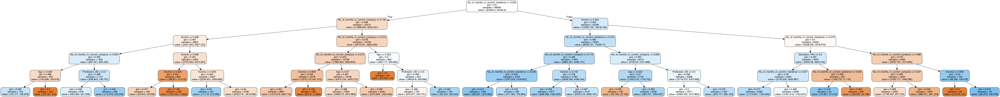

In [266]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,feature_names = list(X_train.columns) , filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [267]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# parameters to build the model on
parameters = {'max_depth': range(1, 40)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 101)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 39 candidates, totalling 195 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 195 out of 195 | elapsed:   46.0s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=101,
                                              splitter='best'),
             iid='warn', n_jobs=None, param_grid={'max_depth': range(1, 40)},
             pre_dispatch='2*n_j

In [268]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.034159,0.003340,0.009313,0.004405,1,{'max_depth': 1},0.690355,0.631336,0.643032,0.625616,...,0.651402,0.024034,1,0.641702,0.656231,0.652963,0.657212,0.646987,0.651019,0.005871
1,0.041281,0.002672,0.007118,0.000886,2,{'max_depth': 2},0.690355,0.389401,0.447433,0.465517,...,0.497593,0.102388,9,0.641702,0.432167,0.483071,0.478576,0.471089,0.501321,0.072461
2,0.070285,0.003684,0.010733,0.001387,3,{'max_depth': 3},0.606599,0.582949,0.601467,0.578818,...,0.606348,0.029718,3,0.596165,0.627379,0.617896,0.598672,0.672550,0.622533,0.027609
3,0.069452,0.011938,0.009878,0.001831,4,{'max_depth': 4},0.596447,0.463134,0.572127,0.625616,...,0.584322,0.067943,4,0.623727,0.535298,0.589480,0.671696,0.687766,0.621593,0.055447
4,0.076433,0.005517,0.008149,0.001085,5,{'max_depth': 5},0.654822,0.605991,0.628362,0.573892,...,0.618805,0.027268,2,0.665668,0.652548,0.698307,0.665661,0.678637,0.672164,0.015457


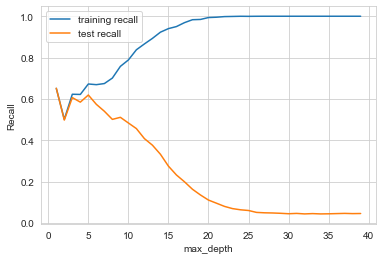

In [269]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [270]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   10.7s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sco

In [271]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.267402,0.035804,0.010873,0.001010,5,{'min_samples_leaf': 5},0.164649,0.140436,0.133172,0.133495,...,0.142992,0.011509,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.227066,0.069980,0.009912,0.001429,25,{'min_samples_leaf': 25},0.360775,0.314770,0.341404,0.339806,...,0.340283,0.014775,9,0.895152,0.896970,0.896970,0.890369,0.895215,0.894935,0.002419
2,0.216502,0.025720,0.014119,0.007618,45,{'min_samples_leaf': 45},0.445521,0.392252,0.418886,0.422330,...,0.417837,0.017325,8,0.854545,0.866061,0.858182,0.861902,0.864325,0.861003,0.004173
3,0.168058,0.008950,0.009215,0.001270,65,{'min_samples_leaf': 65},0.489104,0.450363,0.476998,0.451456,...,0.463877,0.016123,6,0.826667,0.849697,0.840606,0.829194,0.820109,0.833255,0.010555
4,0.159600,0.006341,0.008241,0.000098,85,{'min_samples_leaf': 85},0.476998,0.438257,0.462470,0.463592,...,0.468262,0.020195,5,0.792121,0.813333,0.794545,0.810418,0.793459,0.800775,0.009142


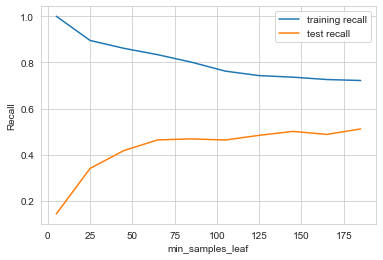

In [272]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [273]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   15.5s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_split': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sc

In [274]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.234118,0.038767,0.009915,0.001122,5,{'min_samples_split': 5},0.075061,0.053269,0.082324,0.046117,...,0.063005,0.013573,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.250777,0.014274,0.010973,0.001042,25,{'min_samples_split': 25},0.208232,0.193705,0.222760,0.179612,...,0.206493,0.018016,9,0.999394,0.995758,0.998182,0.997577,0.998183,0.997819,0.001188
2,0.216619,0.023904,0.012991,0.005711,45,{'min_samples_split': 45},0.295400,0.259080,0.285714,0.300971,...,0.290853,0.018189,8,0.967879,0.970909,0.978788,0.976378,0.974561,0.973703,0.003885
3,0.198845,0.023347,0.009390,0.001096,65,{'min_samples_split': 65},0.329298,0.300242,0.309927,0.347087,...,0.334007,0.029537,7,0.940606,0.934545,0.943030,0.941853,0.952150,0.942437,0.005669
4,0.212573,0.017015,0.010667,0.001354,85,{'min_samples_split': 85},0.372881,0.348668,0.351090,0.378641,...,0.367925,0.015561,6,0.927879,0.927879,0.919394,0.918837,0.927317,0.924261,0.004210


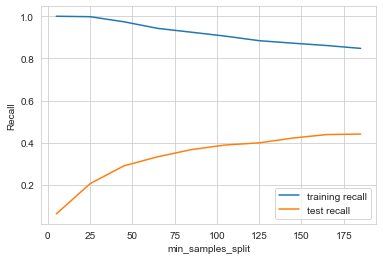

In [275]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [276]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 2),
    'min_samples_leaf': range(50, 250, 50),
    'min_samples_split': range(50, 250, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(class_weight='balanced')
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          scoring="recall", cv = n_folds,
                          return_train_score=True, verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 800 out of 800 | elapsed:  1.7min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 2),
                

In [277]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.072698,0.008402,0.006871,0.000543,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.578692,...,0.629698,0.037566,2,0.653333,0.686667,0.667879,0.694730,0.696548,0.679831,0.016692
1,0.067583,0.003043,0.006807,0.000422,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.578692,...,0.629698,0.037566,2,0.653333,0.686667,0.667879,0.694730,0.696548,0.679831,0.016692
2,0.061884,0.000961,0.006193,0.000069,entropy,5,50,150,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.578692,...,0.630182,0.037576,1,0.653333,0.687879,0.667879,0.694730,0.696548,0.680074,0.016798
3,0.062473,0.003793,0.006146,0.000216,entropy,5,50,200,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.578692,...,0.628244,0.038404,5,0.653939,0.687879,0.664242,0.694730,0.693519,0.678862,0.016630
4,0.058927,0.002240,0.006039,0.000161,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.583535,...,0.626292,0.035715,9,0.656970,0.694545,0.660000,0.688068,0.678982,0.675713,0.014941


In [278]:
# printing the optimal accuracy score and hyperparameters
print("best recall", grid_search.best_score_)
print(grid_search.best_estimator_)

best recall 0.630182291064998
DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=150,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')


In [279]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(class_weight='balanced',
                                  criterion='gini', 
                                  random_state = 100,
                                  max_depth=5, 
                                  min_samples_leaf=100,
                                  min_samples_split=50)
clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=100, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=100, splitter='best')

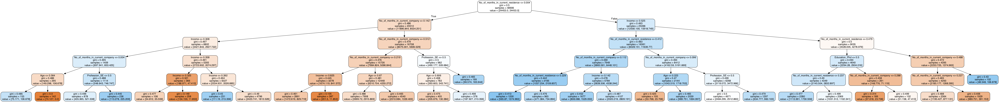

In [280]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,feature_names=list(X_train.columns),filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [281]:
## checking accuracy score
clf_gini.score(X_test,y_test)

0.5340871141644006

In [282]:
## making predictions
y_pred = clf_gini.predict(X_test)


print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[10678  9399]
 [  367   517]]
accuracy 0.5340871141644006
precision 0.05213795885437676
recall 0.584841628959276


In [283]:
from sklearn.ensemble import RandomForestClassifier

## creating Random Forest ensamble and fitting training data 
rfc = RandomForestClassifier(class_weight='balanced')
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [284]:
# Making predictions
predictions = rfc.predict(X_test)

In [285]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98     20077
           1       0.00      0.00      0.00       884

    accuracy                           0.96     20961
   macro avg       0.48      0.50      0.49     20961
weighted avg       0.92      0.96      0.94     20961



In [286]:
from sklearn import metrics
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[20072     5]
 [  884     0]]
accuracy 0.9575879013405849
precision 0.0
recall 0.0


In [287]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 4)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    7.6s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [288]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.104895,0.005922,0.011067,0.000446,2,{'max_depth': 2},0.457627,0.559322,0.518160,0.567961,...,0.530320,0.040056,1,0.487879,0.553939,0.572727,0.580860,0.541490,0.547379,0.032807
1,0.161463,0.016972,0.013850,0.002942,6,{'max_depth': 6},0.469734,0.481840,0.489104,0.516990,...,0.497357,0.022211,2,0.582424,0.586061,0.615152,0.585100,0.592974,0.592342,0.011924
2,0.255190,0.012251,0.017339,0.002090,10,{'max_depth': 10},0.256659,0.222760,0.256659,0.296117,...,0.252554,0.025697,3,0.638788,0.646667,0.621818,0.648698,0.615990,0.634392,0.013201
3,0.316906,0.029766,0.022405,0.003415,14,{'max_depth': 14},0.043584,0.041162,0.079903,0.055825,...,0.052348,0.014807,4,0.735152,0.758788,0.703636,0.718958,0.725015,0.728310,0.018346
4,0.290577,0.027082,0.020864,0.001982,18,{'max_depth': 18},0.004843,0.000000,0.004843,0.021845,...,0.008247,0.007459,5,0.787273,0.792121,0.783030,0.763174,0.771654,0.779450,0.010586


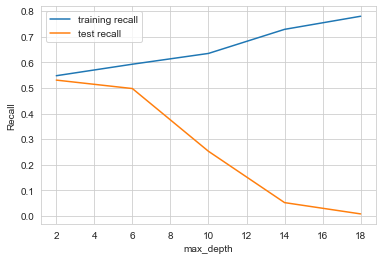

In [289]:
## visualizing results
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [292]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(class_weight='balanced',max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                    return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed: 125.0min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [293]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.394261,0.029491,0.073922,0.004954,100,{'n_estimators': 100},0.506053,0.496368,0.503632,0.509709,...,0.507035,0.007574,1,0.596970,0.595758,0.619394,0.583889,0.589340,0.597070,0.012113
1,7.093383,0.245533,0.365200,0.029414,500,{'n_estimators': 500},0.489104,0.496368,0.496368,0.495146,...,0.501222,0.014209,4,0.587273,0.589091,0.603030,0.558449,0.586917,0.584952,0.014530
2,13.541224,0.243054,0.628794,0.026376,900,{'n_estimators': 900},0.496368,0.491525,0.496368,0.509709,...,0.502677,0.010331,3,0.595758,0.580000,0.607273,0.563901,0.585706,0.586527,0.014634
3,19.042981,1.532179,1.095343,0.238025,1300,{'n_estimators': 1300},0.501211,0.498789,0.503632,0.507282,...,0.505095,0.005503,2,0.593939,0.583030,0.604848,0.563295,0.588734,0.586769,0.013763


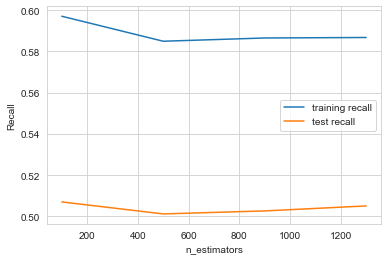

In [294]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("n_estimators")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [295]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [4, 8, 12, 16]}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced', max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    7.0s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [296]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.192662,0.016674,0.015486,0.002432,4,{'max_features': 4},0.455206,0.474576,0.455206,0.536408,...,0.492042,0.037885,1,0.576364,0.572121,0.567879,0.571169,0.612962,0.580099,0.016653
1,0.248750,0.027635,0.013539,0.002435,8,{'max_features': 8},0.476998,0.489104,0.462470,0.541262,...,0.492023,0.026589,2,0.589091,0.583636,0.604848,0.602665,0.622653,0.600579,0.013630
2,0.313061,0.030323,0.013275,0.000932,12,{'max_features': 12},0.447942,0.501211,0.486683,0.490291,...,0.487651,0.021763,4,0.572121,0.593939,0.604848,0.614173,0.606905,0.598397,0.014650
3,0.409987,0.049219,0.013521,0.001422,16,{'max_features': 16},0.464891,0.489104,0.472155,0.512136,...,0.490568,0.020206,3,0.606061,0.583030,0.601818,0.606905,0.594791,0.598521,0.008853


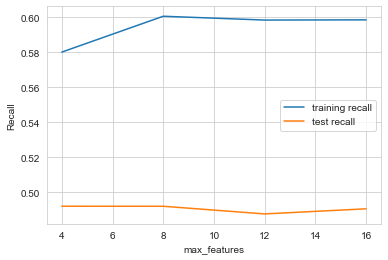

In [297]:
# plotting recall with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_features")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [298]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    8.9s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [299]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.233801,0.018952,0.016824,0.001851,100,{'min_samples_leaf': 100},0.372881,0.387409,0.392252,0.395631,...,0.384392,0.009404,6,0.582424,0.594545,0.621212,0.593580,0.585706,0.595493,0.013657
1,0.231926,0.022706,0.018449,0.000630,150,{'min_samples_leaf': 150},0.404358,0.416465,0.440678,0.473301,...,0.433852,0.023560,5,0.573333,0.587273,0.600000,0.585100,0.566323,0.582406,0.011674
2,0.223541,0.006924,0.017154,0.000336,200,{'min_samples_leaf': 200},0.476998,0.467312,0.484262,0.449029,...,0.476491,0.018457,4,0.595758,0.578182,0.604242,0.559661,0.586917,0.584952,0.015351
3,0.222625,0.008508,0.017680,0.001417,250,{'min_samples_leaf': 250},0.484262,0.486683,0.491525,0.504854,...,0.489096,0.008979,3,0.595758,0.575758,0.581212,0.566929,0.583889,0.580709,0.009500
4,0.211267,0.006029,0.016847,0.000715,300,{'min_samples_leaf': 300},0.481840,0.508475,0.503632,0.502427,...,0.506070,0.016680,2,0.577576,0.580606,0.591515,0.562689,0.589340,0.580345,0.010248


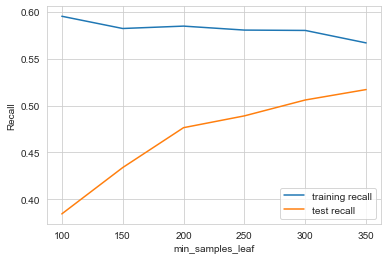

In [300]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [301]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:   10.2s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [302]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.303295,0.042926,0.020073,0.000267,200,{'min_samples_split': 200},0.261501,0.278450,0.268765,0.281553,...,0.270966,0.007791,6,0.622424,0.606061,0.626061,0.631738,0.605088,0.618274,0.010791
1,0.254596,0.023691,0.017861,0.001679,250,{'min_samples_split': 250},0.302663,0.276029,0.319613,0.308252,...,0.305874,0.016628,5,0.609091,0.634545,0.590303,0.628710,0.599637,0.612457,0.016844
2,0.260799,0.006091,0.019019,0.001457,300,{'min_samples_split': 300},0.314770,0.353511,0.360775,0.303398,...,0.338336,0.024273,4,0.620000,0.609697,0.618788,0.628710,0.611750,0.617789,0.006739
3,0.259786,0.009810,0.018489,0.001506,350,{'min_samples_split': 350},0.355932,0.394673,0.409201,0.422330,...,0.390213,0.024657,3,0.618182,0.620000,0.634545,0.609933,0.580254,0.612583,0.018005
4,0.233646,0.012540,0.016560,0.001650,400,{'min_samples_split': 400},0.394673,0.392252,0.401937,0.407767,...,0.398452,0.005650,1,0.611515,0.581212,0.614545,0.585100,0.576015,0.593677,0.016091


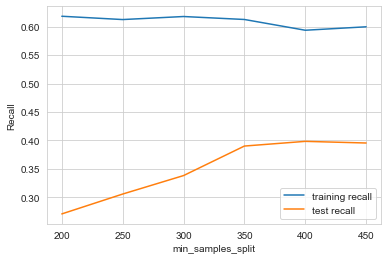

In [303]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [304]:
# specify number of folds for k-fold CV
n_folds = 3

param_grid = {
    'max_depth': [4,6,8],
    'min_samples_leaf': [300, 350], ##[250,300, 350]
    'min_samples_split': [400, 450], ##[350,400, 450]
    'n_estimators': [900,1000], ##[800,900,1000]
    'max_features': [10,14,18]
}
# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(estimator = rf, param_grid = param_grid, 
                    cv=n_folds, n_jobs = -1,verbose = 1,
                   scoring="recall",
                 return_train_score=True)
rf.fit(X_train, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 38.5min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 45.1min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [305]:
# printing the optimal recall score and hyperparameters
print('We can get recall of',rf.best_score_,'using',rf.best_params_)

We can get recall of 0.5632588749689937 using {'max_depth': 4, 'max_features': 18, 'min_samples_leaf': 350, 'min_samples_split': 400, 'n_estimators': 900}


In [306]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=4,
                             min_samples_leaf=300, 
                             min_samples_split=400,
                             max_features=10,
                             n_estimators=900,class_weight='balanced')

In [307]:
# fit
rfc.fit(X_train,y_train)

# predict
predictions = rfc.predict(X_test)

print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.97      0.59      0.74     20077
           1       0.06      0.56      0.10       884

    accuracy                           0.59     20961
   macro avg       0.51      0.58      0.42     20961
weighted avg       0.93      0.59      0.71     20961



In [308]:
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[11926  8151]
 [  387   497]]
accuracy 0.5926721053384858
precision 0.057469935245143385
recall 0.5622171945701357


In [309]:
### Models Building for Demographic WoE Transformed Data

In [349]:
woe_demographic_data.head()

,Application_ID,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag
0,954457215.0,0.039004,0.032174,-0.003987,-0.085222,-0.205213,0.017314,-0.028067,-0.004294,-0.063215,-0.294512,0.0
1,432830445.0,0.005478,-0.010108,-0.003987,-0.025204,-0.330574,-0.017931,-0.013298,-0.004294,-0.063215,-0.150676,0.0
2,941387308.0,0.005478,-0.010108,0.023327,-0.085222,-0.178761,0.017314,-0.013298,-0.004294,-0.063215,-0.150676,0.0
3,392161677.0,-0.040004,-0.010108,-0.003987,0.040085,-0.330574,0.017314,0.091424,-0.004294,-0.063215,-0.294512,0.0
4,182011211.0,0.001656,0.032174,-0.003987,0.004391,-0.178761,-0.017931,-0.028067,-0.004294,-0.063215,-0.150676,0.0


In [350]:
woe_demographic_data.shape

(71292, 12)

In [351]:
## checking the percentage of Performance tag across the data
Performance_rate = (sum(woe_demographic_data['Performance_Tag'])/len(woe_demographic_data['Performance_Tag'].index))*100
Performance_rate

4.133703641362285

In [361]:
## taking all variables to X ignoring Performance_Tag and App_Id 
 
X = woe_demographic_data.drop(['Performance_Tag','Application_ID'],axis=1)

X.head()

,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company
0,0.039004,0.032174,-0.003987,-0.085222,-0.205213,0.017314,-0.028067,-0.004294,-0.063215,-0.294512
1,0.005478,-0.010108,-0.003987,-0.025204,-0.330574,-0.017931,-0.013298,-0.004294,-0.063215,-0.150676
2,0.005478,-0.010108,0.023327,-0.085222,-0.178761,0.017314,-0.013298,-0.004294,-0.063215,-0.150676
3,-0.040004,-0.010108,-0.003987,0.040085,-0.330574,0.017314,0.091424,-0.004294,-0.063215,-0.294512
4,0.001656,0.032174,-0.003987,0.004391,-0.178761,-0.017931,-0.028067,-0.004294,-0.063215,-0.150676


In [362]:
## taking Converted as Y variable
y = woe_demographic_data['Performance_Tag']

y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Performance_Tag, dtype: float64

In [363]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

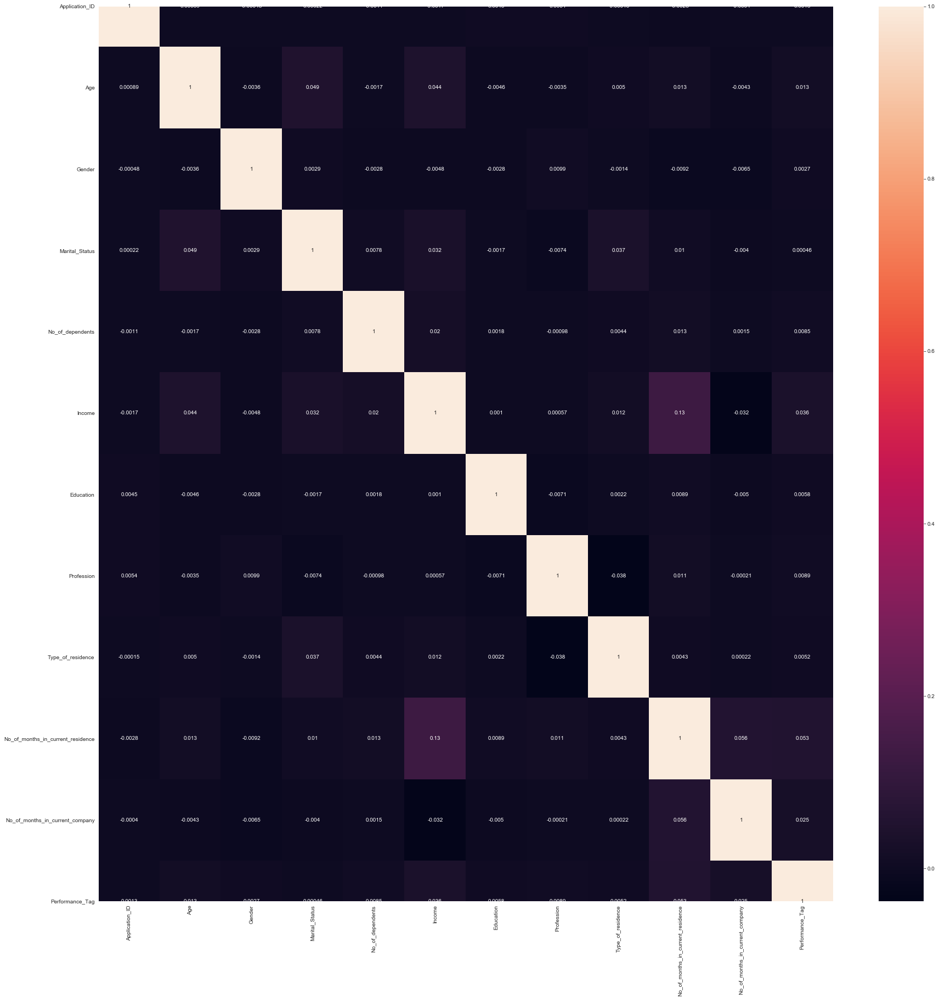

In [364]:
plt.figure(figsize = (30,30))        # Size of the figure
sns.heatmap(woe_demographic_data.corr(),annot = True)
plt.show()

In [365]:
# all columns
colw =  X_train.columns
colw

Index(['Age', 'Gender', 'Marital_Status', 'No_of_dependents', 'Income',
       'Education', 'Profession', 'Type_of_residence',
       'No_of_months_in_current_residence', 'No_of_months_in_current_company'],
      dtype='object')

In [366]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[colw]

In [367]:
logmw1 = fit_LRM(X_trainw_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                49904
Model:                            GLM   Df Residuals:                    49893
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8376.7
Date:                Mon, 23 Dec 2019   Deviance:                       16753.
Time:                        16:26:34   Pearson chi2:                 4.98e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [368]:
getVIF(X_trainw_rfe)

,Features,VIF
4,Income,1.02
8,No_of_months_in_current_residence,1.02
9,No_of_months_in_current_company,1.01
0,Age,1.00
1,Gender,1.00
2,Marital_Status,1.00
3,No_of_dependents,1.00
5,Education,1.00
6,Profession,1.00
7,Type_of_residence,1.00


In [369]:
X_trainw1 = X_trainw_rfe.drop('Marital_Status', axis=1)

In [370]:
logmw2 = fit_LRM(X_trainw1)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                49904
Model:                            GLM   Df Residuals:                    49894
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8376.8
Date:                Mon, 23 Dec 2019   Deviance:                       16754.
Time:                        16:28:22   Pearson chi2:                 4.98e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [371]:
getVIF(X_trainw1)

,Features,VIF
3,Income,1.02
7,No_of_months_in_current_residence,1.02
8,No_of_months_in_current_company,1.01
0,Age,1.00
1,Gender,1.00
2,No_of_dependents,1.00
4,Education,1.00
5,Profession,1.00
6,Type_of_residence,1.00


In [372]:
X_trainw2 = X_trainw1.drop('Education', axis=1)

In [373]:
logmw3 = fit_LRM(X_trainw2)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                49904
Model:                            GLM   Df Residuals:                    49895
Model Family:                Binomial   Df Model:                            8
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8377.1
Date:                Mon, 23 Dec 2019   Deviance:                       16754.
Time:                        16:29:53   Pearson chi2:                 4.98e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [374]:
getVIF(X_trainw2)

,Features,VIF
3,Income,1.02
6,No_of_months_in_current_residence,1.02
7,No_of_months_in_current_company,1.01
0,Age,1.00
1,Gender,1.00
2,No_of_dependents,1.00
4,Profession,1.00
5,Type_of_residence,1.00


In [375]:
X_trainw3 = X_trainw2.drop('Type_of_residence', axis=1)
logmw4 = fit_LRM(X_trainw3)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                49904
Model:                            GLM   Df Residuals:                    49896
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8377.8
Date:                Mon, 23 Dec 2019   Deviance:                       16756.
Time:                        16:31:46   Pearson chi2:                 4.98e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [376]:
getVIF(X_trainw3)

,Features,VIF
3,Income,1.02
5,No_of_months_in_current_residence,1.02
6,No_of_months_in_current_company,1.01
0,Age,1.00
1,Gender,1.00
2,No_of_dependents,1.00
4,Profession,1.00


In [378]:
X_trainw4 = X_trainw3.drop('Profession', axis=1)
logmw5 = fit_LRM(X_trainw4)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                49904
Model:                            GLM   Df Residuals:                    49897
Model Family:                Binomial   Df Model:                            6
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8378.7
Date:                Mon, 23 Dec 2019   Deviance:                       16757.
Time:                        16:32:56   Pearson chi2:                 4.98e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [380]:
getVIF(X_trainw4)

,Features,VIF
3,Income,1.02
4,No_of_months_in_current_residence,1.02
5,No_of_months_in_current_company,1.01
0,Age,1.00
1,Gender,1.00
2,No_of_dependents,1.00


In [379]:
X_trainw5 = X_trainw4.drop('No_of_dependents', axis=1)
logmw6 = fit_LRM(X_trainw5)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                49904
Model:                            GLM   Df Residuals:                    49898
Model Family:                Binomial   Df Model:                            5
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8380.3
Date:                Mon, 23 Dec 2019   Deviance:                       16761.
Time:                        16:35:17   Pearson chi2:                 4.98e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [381]:
getVIF(X_trainw5)

,Features,VIF
2,Income,1.02
3,No_of_months_in_current_residence,1.02
4,No_of_months_in_current_company,1.01
0,Age,1.00
1,Gender,1.00


In [382]:
X_trainw6 = X_trainw5.drop('Gender', axis=1)
logmw7 = fit_LRM(X_trainw6)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                49904
Model:                            GLM   Df Residuals:                    49899
Model Family:                Binomial   Df Model:                            4
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8381.7
Date:                Mon, 23 Dec 2019   Deviance:                       16763.
Time:                        16:36:55   Pearson chi2:                 4.99e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [384]:
getVIF(X_trainw6)

,Features,VIF
1,Income,1.02
2,No_of_months_in_current_residence,1.02
3,No_of_months_in_current_company,1.01
0,Age,1.00


In [386]:
## Now let us getting the prediction probability values from the model
logm7 = sm.GLM(y_train,X_trainw6, family = sm.families.Binomial()).fit()
y_train_pred = logm7.predict(X_trainw6)
y_train_pred[:10]

7706     0.451471
70817    0.664826
47164    0.440958
69334    0.613582
40508    0.519569
18281    0.440229
30072    0.448554
44488    0.575532
28076    0.501025
56091    0.529390
dtype: float64

In [387]:
## reshaping the values to get an array
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.45147131, 0.6648256 , 0.44095758, 0.61358162, 0.51956883,
       0.44022946, 0.44855361, 0.57553244, 0.50102536, 0.52938983])

In [388]:
## putting the model provided probability values and the actual values in a dataframe along with row numbers
y_train_pred_final = pd.DataFrame({'unique_id':y_train.index+1,'Performance_Tag':y_train.values, 
                                   'Performance_Prob':y_train_pred})
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob
0,7707,0.0,0.451471
1,70818,0.0,0.664826
2,47165,0.0,0.440958
3,69335,0.0,0.613582
4,40509,0.0,0.519569


In [389]:
## this cut-off value will be tuned later

y_train_pred_final['predicted'] = y_train_pred_final.Performance_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted
0,7707,0.0,0.451471,0
1,70818,0.0,0.664826,1
2,47165,0.0,0.440958,0
3,69335,0.0,0.613582,1
4,40509,0.0,0.519569,1


In [390]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from imblearn.metrics import sensitivity_specificity_support
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

In [391]:
## need to prepare the Confusion matrix
confusion = confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final.predicted )
print(confusion)

[[29124 18749]
 [  941  1090]]


In [392]:
## Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Performance_Tag, y_train_pred_final.predicted))

0.6054424495030458


In [393]:
## function to draw the ROC curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(10, 10))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for model')
    plt.legend(loc="lower right")
    plt.show()

    return None

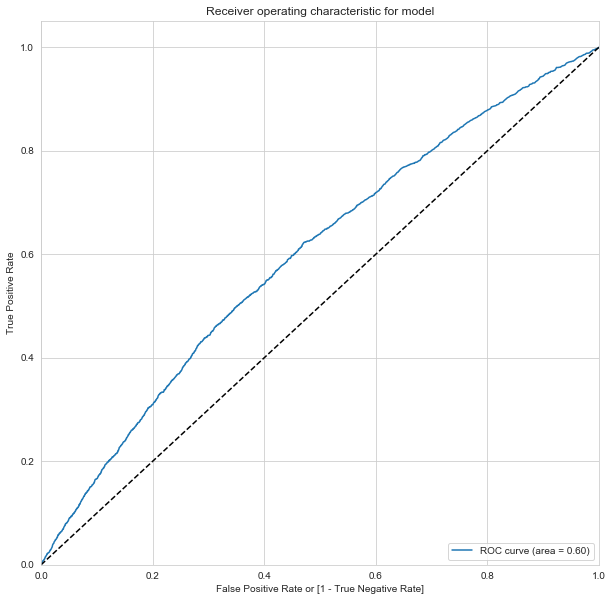

In [394]:
## using roc_cuve from the matrics
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Performance_Tag, y_train_pred_final.predicted, 
                                         drop_intermediate = False )
## draw ROC curve based on the probability values generated by the model
draw_roc(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob)

In [395]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Performance_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,7707,0.0,0.451471,0,1,1,1,1,1,0,0,0,0,0
1,70818,0.0,0.664826,1,1,1,1,1,1,1,1,0,0,0
2,47165,0.0,0.440958,0,1,1,1,1,1,0,0,0,0,0
3,69335,0.0,0.613582,1,1,1,1,1,1,1,1,0,0,0
4,40509,0.0,0.519569,1,1,1,1,1,1,1,0,0,0,0


In [396]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci','ppv','npv'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    ppv = cm1[1,1] /(cm1[1,1]+cm1[0,1])
    npv = cm1[0,0]/(cm1[0,0]+cm1[1,0])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci,ppv, npv ]
print(cutoff_df)

     prob  accuracy     sensi     speci       ppv       npv
0.0   0.0  0.040698  1.000000  0.000000  0.040698       NaN
0.1   0.1  0.040698  1.000000  0.000000  0.040698       NaN
0.2   0.2  0.040698  1.000000  0.000000  0.040698       NaN
0.3   0.3  0.040698  1.000000  0.000000  0.040698       NaN
0.4   0.4  0.156020  0.928114  0.123264  0.042981  0.975856
0.5   0.5  0.605442  0.536681  0.608360  0.054942  0.968701
0.6   0.6  0.865562  0.174791  0.894868  0.065887  0.962351
0.7   0.7  0.958300  0.002954  0.998830  0.096774  0.959372
0.8   0.8  0.959302  0.000000  1.000000       NaN  0.959302
0.9   0.9  0.959302  0.000000  1.000000       NaN  0.959302


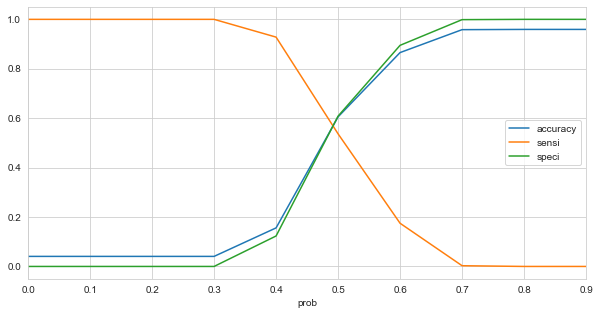

In [397]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'],figsize=(10, 5))
plt.show()

In [398]:
## making our final prediction on basis of optimal cut-off of 0.05
y_train_pred_final['final_predicted'] = y_train_pred_final.Performance_Prob.map( lambda x: 1 if x > 0.05 else 0)
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,7707,0.0,0.451471,0,1,1,1,1,1,0,0,0,0,0,1
1,70818,0.0,0.664826,1,1,1,1,1,1,1,1,0,0,0,1
2,47165,0.0,0.440958,0,1,1,1,1,1,0,0,0,0,0,1
3,69335,0.0,0.613582,1,1,1,1,1,1,1,1,0,0,0,1
4,40509,0.0,0.519569,1,1,1,1,1,1,1,0,0,0,0,1


In [399]:
## creating confusion matrix
confusion_matrix = metrics.confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted )
confusion_matrix

array([[    0, 47873],
       [    0,  2031]])

In [400]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_train_pred_final.Performance_Tag, 
                                                  y_train_pred_final.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_train_pred_final.Performance_Tag, 
                                                              y_train_pred_final.final_predicted, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

print("AUC:    \t", round(roc_auc_score(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob),2))

Accuracy: 	 0.04
Sensitivity: 	1.0
Specificity: 	0.0
AUC:    	 0.6


In [401]:
from sklearn.metrics import precision_score, recall_score
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted ))

precision :  0.04069814042962488
recall :  1.0


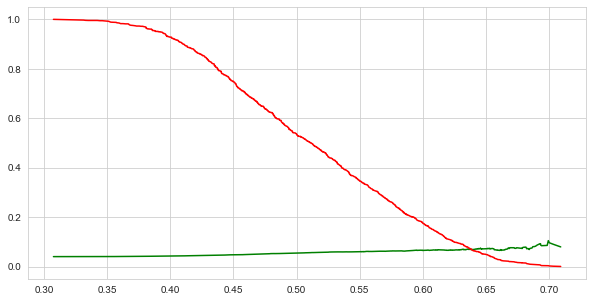

In [402]:
from sklearn.metrics import precision_recall_curve
## using precision_recall_curve from matrics
p, r, thresholds = precision_recall_curve(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob)

## creating plot from the precision recall curve
plt.figure(figsize=(10, 5))
plt.plot(thresholds, p[:-1], "g-", label ="precision")
plt.plot(thresholds, r[:-1], "r-", label ="recall")
plt.show()

#### Prediction on Test data

In [403]:
X_test[['Age','No_of_dependents','Income','No_of_months_in_current_residence','No_of_months_in_current_company']]=scaler.fit_transform(X_test[['Age','No_of_dependents','Income','No_of_months_in_current_residence','No_of_months_in_current_company']])

In [404]:
X_test.head()

,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company
7174,0.788566,-0.010108,-0.003987,1.000000,0.000000,0.007949,0.091424,-0.004294,0.671852,0.917712
42747,0.000000,-0.010108,-0.003987,0.899049,0.000000,0.017314,-0.028067,0.004149,0.671852,0.669150
37590,0.615749,-0.010108,-0.003987,0.000000,0.544891,0.017314,-0.028067,-0.004294,0.000000,0.669150
23553,1.000000,-0.010108,-0.003987,0.430611,0.189316,-0.017931,-0.028067,-0.004294,0.000000,0.917712
24744,0.770347,-0.010108,-0.003987,0.000000,0.229263,-0.017931,-0.013298,-0.004294,0.000000,0.651385


In [407]:
# Now let's use our model to make predictions.
X_test_new = X_test[X_trainw6.columns]
X_test_new = sm.add_constant(X_test_new)
logwm9 = sm.GLM(y_test,X_test_new, family = sm.families.Binomial()).fit()
# Making predictions
y_test_pred= logwm9.predict(X_test_new)

In [408]:
y_test_pred[:10]

7174     0.044424
42747    0.038476
37590    0.036659
23553    0.034280
24744    0.031429
26431    0.037164
32821    0.031675
17023    0.032344
59833    0.035955
1645     0.032077
dtype: float64

In [409]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

y_test_df['unique_id'] = y_test_df.index+1

# Appending y_test_df and y_pred_1
y_pred_df = pd.concat([y_test_df, y_test_pred],axis=1)
y_pred_df.head()

,Performance_Tag,unique_id,0
7174,1.0,7175,0.044424
42747,0.0,42748,0.038476
37590,0.0,37591,0.036659
23553,0.0,23554,0.034280
24744,0.0,24745,0.031429


In [410]:
# Renaming the column 
y_pred_df= y_pred_df.rename(columns={ 0 : 'Performance_Prob'})
y_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob
7174,1.0,7175,0.044424
42747,0.0,42748,0.038476
37590,0.0,37591,0.036659
23553,0.0,23554,0.034280
24744,0.0,24745,0.031429


In [411]:
## evaluating result based on the cut-off value obtained above
y_pred_df['final_predicted'] = y_pred_df.Performance_Prob.map(lambda x: 1 if x > 0.05 else 0)
y_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob,final_predicted
7174,1.0,7175,0.044424,0
42747,0.0,42748,0.038476,0
37590,0.0,37591,0.036659,0
23553,0.0,23554,0.034280,0
24744,0.0,24745,0.031429,0


In [412]:
## creating confusion matrix for test data
confusion2 = metrics.confusion_matrix(y_pred_df.Performance_Tag, y_pred_df.final_predicted )
confusion2

array([[15296,  5176],
       [  564,   352]])

In [413]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_df.Performance_Tag, y_pred_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

print("AUC:    \t", round(roc_auc_score(y_pred_df.Performance_Tag, y_pred_df.Performance_Prob),2))

Accuracy: 	 0.73
Sensitivity: 	0.38
Specificity: 	0.75
AUC:    	 0.58


In [414]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ))

precision :  0.06367583212735166
recall :  0.38427947598253276


In [261]:
print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[10957  9120]
 [  371   513]]
accuracy 0.547206717236773
precision 0.05325443786982249
recall 0.580316742081448


In [458]:
Demographic_PT_null1=Demographic_PT_null

In [459]:
demographics_nulls_data=Demographic_PT_null1.drop(['Performance_Tag'],axis=1)

In [460]:
## creating demographics WoE dataframe from original demographics dataframe
woe_demographic_data = create_woe_dataframe(demographics_nulls_data,woe_Demographic)
woe_demographic_data.head()

,Application_ID,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company
69603,906908303.0,0.001656,-0.010108,0.023327,0.040085,0.331605,0.017314,-0.028067,-0.004294,0.473666,0.102226
69604,10990583.0,0.039004,0.032174,-0.003987,-0.025204,0.129734,0.007949,0.091424,-0.004294,-0.063215,0.102226
69605,589678446.0,0.039004,-0.010108,-0.003987,0.054155,0.331605,-0.017931,0.091424,-0.004294,-0.241178,-0.063597
69606,809411322.0,0.094484,-0.010108,-0.003987,0.054155,0.065775,0.007949,-0.028067,-0.004294,-0.241178,-0.150676
69607,150246616.0,-0.040004,0.032174,-0.003987,-0.025204,0.065775,-0.029512,-0.028067,-0.004294,-0.241178,-0.150676


In [472]:

X_rejected = woe_demographic_data.drop(['Application_ID'],axis=1)

# Putting response variable to y
y_rejected = Demographic_model_df['Performance_Tag']

In [473]:
X_rejected[['Age','No_of_dependents','Income','No_of_months_in_current_residence','No_of_months_in_current_company']]=scaler.fit_transform(X_rejected[['Age','No_of_dependents','Income','No_of_months_in_current_residence','No_of_months_in_current_company']])

In [474]:
X_rejected.head()

,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company
69603,0.615749,-0.010108,0.023327,0.899049,1.000000,0.017314,-0.028067,-0.004294,1.000000,0.855205
69604,0.770347,0.032174,-0.003987,0.430611,0.695141,0.007949,0.091424,-0.004294,0.248954,0.855205
69605,0.770347,-0.010108,-0.003987,1.000000,1.000000,-0.017931,0.091424,-0.004294,0.000000,0.497758
69606,1.000000,-0.010108,-0.003987,1.000000,0.598552,0.007949,-0.028067,-0.004294,0.000000,0.310051
69607,0.443302,0.032174,-0.003987,0.430611,0.598552,-0.029512,-0.028067,-0.004294,0.000000,0.310051


In [475]:
# Now let's use our model to make predictions.
X_rejected_new = X_rejected[X_trainw6.columns]
X_rejected_new = sm.add_constant(X_rejected_new)

# Making predictions
y_rejected_pred= logwm9.predict(X_rejected_new)

In [476]:
## checking values
y_rejected_pred[:10]

69603    0.083914
69604    0.048810
69605    0.044087
69606    0.034436
69607    0.032965
69608    0.049957
69609    0.070585
69610    0.055191
69611    0.067238
69612    0.039288
dtype: float64

In [477]:
# Converting y_test to dataframe
y_rejected = pd.DataFrame(pd.Series(np.ones(X_rejected.shape[0], dtype = np.int)))
y_rejected = y_rejected.rename(columns={ 0 : 'Performance_Tag'})

y_rejected['unique_id'] = y_rejected.index+1

# Appending y_additional_df and y_pred_1
y_rejected_pred_df = pd.concat([y_rejected, pd.DataFrame(y_rejected_pred).reset_index()],axis=1)
y_rejected_pred_df = y_rejected_pred_df.drop('index',1)
y_rejected_pred_df.head()

,Performance_Tag,unique_id,0
0,1,1,0.083914
1,1,2,0.048810
2,1,3,0.044087
3,1,4,0.034436
4,1,5,0.032965


In [478]:
# Renaming the column 
y_rejected_pred_df= y_rejected_pred_df.rename(columns={ 0 : 'Performance_Prob'})
y_rejected_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob
0,1,1,0.083914
1,1,2,0.048810
2,1,3,0.044087
3,1,4,0.034436
4,1,5,0.032965


In [479]:
## evaluating result based on the cut-off value obtained above
y_rejected_pred_df['final_predicted'] = y_rejected_pred_df.Performance_Prob.map(lambda x: 1 if x > 0.05 else 0)
y_rejected_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob,final_predicted
0,1,1,0.083914,1
1,1,2,0.048810,0
2,1,3,0.044087,0
3,1,4,0.034436,0
4,1,5,0.032965,0


In [480]:
## creating confusion matrix for rejected data
confusion3 = metrics.confusion_matrix(y_rejected_pred_df.Performance_Tag, y_rejected_pred_df.final_predicted )
confusion3

array([[  0,   0],
       [645, 780]])

In [481]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_rejected_pred_df.Performance_Tag, y_rejected_pred_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_rejected_pred_df.Performance_Tag, 
                                                              y_rejected_pred_df.final_predicted, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy: 	 0.55
Sensitivity: 	0.55
Specificity: 	0.0


In [482]:
## using precision_score to evaluate matrics
print("precision : ", metrics.precision_score(y_rejected_pred_df.Performance_Tag, y_rejected_pred_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", metrics.recall_score(y_rejected_pred_df.Performance_Tag, y_rejected_pred_df.final_predicted ))

precision :  1.0
recall :  0.5473684210526316


In [483]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(class_weight='balanced',max_depth=5)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [484]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred= dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.97      0.21      0.34     20472
         1.0       0.05      0.85      0.09       916

    accuracy                           0.23     21388
   macro avg       0.51      0.53      0.21     21388
weighted avg       0.93      0.23      0.33     21388



In [485]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(class_weight='balanced',max_depth=5)
dt_default.fit(X_trainw, y_trainw)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [486]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_predw= dt_default.predict(X_testw)

# Printing classification report
print(classification_report(y_testw, y_predw))

              precision    recall  f1-score   support

         0.0       0.96      0.66      0.78     20472
         1.0       0.06      0.46      0.10       916

    accuracy                           0.65     21388
   macro avg       0.51      0.56      0.44     21388
weighted avg       0.93      0.65      0.75     21388



In [487]:
print(metrics.confusion_matrix(y_testw, y_predw))

# accuracy
print("accuracy", metrics.accuracy_score(y_testw, y_predw))

# precision
print("precision", metrics.precision_score(y_testw, y_predw))

# recall/sensitivity
print("recall", metrics.recall_score(y_testw, y_predw))

[[13449  7023]
 [  493   423]]
accuracy 0.6485879932672527
precision 0.056809024979854954
recall 0.46179039301310043


In [488]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# Putting features
features = list(X_trainw.columns)
features

['Age',
 'Gender',
 'Marital_Status',
 'No_of_dependents',
 'Income',
 'Education',
 'Profession',
 'Type_of_residence',
 'No_of_months_in_current_residence',
 'No_of_months_in_current_company']

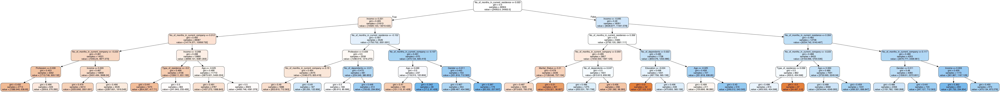

In [489]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,feature_names = list(X_trainw.columns) , filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [491]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# parameters to build the model on
parameters = {'max_depth': range(1, 40)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 101)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_trainw, y_trainw)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 39 candidates, totalling 195 fits


[Parallel(n_jobs=1)]: Done 195 out of 195 | elapsed:   26.5s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=101,
                                              splitter='best'),
             iid='warn', n_jobs=None, param_grid={'max_depth': range(1, 40)},
             pre_dispatch='2*n_j

In [492]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.025857,0.001359,0.008440,0.000402,1,{'max_depth': 1},0.486005,0.473822,0.479263,0.486486,...,0.478609,0.007269,4,0.476801,0.479685,0.478397,0.476601,0.481436,0.478584,0.001816
1,0.034850,0.003728,0.008518,0.000471,2,{'max_depth': 2},0.603053,0.348168,0.414747,0.371007,...,0.440888,0.090740,10,0.633700,0.370528,0.457733,0.365148,0.481436,0.461709,0.097595
2,0.039810,0.000835,0.008601,0.000353,3,{'max_depth': 3},0.465649,0.479058,0.421659,0.415233,...,0.461379,0.040308,8,0.470696,0.491813,0.455229,0.414409,0.521040,0.470637,0.035743
3,0.046743,0.000665,0.008602,0.000358,4,{'max_depth': 4},0.465649,0.460733,0.428571,0.488943,...,0.474320,0.032915,5,0.470696,0.525773,0.465247,0.514163,0.520421,0.499260,0.025867
4,0.053246,0.000723,0.008448,0.000198,5,{'max_depth': 5},0.501272,0.439791,0.467742,0.437346,...,0.482482,0.047852,3,0.551893,0.497878,0.502818,0.490764,0.581683,0.525007,0.035598


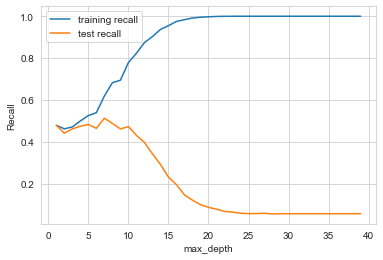

In [493]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [494]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    6.4s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sco

In [495]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.115677,0.010789,0.010192,0.001676,5,{'min_samples_leaf': 5},0.147420,0.219212,0.187192,0.194581,...,0.180715,0.026372,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.089332,0.014812,0.008732,0.001622,25,{'min_samples_leaf': 25},0.336609,0.376847,0.357143,0.315271,...,0.353036,0.024373,9,0.861453,0.849231,0.860923,0.867077,0.861538,0.860044,0.005855
2,0.085887,0.009455,0.008972,0.001120,45,{'min_samples_leaf': 45},0.425061,0.490148,0.450739,0.423645,...,0.447574,0.024094,8,0.830665,0.820308,0.827077,0.822154,0.820923,0.824225,0.004004
3,0.086338,0.007174,0.008715,0.000529,65,{'min_samples_leaf': 65},0.476658,0.514778,0.472906,0.443350,...,0.482524,0.025312,6,0.767857,0.771692,0.796308,0.799385,0.796308,0.786310,0.013602
4,0.081436,0.008657,0.008343,0.000827,85,{'min_samples_leaf': 85},0.503686,0.529557,0.463054,0.455665,...,0.485467,0.027453,5,0.759852,0.755077,0.765538,0.760615,0.748308,0.757878,0.005823


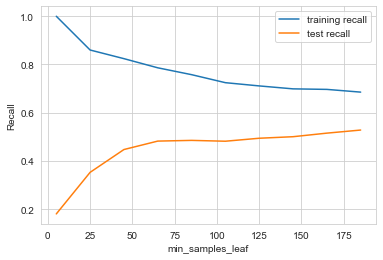

In [497]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [498]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_trainw, y_trainw)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    7.2s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_split': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sc

In [499]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.117756,0.012465,0.010307,0.000739,5,{'min_samples_split': 5},0.068796,0.118227,0.064039,0.105911,...,0.081247,0.026268,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.111725,0.013381,0.010687,0.001775,25,{'min_samples_split': 25},0.238329,0.337438,0.305419,0.280788,...,0.283626,0.035172,9,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
2,0.096146,0.004326,0.009032,0.000281,45,{'min_samples_split': 45},0.321867,0.406404,0.364532,0.332512,...,0.355999,0.029435,8,0.950739,0.953231,0.950769,0.956923,0.957538,0.953840,0.002919
3,0.090656,0.002995,0.009045,0.000303,65,{'min_samples_split': 65},0.336609,0.426108,0.413793,0.384236,...,0.391951,0.031036,7,0.914409,0.908308,0.921231,0.929846,0.913846,0.917528,0.007399
4,0.090607,0.004944,0.009181,0.000599,85,{'min_samples_split': 85},0.363636,0.458128,0.426108,0.391626,...,0.411643,0.032018,6,0.881158,0.881231,0.867077,0.887385,0.873846,0.878139,0.006999


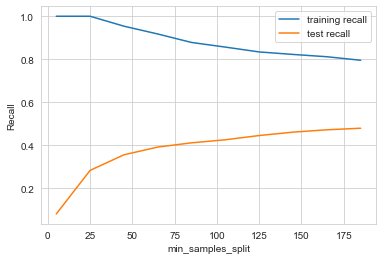

In [500]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [501]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 2),
    'min_samples_leaf': range(50, 250, 50),
    'min_samples_split': range(50, 250, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(class_weight='balanced')
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          scoring="recall", cv = n_folds,
                          return_train_score=True, verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 800 out of 800 | elapsed:  1.4min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 2),
                

In [502]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.057075,0.003053,0.008553,0.000232,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.447174,...,0.493375,0.035759,91,0.469212,0.508923,0.575385,0.564923,0.508308,0.525350,0.039449
1,0.059202,0.003321,0.009849,0.000529,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.447174,...,0.493375,0.035759,91,0.469212,0.508923,0.575385,0.564923,0.508308,0.525350,0.039449
2,0.060906,0.015482,0.008859,0.001795,entropy,5,50,150,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.447174,...,0.493375,0.035759,91,0.469212,0.508923,0.575385,0.564923,0.508308,0.525350,0.039449
3,0.051078,0.004661,0.008145,0.000979,entropy,5,50,200,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.449631,...,0.493374,0.033430,94,0.470443,0.510154,0.572923,0.564923,0.508308,0.525350,0.038381
4,0.056089,0.006985,0.009838,0.002192,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.452088,...,0.484014,0.034881,118,0.471059,0.492308,0.574154,0.547077,0.508923,0.518704,0.037262


In [503]:
# printing the optimal accuracy score and hyperparameters
print("best recall", grid_search.best_score_)
print(grid_search.best_estimator_)

best recall 0.5548762060478348
DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=9,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=200, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')


In [504]:
# model with optimal hyperparameters
clf_entropy = DecisionTreeClassifier(class_weight='balanced',
                                  criterion='entropy', 
                                  max_depth=5, 
                                  min_samples_leaf=200,
                                  min_samples_split=50)
clf_entropy.fit(X_trainw, y_trainw)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=200, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

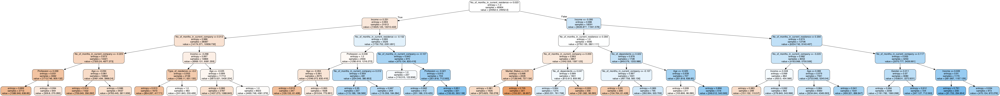

In [505]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_entropy, out_file=dot_data,feature_names=list(X_train.columns),filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [506]:
## checking accuracy score
clf_entropy.score(X_testw,y_testw)

0.656723396296989

In [507]:
## making predictions
y_predw = clf_entropy.predict(X_testw)


print(metrics.confusion_matrix(y_testw, y_predw))

# accuracy
print("accuracy", metrics.accuracy_score(y_testw, y_predw))

# precision
print("precision", metrics.precision_score(y_testw, y_predw))

# recall/sensitivity
print("recall", metrics.recall_score(y_testw, y_predw))

[[13627  6845]
 [  497   419]]
accuracy 0.656723396296989
precision 0.057681718061674006
recall 0.4574235807860262


In [509]:
from sklearn.ensemble import RandomForestClassifier

## creating Random Forest ensamble and fitting training data 
rfc = RandomForestClassifier(class_weight='balanced')
rfc.fit(X_trainw, y_trainw)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [510]:
# Making predictions
predictions = rfc.predict(X_testw)

In [511]:
# Let's check the report of our default model
print(classification_report(y_testw,predictions))

              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97     20472
         1.0       0.05      0.01      0.02       916

    accuracy                           0.95     21388
   macro avg       0.51      0.50      0.50     21388
weighted avg       0.92      0.95      0.93     21388



In [512]:
from sklearn import metrics
print(metrics.confusion_matrix(y_testw, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_testw, predictions))

# precision
print("precision", metrics.precision_score(y_testw, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_testw, predictions))

[[20317   155]
 [  907     9]]
accuracy 0.950345988404713
precision 0.054878048780487805
recall 0.009825327510917031


In [513]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(class_weight='balanced',max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                    return_train_score=True, verbose = 1)
rf.fit(X_trainw, y_trainw)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:  4.3min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [514]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.453312,0.091958,0.087603,0.006695,100,{'n_estimators': 100},0.449631,0.497537,0.458128,0.416256,...,0.456429,0.025962,1,0.527709,0.548923,0.545846,0.552000,0.553846,0.545665,0.009382
1,7.403195,0.528614,0.421271,0.034390,500,{'n_estimators': 500},0.429975,0.487685,0.455665,0.426108,...,0.452497,0.022642,3,0.533251,0.540923,0.550154,0.553846,0.552000,0.546035,0.007786
2,14.584565,0.808785,0.855313,0.170907,900,{'n_estimators': 900},0.437346,0.482759,0.455665,0.423645,...,0.452987,0.020766,2,0.529557,0.547692,0.549538,0.556308,0.550154,0.546650,0.009024
3,17.557643,1.612242,1.032755,0.093792,1300,{'n_estimators': 1300},0.429975,0.480296,0.465517,0.418719,...,0.451512,0.023225,4,0.529557,0.539692,0.553846,0.553231,0.552615,0.545788,0.009670


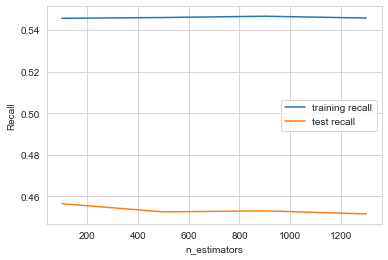

In [515]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("n_estimators")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [519]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [2, 4, 6, 10]}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced', max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_trainw, y_trainw)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    5.1s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [520]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.120819,0.014587,0.014710,0.001322,2,{'max_features': 2},0.481572,0.475369,0.453202,0.435961,...,0.465773,0.018314,1,0.562192,0.581538,0.521231,0.546462,0.590154,0.560315,0.024754
1,0.166033,0.017966,0.015261,0.001728,4,{'max_features': 4},0.461916,0.497537,0.438424,0.431034,...,0.455438,0.023455,2,0.559113,0.573538,0.521231,0.555077,0.529846,0.547761,0.019348
2,0.199205,0.012291,0.013957,0.000897,6,{'max_features': 6},0.420147,0.470443,0.492611,0.423645,...,0.450039,0.027798,3,0.535099,0.526154,0.574154,0.552000,0.556923,0.548866,0.016850
3,0.274141,0.022573,0.014155,0.001498,10,{'max_features': 10},0.427518,0.470443,0.463054,0.399015,...,0.443632,0.026670,4,0.538177,0.576615,0.592615,0.561846,0.575385,0.568928,0.018208


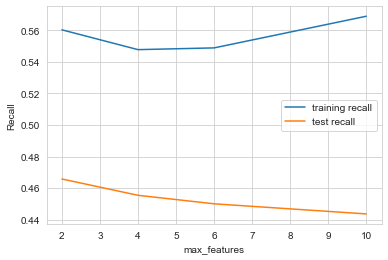

In [521]:
# plotting recall with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_features")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [522]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, n_jobs = -1,verbose = 1)
rf.fit(X_trainw, y_trainw)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    6.0s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [523]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.445192,0.006965,0.030048,0.000584,100,{'min_samples_leaf': 100},0.417690,0.445813,0.386700,0.389163,...,0.408662,0.021664,6,0.579433,0.587077,0.597538,0.604308,0.589538,0.591579,0.008596
1,0.514599,0.105298,0.034935,0.004123,150,{'min_samples_leaf': 150},0.464373,0.438424,0.435961,0.418719,...,0.438688,0.014653,5,0.580665,0.588923,0.564308,0.596308,0.575385,0.581118,0.011021
2,0.658454,0.009262,0.031853,0.004117,200,{'min_samples_leaf': 200},0.493857,0.504926,0.475369,0.440887,...,0.478576,0.021721,4,0.571429,0.587692,0.563692,0.563077,0.601846,0.577547,0.015048
3,0.602758,0.034865,0.038354,0.006556,250,{'min_samples_leaf': 250},0.476658,0.507389,0.502463,0.448276,...,0.484002,0.021069,3,0.551724,0.574769,0.577846,0.564923,0.576000,0.569053,0.009753
4,0.484611,0.101836,0.037489,0.015574,300,{'min_samples_leaf': 300},0.481572,0.514778,0.512315,0.445813,...,0.486463,0.025380,2,0.548645,0.582769,0.576000,0.549538,0.548923,0.561175,0.015024


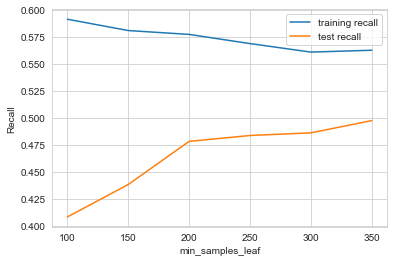

In [524]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [526]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1,n_jobs=-1)
rf.fit(X_trainw, y_trainw)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    2.5s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [527]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.532120,0.016421,0.032485,0.002114,200,{'min_samples_split': 200},0.319410,0.366995,0.327586,0.275862,...,0.325459,0.029562,6,0.617611,0.611692,0.608000,0.619077,0.611692,0.613614,0.004116
1,0.498220,0.029180,0.031610,0.003639,250,{'min_samples_split': 250},0.336609,0.371921,0.366995,0.337438,...,0.346633,0.019687,5,0.585591,0.581538,0.630769,0.614769,0.576000,0.597734,0.021277
2,0.469942,0.008121,0.029295,0.001766,300,{'min_samples_split': 300},0.388206,0.413793,0.386700,0.362069,...,0.392420,0.018900,4,0.604680,0.580308,0.590769,0.585846,0.597538,0.591828,0.008572
3,0.452375,0.017918,0.033908,0.009476,350,{'min_samples_split': 350},0.390663,0.411330,0.406404,0.413793,...,0.412122,0.015417,3,0.580049,0.592000,0.598769,0.590154,0.632615,0.598718,0.017978
4,0.434175,0.028286,0.029484,0.002790,400,{'min_samples_split': 400},0.400491,0.475369,0.428571,0.399015,...,0.421971,0.028725,2,0.560345,0.596308,0.579077,0.588308,0.606769,0.586161,0.015805


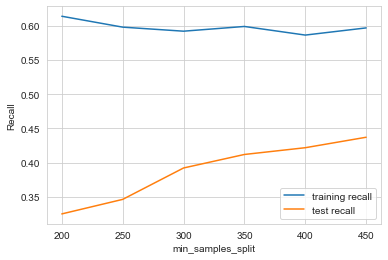

In [528]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [529]:
# specify number of folds for k-fold CV
n_folds = 3

param_grid = {
    'max_depth': [4,6,8],
    'min_samples_leaf': [300, 350], ##[250,300, 350]
    'min_samples_split': [400, 450], ##[350,400, 450]
    'n_estimators': [900,1000], ##[800,900,1000]
    'max_features': [2,4,6,8,10]
}
# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(estimator = rf, param_grid = param_grid, 
                    cv=n_folds, n_jobs = -1,verbose = 1,
                   scoring="recall",
                 return_train_score=True)
rf.fit(X_trainw, y_trainw)

Fitting 3 folds for each of 120 candidates, totalling 360 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 360 out of 360 | elapsed: 34.6min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [530]:
# printing the optimal recall score and hyperparameters
print('We can get recall of',rf.best_score_,'using',rf.best_params_)

We can get recall of 0.513047710392728 using {'max_depth': 4, 'max_features': 2, 'min_samples_leaf': 350, 'min_samples_split': 400, 'n_estimators': 1000}


In [531]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=4,
                             min_samples_leaf=300, 
                             min_samples_split=400,
                             max_features=2,
                             n_estimators=900,class_weight='balanced')

In [532]:
# fit
rfc.fit(X_trainw,y_trainw)

# predict
predictions = rfc.predict(X_testw)

print(classification_report(y_testw,predictions))

              precision    recall  f1-score   support

         0.0       0.97      0.62      0.75     20472
         1.0       0.06      0.51      0.10       916

    accuracy                           0.61     21388
   macro avg       0.51      0.56      0.43     21388
weighted avg       0.93      0.61      0.73     21388



In [533]:
print(metrics.confusion_matrix(y_testw, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_testw, predictions))

# precision
print("precision", metrics.precision_score(y_testw, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_testw, predictions))

[[12671  7801]
 [  452   464]]
accuracy 0.6141294183654386
precision 0.056140350877192984
recall 0.5065502183406113


In [534]:
### Models Building for Combined Demographic and Credit Bureau Data

In [535]:
master_df.head()

,Application_ID,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,...,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans),No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans),Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,Performance_Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,...,2,0,0,0,0,1.0,2999395.0,4,0,0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,...,2,0,0,0,0,0.0,3078.0,5,0,0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,...,0,0,0,0,0,1.0,3004972.0,2,0,0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,...,1,0,0,0,0,1.0,3355373.0,4,1,0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,...,1,0,0,0,0,1.0,3014283.0,4,0,0


In [536]:
## chcking the object type for creating dummies
object_dtype = master_df.select_dtypes('object').columns

# Creating a dummy variable for the variable 'job' and dropping the first one.
for col in object_dtype:
    
    col = pd.get_dummies(master_df[col],prefix=col,drop_first=True)
    master_df = pd.concat([master_df,col],axis=1)

#Adding the results to the master dataframe
master_df.drop(object_dtype, inplace = True,axis = 1)


In [537]:
# Putting feature variable to X
X = master_df.drop(['Performance_Tag','Application_ID'],axis=1)

# Putting response variable to y
y = master_df['Performance_Tag']

In [538]:
#Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

In [539]:
X_train.shape

(48906, 35)

In [540]:
X_train.head()

,Age,No_of_dependents,Income,No_of_months_in_current_residence,No_of_months_in_current_company,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,...,Education_Others,Education_Phd,Education_Professional,Education_unknown,Profession_SE,Profession_SE_PROF,Type_of_residence_Living with Parents,Type_of_residence_Others,Type_of_residence_Owned,Type_of_residence_Rented
45071,55,1.0,9.0,122,7,0,0,0,1,0,...,0,0,0,0,1,0,0,0,1,0
5295,31,1.0,9.0,120,44,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6910,53,3.0,9.0,120,48,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,1
32986,33,1.0,18.0,6,51,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,1
54700,55,4.0,40.0,25,8,1,1,1,1,1,...,0,0,0,0,1,0,0,0,0,1


In [541]:
X_train.columns

Index(['Age', 'No_of_dependents', 'Income',
       'No_of_months_in_current_residence', 'No_of_months_in_current_company',
       'No_of_times_90_DPD_or_worse_in_last_6_months',
       'No_of_times_60_DPD_or_worse_in_last_6_months',
       'No_of_times_30_DPD_or_worse_in_last_6_months',
       'No_of_times_90_DPD_or_worse_in_last_12_months',
       'No_of_times_60_DPD_or_worse_in_last_12_months',
       'No_of_times_30_DPD_or_worse_in_last_12_months',
       'Avgas_CC_Utilization_in_last_12_months',
       'No_of_trades_opened_in_last_6_months',
       'No_of_trades_opened_in_last_12_months',
       'No_of_PL_trades_opened_in_last_6_months',
       'No_of_PL_trades_opened_in_last_12_months',
       'No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)',
       'No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)',
       'Presence_of_open_home_loan', 'Outstanding_Balance',
       'Total_No_of_Trades', 'Presence_of_open_auto_loan', 'Gender_M',
       'Marital_Statu

In [542]:
## scaling the  non-dummy variables with min-max scaling
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

scaleColumns = ['Age','No_of_dependents','Income','No_of_months_in_current_residence',
                'No_of_months_in_current_company','No_of_times_90_DPD_or_worse_in_last_6_months',
                'No_of_times_60_DPD_or_worse_in_last_6_months','No_of_times_30_DPD_or_worse_in_last_6_months',
                'No_of_times_90_DPD_or_worse_in_last_12_months','No_of_times_60_DPD_or_worse_in_last_12_months',
                'No_of_times_30_DPD_or_worse_in_last_12_months','Avgas_CC_Utilization_in_last_12_months',
                'No_of_trades_opened_in_last_6_months','No_of_trades_opened_in_last_12_months',
                'No_of_PL_trades_opened_in_last_6_months','No_of_PL_trades_opened_in_last_12_months',
                'No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)',
                'No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)',
                'Presence_of_open_home_loan', 'Outstanding_Balance','Total_No_of_Trades']


X_train[scaleColumns]=scaler.fit_transform(X_train[scaleColumns])
X_train.head()

,Age,No_of_dependents,Income,No_of_months_in_current_residence,No_of_months_in_current_company,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,...,Education_Others,Education_Phd,Education_Professional,Education_unknown,Profession_SE,Profession_SE_PROF,Type_of_residence_Living with Parents,Type_of_residence_Others,Type_of_residence_Owned,Type_of_residence_Rented
45071,0.787234,0.00,0.150000,0.966667,0.032,0.000000,0.0,0.000000,0.2,0.000000,...,0,0,0,0,1,0,0,0,1,0
5295,0.276596,0.00,0.150000,0.950000,0.328,0.000000,0.0,0.000000,0.0,0.000000,...,0,0,0,0,0,0,0,0,0,1
6910,0.744681,0.50,0.150000,0.950000,0.360,0.000000,0.0,0.000000,0.0,0.142857,...,0,0,0,0,1,0,0,0,0,1
32986,0.319149,0.00,0.300000,0.000000,0.384,0.000000,0.0,0.000000,0.0,0.000000,...,0,0,1,0,0,1,0,0,0,1
54700,0.787234,0.75,0.666667,0.158333,0.040,0.333333,0.2,0.142857,0.2,0.142857,...,0,0,0,0,1,0,0,0,0,1


In [543]:
## describing the train data after it is scaled
## to check for appropriate scaling
X_train.describe()

,Age,No_of_dependents,Income,No_of_months_in_current_residence,No_of_months_in_current_company,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,...,Education_Others,Education_Phd,Education_Professional,Education_unknown,Profession_SE,Profession_SE_PROF,Type_of_residence_Living with Parents,Type_of_residence_Others,Type_of_residence_Owned,Type_of_residence_Rented
count,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,...,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000,48906.000000
mean,0.574950,0.466119,0.457693,0.237164,0.249434,0.082478,0.078048,0.074358,0.082624,0.085786,...,0.001697,0.062630,0.349282,0.001779,0.200834,0.233468,0.025089,0.002965,0.200037,0.749233
std,0.210389,0.346761,0.258249,0.306750,0.162544,0.168163,0.154306,0.142546,0.152327,0.145934,...,0.041162,0.242299,0.476748,0.042140,0.400628,0.423042,0.156397,0.054370,0.400032,0.433459
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.425532,0.250000,0.233333,0.000000,0.112000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.574468,0.500000,0.450000,0.033333,0.248000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.744681,0.750000,0.666667,0.450000,0.384000,0.000000,0.200000,0.142857,0.200000,0.142857,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


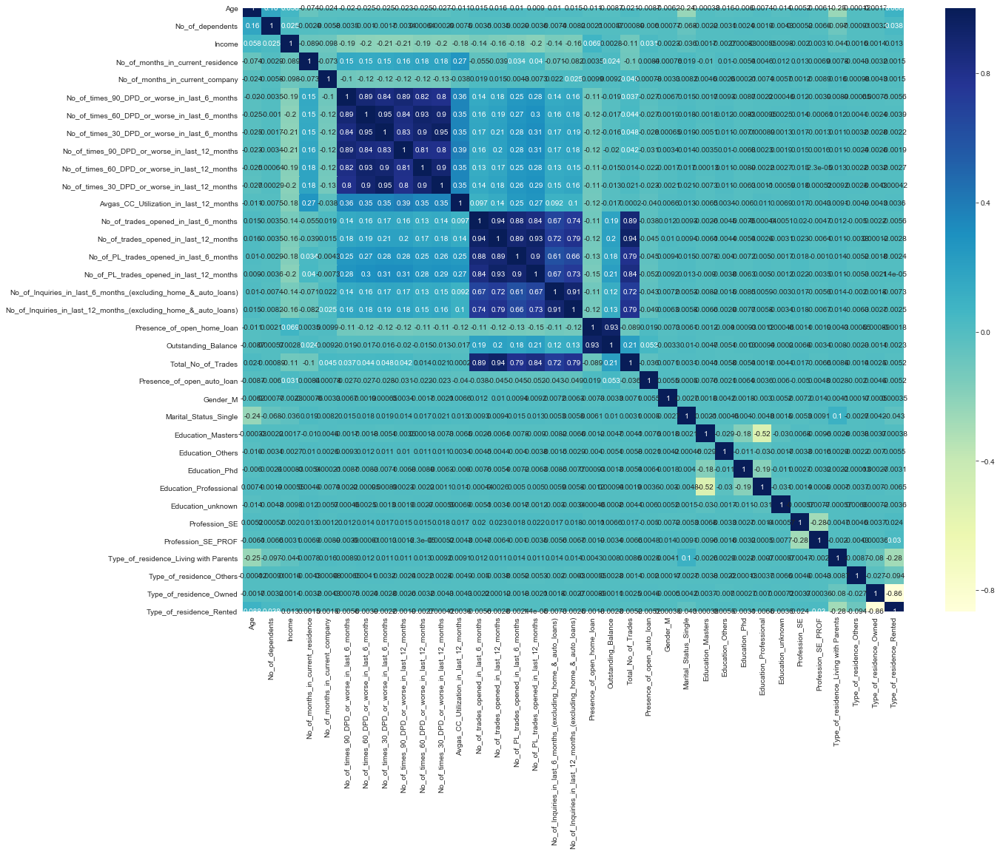

In [544]:
plt.figure(figsize = (20, 15))
sns.heatmap(X_train.corr(), annot = True,cmap="YlGnBu")
plt.show()

In [545]:
# Importing LogisticRegression and metrics from sklearn library
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

In [546]:
## Creating a Logistic Regression MOdel with balanced class
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(class_weight='balanced')

In [547]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 20)             # running RFE with 15 variables as output
rfe = rfe.fit(X_train,y_train)
print(rfe.support_)           # Printing the boolean results
print(rfe.ranking_)           

[False False  True  True  True  True False  True  True False  True  True
 False False  True  True  True  True  True  True  True False False False
 False  True False False False False False  True  True  True  True]
[ 8 10  1  1  1  1 14  1  1  7  1  1  2  3  1  1  1  1  1  1  1 16  9  4
 13  1  5 11 12  6 15  1  1  1  1]


In [548]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('Age', False, 8),
 ('No_of_dependents', False, 10),
 ('Income', True, 1),
 ('No_of_months_in_current_residence', True, 1),
 ('No_of_months_in_current_company', True, 1),
 ('No_of_times_90_DPD_or_worse_in_last_6_months', True, 1),
 ('No_of_times_60_DPD_or_worse_in_last_6_months', False, 14),
 ('No_of_times_30_DPD_or_worse_in_last_6_months', True, 1),
 ('No_of_times_90_DPD_or_worse_in_last_12_months', True, 1),
 ('No_of_times_60_DPD_or_worse_in_last_12_months', False, 7),
 ('No_of_times_30_DPD_or_worse_in_last_12_months', True, 1),
 ('Avgas_CC_Utilization_in_last_12_months', True, 1),
 ('No_of_trades_opened_in_last_6_months', False, 2),
 ('No_of_trades_opened_in_last_12_months', False, 3),
 ('No_of_PL_trades_opened_in_last_6_months', True, 1),
 ('No_of_PL_trades_opened_in_last_12_months', True, 1),
 ('No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)', True, 1),
 ('No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)', True, 1),
 ('Presence_of_open_home_loan', T

In [549]:
col = X_train.columns[rfe.support_]
col

Index(['Income', 'No_of_months_in_current_residence',
       'No_of_months_in_current_company',
       'No_of_times_90_DPD_or_worse_in_last_6_months',
       'No_of_times_30_DPD_or_worse_in_last_6_months',
       'No_of_times_90_DPD_or_worse_in_last_12_months',
       'No_of_times_30_DPD_or_worse_in_last_12_months',
       'Avgas_CC_Utilization_in_last_12_months',
       'No_of_PL_trades_opened_in_last_6_months',
       'No_of_PL_trades_opened_in_last_12_months',
       'No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans)',
       'No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)',
       'Presence_of_open_home_loan', 'Outstanding_Balance',
       'Total_No_of_Trades', 'Education_Others',
       'Type_of_residence_Living with Parents', 'Type_of_residence_Others',
       'Type_of_residence_Owned', 'Type_of_residence_Rented'],
      dtype='object')

In [550]:
X_train.columns[~rfe.support_]

Index(['Age', 'No_of_dependents',
       'No_of_times_60_DPD_or_worse_in_last_6_months',
       'No_of_times_60_DPD_or_worse_in_last_12_months',
       'No_of_trades_opened_in_last_6_months',
       'No_of_trades_opened_in_last_12_months', 'Presence_of_open_auto_loan',
       'Gender_M', 'Marital_Status_Single', 'Education_Masters',
       'Education_Phd', 'Education_Professional', 'Education_unknown',
       'Profession_SE', 'Profession_SE_PROF'],
      dtype='object')

In [551]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe1 = X_train[col]

In [552]:
logmt1 = fit_LRM(X_train_rfe1)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48885
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8130.3
Date:                Mon, 23 Dec 2019   Deviance:                       16261.
Time:                        21:23:30   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                                                      coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------

In [556]:
getVIF(X_train_rfe1)

,Features,VIF
13,Outstanding_Balance,355.62
12,Presence_of_open_home_loan,241.41
9,No_of_PL_trades_opened_in_last_12_months,60.35
4,No_of_times_30_DPD_or_worse_in_last_6_months,17.01
11,No_of_Inquiries_in_last_12_months_(excluding_h...,15.28
14,Total_No_of_Trades,14.82
6,No_of_times_30_DPD_or_worse_in_last_12_months,14.53
10,No_of_Inquiries_in_last_6_months_(excluding_ho...,10.66
8,No_of_PL_trades_opened_in_last_6_months,9.73
19,Type_of_residence_Rented,8.24


In [559]:
X_trainm1 = X_train_rfe1.drop('Outstanding_Balance', axis=1)
logmt2 = fit_LRM(X_trainm1)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48886
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8132.1
Date:                Mon, 23 Dec 2019   Deviance:                       16264.
Time:                        21:39:24   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                                                      coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------

In [560]:
getVIF(X_trainm1)

,Features,VIF
4,No_of_times_30_DPD_or_worse_in_last_6_months,16.99
9,No_of_PL_trades_opened_in_last_12_months,16.59
11,No_of_Inquiries_in_last_12_months_(excluding_h...,15.27
13,Total_No_of_Trades,14.79
6,No_of_times_30_DPD_or_worse_in_last_12_months,14.53
10,No_of_Inquiries_in_last_6_months_(excluding_ho...,10.66
8,No_of_PL_trades_opened_in_last_6_months,9.73
18,Type_of_residence_Rented,8.17
5,No_of_times_90_DPD_or_worse_in_last_12_months,7.31
3,No_of_times_90_DPD_or_worse_in_last_6_months,7.18


In [562]:
X_trainm2 = X_trainm1.drop('No_of_times_30_DPD_or_worse_in_last_6_months', axis=1)
logmt3 = fit_LRM(X_trainm2)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48887
Model Family:                Binomial   Df Model:                           18
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8132.7
Date:                Mon, 23 Dec 2019   Deviance:                       16265.
Time:                        21:39:57   Pearson chi2:                 4.78e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                                                      coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------

In [563]:
getVIF(X_trainm2)

,Features,VIF
8,No_of_PL_trades_opened_in_last_12_months,16.57
10,No_of_Inquiries_in_last_12_months_(excluding_h...,15.26
12,Total_No_of_Trades,14.79
9,No_of_Inquiries_in_last_6_months_(excluding_ho...,10.66
7,No_of_PL_trades_opened_in_last_6_months,9.73
17,Type_of_residence_Rented,8.17
4,No_of_times_90_DPD_or_worse_in_last_12_months,7.28
3,No_of_times_90_DPD_or_worse_in_last_6_months,6.54
5,No_of_times_30_DPD_or_worse_in_last_12_months,4.41
0,Income,4.10


In [564]:
X_trainm3 = X_trainm2.drop('No_of_PL_trades_opened_in_last_12_months', axis=1)
logmt4 = fit_LRM(X_trainm3)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48888
Model Family:                Binomial   Df Model:                           17
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8137.9
Date:                Mon, 23 Dec 2019   Deviance:                       16276.
Time:                        21:40:43   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                                                      coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------

In [566]:
getVIF(X_trainm3)

,Features,VIF
9,No_of_Inquiries_in_last_12_months_(excluding_h...,15.20
11,Total_No_of_Trades,11.53
8,No_of_Inquiries_in_last_6_months_(excluding_ho...,10.66
16,Type_of_residence_Rented,8.12
4,No_of_times_90_DPD_or_worse_in_last_12_months,7.23
3,No_of_times_90_DPD_or_worse_in_last_6_months,6.53
7,No_of_PL_trades_opened_in_last_6_months,6.39
5,No_of_times_30_DPD_or_worse_in_last_12_months,4.35
0,Income,4.09
2,No_of_months_in_current_company,3.28


In [567]:
X_trainm4 = X_trainm3.drop('No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans)', axis=1)
logmt5 = fit_LRM(X_trainm4)
getVIF(X_trainm4)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48889
Model Family:                Binomial   Df Model:                           16
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8150.1
Date:                Mon, 23 Dec 2019   Deviance:                       16300.
Time:                        21:43:09   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                                                     coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------

,Features,VIF
10,Total_No_of_Trades,10.02
15,Type_of_residence_Rented,8.12
4,No_of_times_90_DPD_or_worse_in_last_12_months,7.21
3,No_of_times_90_DPD_or_worse_in_last_6_months,6.52
7,No_of_PL_trades_opened_in_last_6_months,6.39
5,No_of_times_30_DPD_or_worse_in_last_12_months,4.33
0,Income,4.09
8,No_of_Inquiries_in_last_6_months_(excluding_ho...,3.90
2,No_of_months_in_current_company,3.28
14,Type_of_residence_Owned,2.89


In [568]:
X_trainm5 = X_trainm4.drop('Total_No_of_Trades', axis=1)
logmt6 = fit_LRM(X_trainm5)
getVIF(X_trainm5)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48890
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8150.9
Date:                Mon, 23 Dec 2019   Deviance:                       16302.
Time:                        21:43:54   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                                                     coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------

,Features,VIF
14,Type_of_residence_Rented,7.65
4,No_of_times_90_DPD_or_worse_in_last_12_months,7.16
3,No_of_times_90_DPD_or_worse_in_last_6_months,6.51
5,No_of_times_30_DPD_or_worse_in_last_12_months,4.26
0,Income,4.08
2,No_of_months_in_current_company,3.27
7,No_of_PL_trades_opened_in_last_6_months,3.06
8,No_of_Inquiries_in_last_6_months_(excluding_ho...,2.85
13,Type_of_residence_Owned,2.76
6,Avgas_CC_Utilization_in_last_12_months,2.52


In [569]:
X_trainm6 = X_trainm5.drop('Type_of_residence_Rented', axis=1)
logmt7 = fit_LRM(X_trainm6)
getVIF(X_trainm6)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48891
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8151.2
Date:                Mon, 23 Dec 2019   Deviance:                       16302.
Time:                        21:44:52   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                                                     coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------

,Features,VIF
4,No_of_times_90_DPD_or_worse_in_last_12_months,7.15
3,No_of_times_90_DPD_or_worse_in_last_6_months,6.50
5,No_of_times_30_DPD_or_worse_in_last_12_months,4.23
7,No_of_PL_trades_opened_in_last_6_months,3.04
8,No_of_Inquiries_in_last_6_months_(excluding_ho...,2.77
2,No_of_months_in_current_company,2.46
0,Income,2.43
6,Avgas_CC_Utilization_in_last_12_months,2.40
1,No_of_months_in_current_residence,1.69
9,Presence_of_open_home_loan,1.34


In [570]:
X_trainm7 = X_trainm6.drop('No_of_times_90_DPD_or_worse_in_last_12_months', axis=1)
logmt8 = fit_LRM(X_trainm7)
getVIF(X_trainm7)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48892
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8157.5
Date:                Mon, 23 Dec 2019   Deviance:                       16315.
Time:                        21:45:43   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                                                     coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------

,Features,VIF
4,No_of_times_30_DPD_or_worse_in_last_12_months,3.78
3,No_of_times_90_DPD_or_worse_in_last_6_months,3.49
6,No_of_PL_trades_opened_in_last_6_months,3.03
7,No_of_Inquiries_in_last_6_months_(excluding_ho...,2.77
2,No_of_months_in_current_company,2.46
0,Income,2.43
5,Avgas_CC_Utilization_in_last_12_months,2.37
1,No_of_months_in_current_residence,1.69
8,Presence_of_open_home_loan,1.34
12,Type_of_residence_Owned,1.23


In [571]:
X_trainm8 = X_trainm7.drop('Type_of_residence_Living with Parents', axis=1)
logmt9 = fit_LRM(X_trainm8)
getVIF(X_trainm8)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48893
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8157.5
Date:                Mon, 23 Dec 2019   Deviance:                       16315.
Time:                        21:47:13   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                                                     coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------

,Features,VIF
4,No_of_times_30_DPD_or_worse_in_last_12_months,3.78
3,No_of_times_90_DPD_or_worse_in_last_6_months,3.49
6,No_of_PL_trades_opened_in_last_6_months,3.03
7,No_of_Inquiries_in_last_6_months_(excluding_ho...,2.77
2,No_of_months_in_current_company,2.45
0,Income,2.43
5,Avgas_CC_Utilization_in_last_12_months,2.37
1,No_of_months_in_current_residence,1.69
8,Presence_of_open_home_loan,1.34
11,Type_of_residence_Owned,1.22


In [572]:
X_trainm9 = X_trainm8.drop('No_of_times_90_DPD_or_worse_in_last_6_months', axis=1)
logmt10 = fit_LRM(X_trainm9)
getVIF(X_trainm9)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48894
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8157.6
Date:                Mon, 23 Dec 2019   Deviance:                       16315.
Time:                        21:48:51   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                                                     coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------

,Features,VIF
5,No_of_PL_trades_opened_in_last_6_months,3.03
6,No_of_Inquiries_in_last_6_months_(excluding_ho...,2.77
2,No_of_months_in_current_company,2.45
0,Income,2.42
4,Avgas_CC_Utilization_in_last_12_months,2.32
1,No_of_months_in_current_residence,1.69
3,No_of_times_30_DPD_or_worse_in_last_12_months,1.62
7,Presence_of_open_home_loan,1.33
10,Type_of_residence_Owned,1.22
8,Education_Others,1.00


In [573]:
X_trainm10 = X_trainm9.drop('Type_of_residence_Owned', axis=1)
logmt11 = fit_LRM(X_trainm10)
getVIF(X_trainm10)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48895
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8157.7
Date:                Mon, 23 Dec 2019   Deviance:                       16315.
Time:                        21:50:46   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                                                     coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------

,Features,VIF
5,No_of_PL_trades_opened_in_last_6_months,3.03
6,No_of_Inquiries_in_last_6_months_(excluding_ho...,2.76
2,No_of_months_in_current_company,2.43
0,Income,2.38
4,Avgas_CC_Utilization_in_last_12_months,2.32
1,No_of_months_in_current_residence,1.68
3,No_of_times_30_DPD_or_worse_in_last_12_months,1.61
7,Presence_of_open_home_loan,1.33
8,Education_Others,1.00
9,Type_of_residence_Others,1.00


In [574]:
X_trainm11 = X_trainm10.drop('Type_of_residence_Others', axis=1)
logmt12 = fit_LRM(X_trainm11)
getVIF(X_trainm11)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48896
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8158.1
Date:                Mon, 23 Dec 2019   Deviance:                       16316.
Time:                        21:51:00   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                                                     coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------

,Features,VIF
5,No_of_PL_trades_opened_in_last_6_months,3.03
6,No_of_Inquiries_in_last_6_months_(excluding_ho...,2.76
2,No_of_months_in_current_company,2.43
0,Income,2.37
4,Avgas_CC_Utilization_in_last_12_months,2.32
1,No_of_months_in_current_residence,1.68
3,No_of_times_30_DPD_or_worse_in_last_12_months,1.61
7,Presence_of_open_home_loan,1.33
8,Education_Others,1.00


In [575]:
X_trainm12 = X_trainm11.drop('Presence_of_open_home_loan', axis=1)
logmt13 = fit_LRM(X_trainm12)
getVIF(X_trainm12)

                 Generalized Linear Model Regression Results                  
Dep. Variable:        Performance_Tag   No. Observations:                48906
Model:                            GLM   Df Residuals:                    48897
Model Family:                Binomial   Df Model:                            8
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8158.7
Date:                Mon, 23 Dec 2019   Deviance:                       16317.
Time:                        21:51:58   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                                                     coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------

,Features,VIF
5,No_of_PL_trades_opened_in_last_6_months,3.02
6,No_of_Inquiries_in_last_6_months_(excluding_ho...,2.76
2,No_of_months_in_current_company,2.38
4,Avgas_CC_Utilization_in_last_12_months,2.32
0,Income,2.23
1,No_of_months_in_current_residence,1.67
3,No_of_times_30_DPD_or_worse_in_last_12_months,1.61
7,Education_Others,1.00


In [578]:
y_train_pred = logmt13.predict(X_trainm11)
y_train_pred[:10]

45071    0.767826
5295     0.325969
6910     0.338499
32986    0.505018
54700    0.210068
27469    0.585374
25840    0.153638
16415    0.571117
34330    0.687708
32354    0.594168
dtype: float64

In [579]:
## reshaping the values to get an array
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.76782598, 0.32596858, 0.33849922, 0.50501821, 0.21006826,
       0.58537393, 0.15363823, 0.57111687, 0.6877078 , 0.59416842])

In [580]:
## putting the model provided probability values and the actual values in a dataframe along with row numbers
predicted = pd.DataFrame(y_train_pred)
predicted = predicted.rename({0 :'Default_Prob'}, axis = 'columns')
predicted.head()

,Default_Prob
0,0.767826
1,0.325969
2,0.338499
3,0.505018
4,0.210068


In [581]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
predicted['predicted'] = predicted.Default_Prob.map(lambda x: 1 if x > 0.5 else 0)
predicted.head()

,Default_Prob,predicted
0,0.767826,1
1,0.325969,0
2,0.338499,0
3,0.505018,1
4,0.210068,0


In [582]:
## need to prepare the Confusion matrix
confusion = confusion_matrix(y_train, predicted.predicted )
print(confusion)

[[35069 11796]
 [ 1270   771]]


In [583]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train, predicted.predicted))

0.7328344170449433


In [584]:
## function to draw the ROC curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(10, 10))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for model')
    plt.legend(loc="lower right")
    plt.show()

    return None

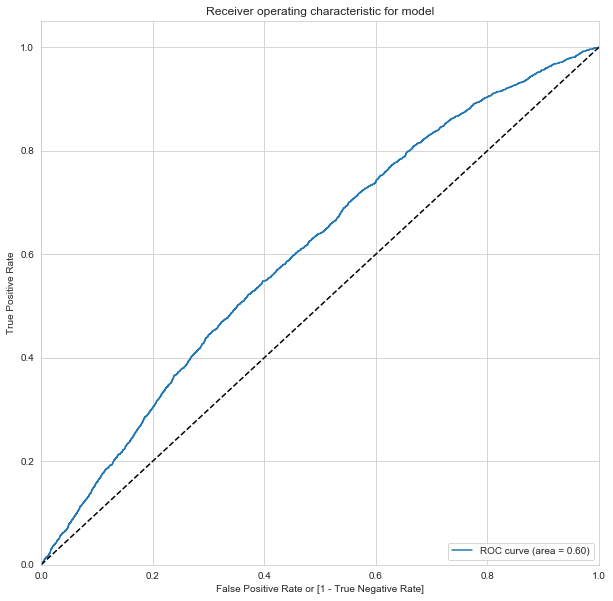

In [585]:
## using roc_cuve from the matrics
fpr, tpr, thresholds = metrics.roc_curve( y_train, predicted.predicted, 
                                         drop_intermediate = False )
## draw ROC curve based on the probability values generated by the model
draw_roc(y_train, predicted.Default_Prob)

In [586]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    predicted[i] = predicted.Default_Prob.map(lambda x: 1 if x > i else 0)
predicted.head()

,Default_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0.767826,1,1,1,1,1,1,1,1,1,0,0
1,0.325969,0,1,1,1,1,0,0,0,0,0,0
2,0.338499,0,1,1,1,1,0,0,0,0,0,0
3,0.505018,1,1,1,1,1,1,1,0,0,0,0
4,0.210068,0,1,1,1,0,0,0,0,0,0,0


In [587]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci','ppv','npv'])
from sklearn.metrics import confusion_matrix

In [588]:
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train, predicted[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    ppv = cm1[1,1] /(cm1[1,1]+cm1[0,1])
    npv = cm1[0,0]/(cm1[0,0]+cm1[1,0])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci,ppv, npv ]
print(cutoff_df)

     prob  accuracy     sensi     speci       ppv       npv
0.0   0.0  0.041733  1.000000  0.000000  0.041733       NaN
0.1   0.1  0.200548  0.917687  0.169316  0.045903  0.979267
0.2   0.2  0.383634  0.776580  0.366521  0.050683  0.974139
0.3   0.3  0.517135  0.631553  0.512152  0.053370  0.969621
0.4   0.4  0.627489  0.515924  0.632348  0.057594  0.967737
0.5   0.5  0.732834  0.377756  0.748298  0.061351  0.965051
0.6   0.6  0.824336  0.223910  0.850485  0.061227  0.961778
0.7   0.7  0.899706  0.103871  0.934365  0.064477  0.959906
0.8   0.8  0.945589  0.019108  0.985938  0.055874  0.958472
0.9   0.9  0.958103  0.000000  0.999829  0.000000  0.958260


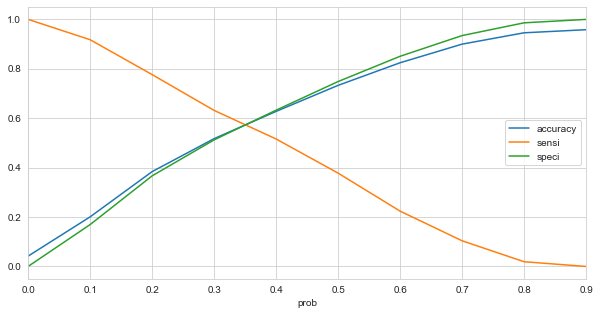

In [589]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'],figsize=(10, 5))
plt.show()

In [590]:
## making our final prediction on basis of optimal cut-off of 0.05
predicted['predicted'] = predicted.Default_Prob.map(lambda x: 1 if x > 0.05 else 0)
predicted.head()

,Default_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0.767826,1,1,1,1,1,1,1,1,1,0,0
1,0.325969,1,1,1,1,1,0,0,0,0,0,0
2,0.338499,1,1,1,1,1,0,0,0,0,0,0
3,0.505018,1,1,1,1,1,1,1,0,0,0,0
4,0.210068,1,1,1,1,0,0,0,0,0,0,0


In [591]:
## creating confusion matrix
confusion_matrix = metrics.confusion_matrix(y_train, predicted.predicted )
confusion_matrix

array([[ 2025, 44840],
       [   40,  2001]])

In [592]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_train, predicted.predicted ),2))

Accuracy: 	 0.08


In [593]:
# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_train, predicted.predicted, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

print("AUC:    \t", round(roc_auc_score(y_train, predicted.Default_Prob),2)) 

Sensitivity: 	0.98
Specificity: 	0.04
AUC:    	 0.6


In [594]:
from sklearn.metrics import precision_score, recall_score
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_train, predicted.predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_train, predicted.predicted ))

precision :  0.042718985504152346
recall :  0.9804017638412543


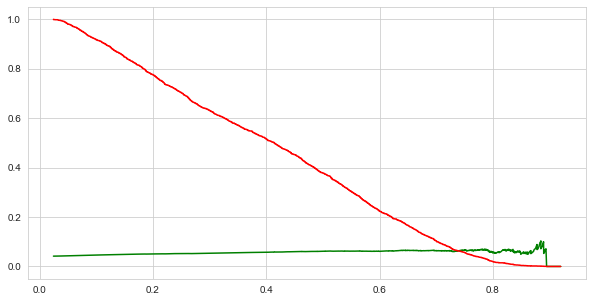

In [595]:
from sklearn.metrics import precision_recall_curve
## using precision_recall_curve from matrics
p, r, thresholds = precision_recall_curve(y_train, predicted.Default_Prob)

## creating plot from the precision recall curve
plt.figure(figsize=(10, 5))
plt.plot(thresholds, p[:-1], "g-", label ="precision")
plt.plot(thresholds, r[:-1], "r-", label ="recall")
plt.show()

In [596]:
# predict on test data
X_test.shape

(20961, 35)

In [597]:
## transforming test data
X_test[scaleColumns]=scaler.transform(X_test[scaleColumns])
X_test.head()

,Age,No_of_dependents,Income,No_of_months_in_current_residence,No_of_months_in_current_company,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,...,Education_Others,Education_Phd,Education_Professional,Education_unknown,Profession_SE,Profession_SE_PROF,Type_of_residence_Living with Parents,Type_of_residence_Others,Type_of_residence_Owned,Type_of_residence_Rented
37031,0.468085,0.75,0.850000,0.000000,0.560,0.0,0.0,0.000000,0.0,0.000000,...,0,0,0,0,0,0,0,0,0,1
58016,0.872340,0.00,0.450000,0.025000,0.112,0.0,0.2,0.142857,0.2,0.142857,...,0,0,0,0,0,0,0,0,0,1
5851,0.446809,0.75,0.483333,0.741667,0.320,0.0,0.0,0.000000,0.0,0.000000,...,0,0,1,0,0,0,0,0,0,1
5330,0.425532,0.00,0.750000,0.141667,0.392,0.0,0.0,0.000000,0.0,0.000000,...,0,0,1,0,0,1,0,0,1,0
35397,0.702128,0.75,0.416667,0.000000,0.216,0.0,0.0,0.000000,0.0,0.000000,...,0,0,0,0,0,0,0,0,1,0


In [600]:
## Adding constant
column = col.copy()
X_test_sm = sm.add_constant(X_test[col])
logt14 = sm.GLM(y_test,X_test_sm, family = sm.families.Binomial()).fit()


In [602]:
## making prediction on test data
y_test_pred = logt14.predict(X_test_sm)

# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

# Let's see the head
y_pred_1.head()

,0
37031,0.022029
58016,0.081996
5851,0.020464
5330,0.019052
35397,0.042225


In [603]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [604]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [605]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [606]:
y_pred_final.head()

,Performance_Tag,0
0,0,0.022029
1,0,0.081996
2,0,0.020464
3,0,0.019052
4,0,0.042225


In [607]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Default_Prob'})

In [608]:
y_pred_final['final_predicted'] = y_pred_final.Default_Prob.map(lambda x: 1 if x > 0.05 else 0)

In [610]:
confusion2 = metrics.confusion_matrix(y_pred_final.Performance_Tag, y_pred_final.final_predicted )
confusion2

array([[13658,  6397],
       [  402,   504]])

In [611]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [612]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.5562913907284768

In [613]:
# Let us calculate specificity
TN / float(TN+FP)

0.6810271752680129

In [615]:
# precision
print("precision", metrics.precision_score(y_pred_final.Performance_Tag, y_pred_final.final_predicted))

# recall/sensitivity
print("recall", metrics.recall_score(y_pred_final.Performance_Tag, y_pred_final.final_predicted))

precision 0.07303289378350963
recall 0.5562913907284768


In [ ]:
# precision
print("precision", metrics.precision_score(y_pred_final.Performance_Tag_y, y_pred_final.final_predicted))

# recall/sensitivity
print("recall", metrics.recall_score(y_pred_final.Performance_Tag_y, y_pred_final.final_predicted))

In [616]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(class_weight='balanced',max_depth=5)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [617]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred= dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.60      0.74     20055
           1       0.07      0.64      0.12       906

    accuracy                           0.60     20961
   macro avg       0.52      0.62      0.43     20961
weighted avg       0.93      0.60      0.72     20961



In [618]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(class_weight='balanced')
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1, n_jobs =-1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:   10.0s finished


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.388656,0.011946,0.012092,0.001373,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.555510,0.611696,0.577344,0.538391,0.632655,0.583119,0.034833,11
1,0.356858,0.052034,0.011441,0.002685,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.555510,0.611696,0.577344,0.538391,0.632655,0.583119,0.034833,11
2,0.301607,0.005553,0.008708,0.000543,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.556839,0.616501,0.577548,0.538697,0.598712,0.577659,0.027941,13
3,0.627357,0.161948,0.011780,0.002710,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.556839,0.616501,0.577548,0.538697,0.598712,0.577659,0.027941,13
4,1.093444,0.063314,0.013568,0.002741,entropy,10,50,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.667757,0.676107,0.635722,0.692056,0.670995,0.668527,0.018406,1
5,0.932869,0.050344,0.012978,0.002704,entropy,10,50,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.667757,0.676107,0.635722,0.692056,0.670995,0.668527,0.018406,1
6,0.762452,0.066351,0.011460,0.002934,entropy,10,100,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.641075,0.630917,0.614968,0.679174,0.658419,0.644911,0.022197,3
7,0.730025,0.012476,0.013612,0.003265,entropy,10,100,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.641075,0.630917,0.614968,0.679174,0.658419,0.644911,0.022197,3
8,0.387564,0.011058,0.009701,0.002444,gini,5,50,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.571764,0.611696,0.578673,0.538186,0.635518,0.587167,0.033609,9
9,0.362466,0.028147,0.011953,0.003986,gini,5,50,100,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.571764,0.611696,0.578673,0.538186,0.635518,0.587167,0.033609,9


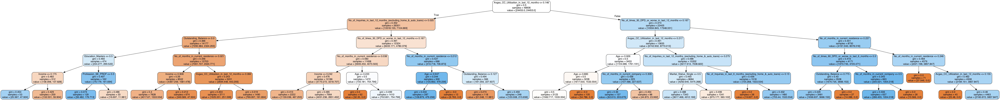

In [619]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,feature_names = list(X_train.columns) , filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [620]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# parameters to build the model on
parameters = {'max_depth': range(1, 40)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 101)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 39 candidates, totalling 195 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 195 out of 195 | elapsed:  1.1min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=101,
                                              splitter='best'),
             iid='warn', n_jobs=None, param_grid={'max_depth': range(1, 40)},
             pre_dispatch='2*n_j

In [622]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.060689,0.006306,0.009416,0.000755,1,{'max_depth': 1},0.741379,0.688482,0.711392,0.669975,...,0.708342,0.026296,2,0.700063,0.714286,0.708991,0.719170,0.704380,0.709378,0.006810
1,0.081757,0.007291,0.009167,0.000908,2,{'max_depth': 2},0.823276,0.688482,0.711392,0.669975,...,0.724723,0.053357,1,0.828789,0.714286,0.708991,0.719170,0.704380,0.735123,0.047096
2,0.096701,0.001627,0.008452,0.000602,3,{'max_depth': 3},0.683190,0.620419,0.736709,0.729529,...,0.694019,0.041608,3,0.667089,0.675708,0.736330,0.754579,0.712895,0.709320,0.033775
3,0.121740,0.001997,0.008744,0.001139,4,{'max_depth': 4},0.702586,0.651832,0.681013,0.727047,...,0.683982,0.028100,4,0.694356,0.713080,0.685905,0.777167,0.679440,0.709990,0.035440
4,0.147668,0.002286,0.008405,0.000243,5,{'max_depth': 5},0.696121,0.591623,0.706329,0.602978,...,0.647875,0.046809,6,0.736208,0.690778,0.725395,0.715507,0.718978,0.717373,0.015050


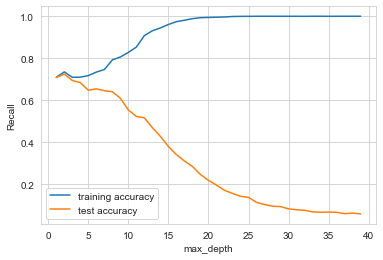

In [623]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [624]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   20.6s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sco

In [625]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.475626,0.023829,0.010480,0.000750,5,{'min_samples_leaf': 5},0.154034,0.125000,0.100490,0.174020,...,0.141591,0.025828,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.442012,0.040386,0.011015,0.000962,25,{'min_samples_leaf': 25},0.342298,0.318627,0.333333,0.377451,...,0.346401,0.020572,9,0.912990,0.926516,0.914881,0.906920,0.913043,0.914870,0.006414
2,0.350431,0.046562,0.009197,0.000401,45,{'min_samples_leaf': 45},0.410758,0.433824,0.401961,0.497549,...,0.447837,0.040941,8,0.890931,0.897734,0.887324,0.902021,0.901408,0.895884,0.005821
3,0.450395,0.116308,0.011699,0.002102,65,{'min_samples_leaf': 65},0.481663,0.477941,0.455882,0.475490,...,0.478195,0.014090,7,0.871324,0.870178,0.857930,0.876914,0.866503,0.868570,0.006281
4,0.405936,0.127966,0.011052,0.003067,85,{'min_samples_leaf': 85},0.498778,0.534314,0.480392,0.512255,...,0.519853,0.032091,6,0.833946,0.842009,0.816289,0.841396,0.849357,0.836599,0.011266


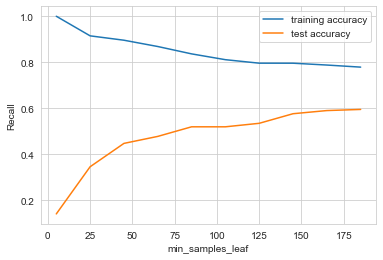

In [626]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [627]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   26.1s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_split': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sc

In [628]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.500333,0.104836,0.009080,0.000625,5,{'min_samples_split': 5},0.066015,0.080882,0.044118,0.085784,...,0.070556,0.014748,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.424341,0.033604,0.008591,0.000172,25,{'min_samples_split': 25},0.212714,0.176471,0.149510,0.200980,...,0.184700,0.021710,9,0.998775,0.998775,0.999388,0.996938,0.998163,0.998408,0.000831
2,0.430022,0.025172,0.009045,0.000356,45,{'min_samples_split': 45},0.286064,0.259804,0.250000,0.281863,...,0.267017,0.014270,8,0.987132,0.981629,0.983466,0.979179,0.978567,0.981995,0.003110
3,0.415935,0.028225,0.010312,0.002489,65,{'min_samples_split': 65},0.371638,0.318627,0.313725,0.340686,...,0.332662,0.021616,7,0.973652,0.964483,0.966932,0.962033,0.964483,0.966316,0.003982
4,0.468215,0.044054,0.010637,0.002196,85,{'min_samples_split': 85},0.393643,0.362745,0.352941,0.375000,...,0.365004,0.018233,6,0.959559,0.947949,0.946724,0.949786,0.949173,0.950638,0.004583


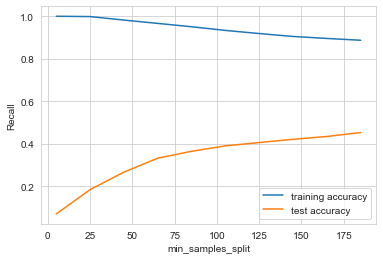

In [629]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [638]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 2),
    'min_samples_leaf': range(50, 250, 50),
    'min_samples_split': range(50, 250, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(class_weight='balanced')
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          scoring="recall", cv = n_folds,
                          return_train_score=True, n_jobs= -1 ,verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:   52.4s
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed:  1.5min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 2),
                  

In [641]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.400110,0.015851,0.021116,0.002524,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.716381,...,0.673179,0.046208,26,0.748775,0.689528,0.729333,0.755664,0.672382,0.719136,0.032800
1,0.556681,0.154325,0.023500,0.006883,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.716381,...,0.673179,0.046208,26,0.748775,0.689528,0.729333,0.755664,0.672382,0.719136,0.032800
2,0.769491,0.018911,0.025799,0.005046,entropy,5,50,150,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.716381,...,0.673179,0.046208,26,0.750000,0.689528,0.729333,0.755664,0.672382,0.719382,0.033025
3,0.675213,0.050537,0.022167,0.006101,entropy,5,50,200,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.716381,...,0.674159,0.045110,25,0.750000,0.689528,0.728720,0.755664,0.672994,0.719382,0.032815
4,0.581649,0.042709,0.019246,0.002763,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.713936,...,0.675141,0.040277,17,0.745098,0.683405,0.725046,0.753215,0.712186,0.723790,0.024848


In [642]:
# printing the optimal accuracy score and hyperparameters
print("best recall", grid_search.best_score_)
print(grid_search.best_estimator_)

best recall 0.6810393322576629
DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=200, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')


In [643]:
# model with optimal hyperparameters
clf_ginni = DecisionTreeClassifier(class_weight='balanced',
                                  criterion='gini', 
                                  random_state = 100,
                                  max_depth=5, 
                                  min_samples_leaf=50,
                                  min_samples_split=200)
clf_ginni.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=200,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=100, splitter='best')

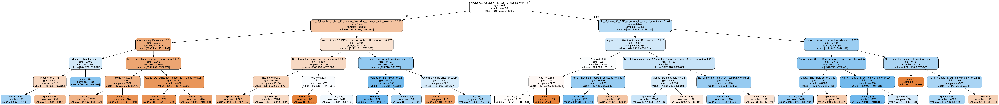

In [644]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_ginni, out_file=dot_data,feature_names=list(X_train.columns),filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [645]:
## checking accuracy score
clf_ginni.score(X_test,y_test)

0.6037879872143505

In [646]:
## making predictions
y_pred = clf_ginni.predict(X_test)


print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[12078  7977]
 [  328   578]]
accuracy 0.6037879872143505
precision 0.06756282875511396
recall 0.6379690949227373


In [647]:
from sklearn.ensemble import RandomForestClassifier

## creating Random Forest ensamble and fitting training data 
rfc = RandomForestClassifier(class_weight='balanced')
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [648]:
# Making predictions
predictions = rfc.predict(X_test)

In [649]:
print(classification_report(y_test,predictions))


              precision    recall  f1-score   support

           0       0.96      1.00      0.98     20055
           1       0.00      0.00      0.00       906

    accuracy                           0.96     20961
   macro avg       0.48      0.50      0.49     20961
weighted avg       0.92      0.96      0.94     20961



In [650]:
from sklearn import metrics
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[20053     2]
 [  906     0]]
accuracy 0.9566814560374028
precision 0.0
recall 0.0


In [651]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 4)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, n_jobs = -1, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:    3.1s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [652]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.319963,0.008041,0.028497,0.002476,2,{'max_depth': 2},0.745721,0.732843,0.718137,0.723039,...,0.724145,0.014934,1,0.736520,0.757502,0.752603,0.654011,0.728720,0.725871,0.037418
1,0.542923,0.017300,0.030748,0.001949,6,{'max_depth': 6},0.647922,0.651961,0.629902,0.700980,...,0.649192,0.029048,2,0.713848,0.724434,0.715248,0.723821,0.698714,0.715213,0.009308
2,0.773515,0.015152,0.035580,0.000779,10,{'max_depth': 10},0.469438,0.379902,0.421569,0.424020,...,0.412516,0.036143,3,0.754289,0.751378,0.744029,0.719535,0.720147,0.737876,0.015102
3,0.964200,0.022071,0.038046,0.002600,14,{'max_depth': 14},0.095355,0.127451,0.132353,0.134804,...,0.119561,0.015372,4,0.804534,0.791794,0.774036,0.788732,0.774036,0.786626,0.011566
4,0.856484,0.124910,0.028474,0.005735,18,{'max_depth': 18},0.019560,0.002451,0.024510,0.019608,...,0.019108,0.009091,5,0.833946,0.829761,0.803429,0.817514,0.815677,0.820065,0.010856


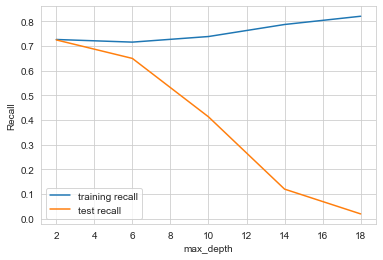

In [653]:
## visualizing results
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [654]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(class_weight='balanced',max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                    return_train_score=True, n_jobs = -1,verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  2.2min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [655]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,5.252625,0.056618,0.208342,0.011473,100,{'n_estimators': 100},0.650367,0.644608,0.629902,0.703431,...,0.656054,0.024934,2,0.724265,0.721372,0.718310,0.728108,0.720759,0.722563,0.003359
1,34.112874,0.693905,1.090603,0.150375,500,{'n_estimators': 500},0.650367,0.639706,0.629902,0.718137,...,0.655563,0.031949,4,0.715686,0.728108,0.722596,0.721984,0.711574,0.719990,0.005762
2,55.120590,3.088067,1.553881,0.145993,900,{'n_estimators': 900},0.660147,0.649510,0.632353,0.708333,...,0.658500,0.026524,1,0.718137,0.726271,0.721984,0.723821,0.713411,0.720725,0.004519
3,63.508491,6.358894,1.681789,0.134534,1300,{'n_estimators': 1300},0.655257,0.649510,0.622549,0.708333,...,0.656051,0.028391,3,0.716299,0.728720,0.718310,0.723821,0.713411,0.720112,0.005487


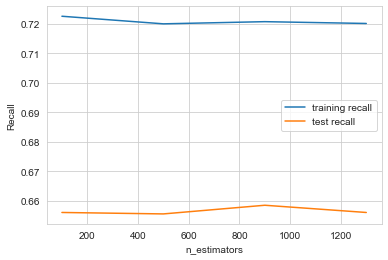

In [656]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("n_estimators")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [657]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [4, 8, 12, 16]}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced', max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True,n_jobs = -1, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:    3.2s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [658]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.513192,0.031869,0.032268,0.007047,4,{'max_features': 4},0.660147,0.656863,0.615196,0.696078,...,0.646245,0.033552,1,0.720588,0.727495,0.705450,0.696877,0.704225,0.710927,0.011315
1,0.887837,0.031795,0.033514,0.009118,8,{'max_features': 8},0.645477,0.632353,0.625000,0.659314,...,0.635468,0.015486,2,0.737745,0.725046,0.739130,0.718922,0.728720,0.729913,0.007645
2,1.148955,0.038912,0.036673,0.009946,12,{'max_features': 12},0.633252,0.634804,0.612745,0.651961,...,0.627631,0.016680,3,0.719363,0.729333,0.729945,0.712799,0.724434,0.723174,0.006443
3,1.124847,0.136381,0.021567,0.003642,16,{'max_features': 16},0.579462,0.612745,0.617647,0.669118,...,0.618833,0.028742,4,0.703431,0.734231,0.725046,0.718922,0.726883,0.721703,0.010359


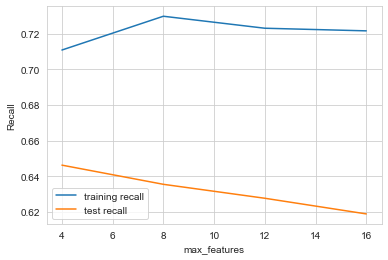

In [660]:
# plotting recall with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_features")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [661]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, n_jobs=-1,verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    5.7s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [662]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.909666,0.024229,0.049192,0.004119,100,{'min_samples_leaf': 100},0.547677,0.541667,0.539216,0.627451,...,0.569829,0.034884,6,0.702206,0.728108,0.729945,0.709737,0.720147,0.718028,0.010651
1,1.187519,0.402932,0.048709,0.014635,150,{'min_samples_leaf': 150},0.621027,0.612745,0.578431,0.661765,...,0.616362,0.026861,5,0.721814,0.716473,0.709124,0.705450,0.722596,0.715091,0.006812
2,1.019564,0.304045,0.038110,0.013166,200,{'min_samples_leaf': 200},0.650367,0.632353,0.642157,0.710784,...,0.648701,0.034166,4,0.717525,0.720759,0.733619,0.715248,0.718310,0.721092,0.006506
3,1.588913,0.080490,0.057052,0.011041,250,{'min_samples_leaf': 250},0.657702,0.629902,0.620098,0.700980,...,0.652619,0.028077,3,0.723039,0.707287,0.723821,0.706675,0.721984,0.716561,0.007846
4,1.114636,0.382996,0.067844,0.034277,300,{'min_samples_leaf': 300},0.643032,0.671569,0.629902,0.696078,...,0.656057,0.024345,2,0.718750,0.727495,0.713411,0.698714,0.713411,0.714356,0.009364


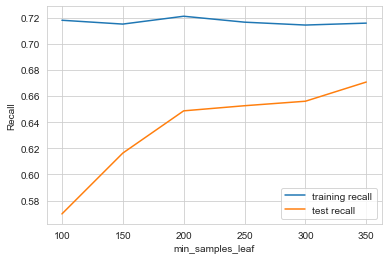

In [663]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [666]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True,n_jobs=-1, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    6.4s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [667]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.089236,0.023103,0.045748,0.007487,200,{'min_samples_split': 200},0.410758,0.345588,0.362745,0.406863,...,0.379211,0.025474,6,0.722426,0.736681,0.728720,0.723209,0.729945,0.728196,0.005167
1,1.168804,0.112792,0.053293,0.006439,250,{'min_samples_split': 250},0.413203,0.401961,0.426471,0.490196,...,0.425778,0.033765,5,0.711397,0.725658,0.714636,0.726883,0.730557,0.721826,0.007443
2,1.276625,0.072954,0.082181,0.069393,300,{'min_samples_split': 300},0.491443,0.480392,0.485294,0.485294,...,0.474759,0.021975,4,0.720588,0.718922,0.735456,0.709124,0.710349,0.718888,0.009441
3,1.068742,0.055822,0.075843,0.074141,350,{'min_samples_split': 350},0.525672,0.475490,0.500000,0.539216,...,0.509547,0.021891,3,0.721201,0.729333,0.728720,0.709737,0.701776,0.718153,0.010816
4,1.995485,0.284793,0.052605,0.012337,400,{'min_samples_split': 400},0.513447,0.531863,0.534314,0.556373,...,0.533081,0.013744,2,0.726716,0.723821,0.723821,0.716473,0.714636,0.721093,0.004681


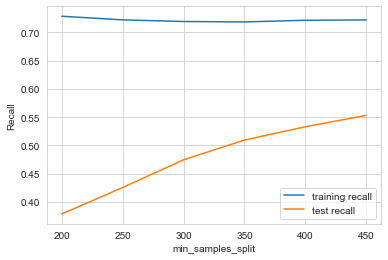

In [668]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [669]:
# specify number of folds for k-fold CV
n_folds = 3

param_grid = {
    'max_depth': [4,6,8],
    'min_samples_leaf': [300, 350],
    'min_samples_split': [400, 450],
    'n_estimators': [900,1000], 
    'max_features': [10,15,20]
}
# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(estimator = rf, param_grid = param_grid, 
                    cv=n_folds, n_jobs = -1,verbose = 1,
                   scoring="recall",
                 return_train_score=True)
rf.fit(X_train, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 33.8min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 40.8min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [671]:
print('We can get recall of',rf.best_score_,'using',rf.best_params_)


We can get recall of 0.7089771270636916 using {'max_depth': 4, 'max_features': 20, 'min_samples_leaf': 350, 'min_samples_split': 450, 'n_estimators': 1000}


In [672]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=4,
                             min_samples_leaf=350, 
                             min_samples_split=400,
                             max_features=15,
                             n_estimators=900,class_weight='balanced')

In [673]:
# fit
rfc.fit(X_train,y_train)

# predict
predictions = rfc.predict(X_test)

print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.98      0.56      0.71     20055
           1       0.07      0.71      0.12       906

    accuracy                           0.56     20961
   macro avg       0.52      0.63      0.42     20961
weighted avg       0.94      0.56      0.68     20961



In [674]:
print(metrics.confusion_matrix(y_test, predictions))


[[11164  8891]
 [  260   646]]


In [675]:
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[11164  8891]
 [  260   646]]
accuracy 0.5634273173989791
precision 0.0677361853832442
recall 0.7130242825607064


#### Application Score Card

In [676]:
## reading combined WoE data file
woe_all_data = pd.read_csv("woe_all_data.csv",sep=",")
woe_all_data.head()

,Application_ID,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,...,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans),No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans),Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,Performance_Tag
0,954457215.0,0.038694,0.031865,-0.003915,-0.085600,-0.205632,0.018291,-0.027815,-0.004148,-0.060774,...,-0.816778,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,-0.939076,-0.448162,0.012009,0.0
1,432830445.0,0.007748,-0.010008,-0.003915,-0.025601,-0.330883,-0.018284,-0.013607,-0.004148,-0.060774,...,-0.816778,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,-0.819813,0.039354,0.012009,0.0
2,941387308.0,0.007748,-0.010008,0.022916,-0.085600,-0.179070,0.018291,-0.013607,-0.004148,-0.060774,...,-0.894263,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,-0.939076,-0.878091,0.012009,0.0
3,392161677.0,-0.040314,-0.010008,-0.003915,0.039776,-0.330883,0.018291,0.091115,-0.004148,-0.060774,...,-0.894263,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,0.201618,-0.448162,-0.138677,0.0
4,182011211.0,0.001346,0.031865,-0.003915,0.004081,-0.179070,-0.018284,-0.027815,-0.004148,-0.060774,...,-0.894263,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,-0.939076,-0.448162,0.012009,0.0


It is required to build an application scorecard with the good to bad odds. The ideal model that is suitable for such a case is **Logistic Regression** model with all variables(combined data of demographics and CreditBureau). Similar representation of non-defaulters to defaulters we also have in our **WoE transformed** representation. So, we’ll need both our logistic regression coefficients that we got from fitting our model (**WoE Logistic Regression model combined data model with L1 regularization prepared earlier**) as well as our WOE dataset with the transformed WOE values.

The scorecard in this case will be evaluated as :

**target_score = 400**

**target_odds = 10**

**pts_double_odds = 20**

**factor = pts_double_odds / log10(2)**

**offset = target_score - factor X log10(target_odds)**

Finally,

**scorecard['score'] = offset - factor X scorecard['logit']**

**Note:** The negative sign for the term of scorecard['logit'] is applied as model is evaluating probabilities ofodds of defaults (bad). However, we tend to provide a high score to the persons who are good. Therefore, the sign is negative.

In [695]:
## taking all variables to X ignoring Performance_Tag and App_Id (this is Y variable)
X = woe_all_data.drop(['Performance_Tag','Application_ID'], axis=1)

X.head()

,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,...,No_of_trades_opened_in_last_6_months,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans),No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans),Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan
0,0.038694,0.031865,-0.003915,-0.085600,-0.205632,0.018291,-0.027815,-0.004148,-0.060774,-0.291109,...,-0.543576,-0.816778,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,-0.939076,-0.448162,0.012009
1,0.007748,-0.010008,-0.003915,-0.025601,-0.330883,-0.018284,-0.013607,-0.004148,-0.060774,-0.150986,...,-0.543576,-0.816778,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,-0.819813,0.039354,0.012009
2,0.007748,-0.010008,0.022916,-0.085600,-0.179070,0.018291,-0.013607,-0.004148,-0.060774,-0.150986,...,-0.543576,-0.894263,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,-0.939076,-0.878091,0.012009
3,-0.040314,-0.010008,-0.003915,0.039776,-0.330883,0.018291,0.091115,-0.004148,-0.060774,-0.291109,...,-0.543576,-0.894263,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,0.201618,-0.448162,-0.138677
4,0.001346,0.031865,-0.003915,0.004081,-0.179070,-0.018284,-0.027815,-0.004148,-0.060774,-0.150986,...,-0.543576,-0.894263,-0.649554,-0.686847,-0.319551,-0.498554,0.001235,-0.939076,-0.448162,0.012009


In [696]:
# taking Converted as Y variable
y = woe_all_data['Performance_Tag']

y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Performance_Tag, dtype: float64

In [697]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [698]:
## Since we are required to prepare the scorecord for all the applicants,
## we take the complete combined WoE data set and prepare a Logistic model for all
## preparing final model based on best score for Logistic Regression model
model_scorecard=LogisticRegression(C=0.01,penalty="l1",class_weight='balanced')
model_scorecard.fit(X_train,y_train)

LogisticRegression(C=0.01, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l1',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [700]:
## checking the coefficient
model_scorecard.coef_[0]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.1771949 , 0.        , 0.        ,
       0.08192362, 0.46849563, 0.        , 0.34918402, 0.        ,
       0.        , 0.02015397, 0.1517794 , 0.        , 0.1129797 ,
       0.        , 0.        ])

In [701]:
## checking the intercept
intercept = model_scorecard.intercept_[0]
intercept

0.0

In [702]:
## combining coefficients with their respective variable names
lr_woe_mod_params = pd.DataFrame({'cols':X_train.columns,'coeff':model_scorecard.coef_[0]})
lr_woe_mod_params_index = lr_woe_mod_params.set_index('cols')
lr_woe_mod_params_index

,coeff
cols,
Age,0.000000
Gender,0.000000
Marital_Status,0.000000
No_of_dependents,0.000000
Income,0.000000
Education,0.000000
Profession,0.000000
Type_of_residence,0.000000
No_of_months_in_current_residence,0.000000


In [693]:
## removing all the variables that have coefficients as zero
## all these variables are the one that have been nullified by lasso regularization
lr_woe_mod_params_index = lr_woe_mod_params_index[lr_woe_mod_params_index.coeff !=0]
lr_woe_mod_params_index

,coeff
cols,
Income,-0.196973
No_of_months_in_current_residence,-0.065204
No_of_months_in_current_company,-0.207285
No_of_times_30_DPD_or_worse_in_last_6_months,0.717279
No_of_times_90_DPD_or_worse_in_last_12_months,0.540781
No_of_times_30_DPD_or_worse_in_last_12_months,0.365338
Avgas_CC_Utilization_in_last_12_months,0.868358
No_of_PL_trades_opened_in_last_6_months,0.386836
No_of_PL_trades_opened_in_last_12_months,0.386608


In [703]:
## Multiply linear regression coefficients to observation WOE Values
scorecard = woe_all_data[lr_woe_mod_params_index.index].apply(lambda x: x * lr_woe_mod_params_index['coeff'] ,axis=1)
scorecard.head()

,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,...,No_of_trades_opened_in_last_6_months,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans),No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans),Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan
0,0.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,...,-0.0,-0.285206,-0.0,-0.0,-0.00644,-0.07567,0.0,-0.106097,-0.0,0.0
1,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.0,-0.285206,-0.0,-0.0,-0.00644,-0.07567,0.0,-0.092622,0.0,0.0
2,0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,...,-0.0,-0.312262,-0.0,-0.0,-0.00644,-0.07567,0.0,-0.106097,-0.0,0.0
3,-0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,...,-0.0,-0.312262,-0.0,-0.0,-0.00644,-0.07567,0.0,0.022779,-0.0,-0.0
4,0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.0,-0.312262,-0.0,-0.0,-0.00644,-0.07567,0.0,-0.106097,-0.0,0.0


In [704]:
## Get Logit Values 
scorecard['logit'] = scorecard.sum(axis=1) + intercept
scorecard.head()

,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,...,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans),No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans),Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,logit
0,0.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,...,-0.285206,-0.0,-0.0,-0.00644,-0.07567,0.0,-0.106097,-0.0,0.0,-0.939773
1,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.285206,-0.0,-0.0,-0.00644,-0.07567,0.0,-0.092622,0.0,0.0,-0.926299
2,0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,...,-0.312262,-0.0,-0.0,-0.00644,-0.07567,0.0,-0.106097,-0.0,0.0,-0.963500
3,-0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,...,-0.312262,-0.0,-0.0,-0.00644,-0.07567,0.0,0.022779,-0.0,-0.0,-0.777463
4,0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.312262,-0.0,-0.0,-0.00644,-0.07567,0.0,-0.106097,-0.0,0.0,-0.810919


In [705]:
## Convert Logit to Odds Ratio and Odds Ratio to Probability
scorecard['odds'] = np.exp(-scorecard['logit'])
scorecard['probs'] = scorecard['odds'] / (scorecard['odds'] + 1)

In [706]:
## Set up Scoring Logic
target_score = 400
target_odds = 10
pts_double_odds = 20

factor = pts_double_odds / np.log10(2)
offset = target_score - factor * np.log10(target_odds)
print("factor =",factor)
print("offset =",offset)

factor = 66.43856189774725
offset = 333.56143810225274


In [707]:
## Get Logit Values
scorecard['score'] = offset - factor * scorecard['logit']
scorecard.head()

,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,...,No_of_Inquiries_in_last_6_months_(excluding_home_&_auto_loans),No_of_Inquiries_in_last_12_months_(excluding_home_&_auto_loans),Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,logit,odds,probs,score
0,0.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,...,-0.00644,-0.07567,0.0,-0.106097,-0.0,0.0,-0.939773,2.559402,0.719054,395.998638
1,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.00644,-0.07567,0.0,-0.092622,0.0,0.0,-0.926299,2.525147,0.716324,395.103421
2,0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,...,-0.00644,-0.07567,0.0,-0.106097,-0.0,0.0,-0.963500,2.620853,0.723822,397.574981
3,-0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,...,-0.00644,-0.07567,0.0,0.022779,-0.0,-0.0,-0.777463,2.175945,0.685133,385.214975
4,0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.00644,-0.07567,0.0,-0.106097,-0.0,0.0,-0.810919,2.249975,0.692305,387.437741


In [708]:
# Add Back Application ID and Performance_Tag
scorecard['Application_ID'] = woe_all_data['Application_ID']
scorecard['Performance_Tag'] = woe_all_data['Performance_Tag']
scorecard.head()

,Age,Gender,Marital_Status,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,...,Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,logit,odds,probs,score,Application_ID,Performance_Tag
0,0.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,...,0.0,-0.106097,-0.0,0.0,-0.939773,2.559402,0.719054,395.998638,954457215.0,0.0
1,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,0.0,-0.092622,0.0,0.0,-0.926299,2.525147,0.716324,395.103421,432830445.0,0.0
2,0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,...,0.0,-0.106097,-0.0,0.0,-0.963500,2.620853,0.723822,397.574981,941387308.0,0.0
3,-0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,...,0.0,0.022779,-0.0,-0.0,-0.777463,2.175945,0.685133,385.214975,392161677.0,0.0
4,0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,0.0,-0.106097,-0.0,0.0,-0.810919,2.249975,0.692305,387.437741,182011211.0,0.0


In [709]:
## checking data across all with values in performance tag
print(scorecard.score.min())
print(scorecard.score.max())
print(scorecard.score.mean())
print(scorecard.score.median())

276.8159745332518
397.79622317981
343.8762831158576
343.739526406792


In [710]:
## checking data for the defaulters
print(scorecard[scorecard.Performance_Tag==1].score.min())
print(scorecard[scorecard.Performance_Tag==1].score.max())
print(scorecard[scorecard.Performance_Tag==1].score.mean())
print(scorecard[scorecard.Performance_Tag==1].score.median())

277.78778101242636
397.79622317981
321.912325874929
312.140554746695


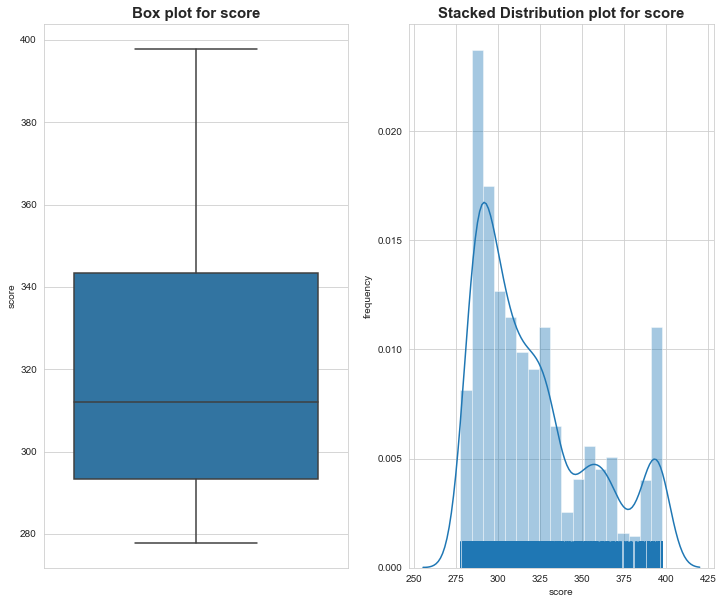

In [711]:
## plotting  for dafault cases
plt.figure(figsize=(12,10))

scorecard_defaulters = scorecard[scorecard.Performance_Tag==1]

plt.subplot(1, 2, 1)
plt.title('Box plot for score', fontweight='bold', fontsize = 15)
sns.boxplot(y='score', data=scorecard_defaulters)

plt.subplot(1, 2, 2)
plt.title('Stacked Distribution plot for score', fontweight='bold', fontsize = 15)
sns.distplot(scorecard_defaulters['score'],rug=True)
plt.ylabel('frequency')
plt.show()

# Determining the scorecard cut-off

### Cut-Off : 330

### Reason for Choosing this Cut-Off : 
- Recommended Strategy “Acquire the right customers” 
- Caters almost all the rejected population
- Prevents two-third of the default cases.
- Impacts one-third of the approved cases.
- A less cut-off would dilute the purpose of the model.
- A higher cut-off will impact the business of the bank.
- Discussions and recommendations by CredX Operations and Strategy team may change this cut-off.


# Financial Risk in Current Operations 
#### Total number of applications 		= 71295
#### Credit Card given to applicants 	= 69870
#### Customers that made Credit Loss 	= 2948
#### Assumptions on unit Applications : 
- Acquisition Cost + Credit Report Cost –100 INR
- Calling Cost – 10 calls avg × 10p = 1 INR
- Operations {Agents + Infra + Others) = 1000 INR approx.
- Credit Default = Rs 48,000 average

#### For every customer defaulted we are at a risk of loosing 50,000 INR (48k + 2k) on an average (assuming 50K is average credit line used by defaulter)

#### Total Credit Loss for all customers	= 50000 × 2948 = 150 Million INR (approx.)

# Financial Benefit of the ML Model

- The model giving a recall of 70% which means it is preventing 70% of losses.
	
	Potential Loss prevented with using model 	= 0.7 × 150 Million INR
							  	= 105 Million INR
	Loss after prevention				= 150 – 105 Million INR
								= 45 Million INR
 The Credit loss after applying the model has slashed to 30% compared to the Original Credit loss, which did not include using any model.

- Saving the amount paid to Underwriters for Credit application approval is added advantage.

- **Important Note** : There will be a tradeoff between the increase in approval rate and credit loss – increase of one will lead to increase of other. With this model the approval rate is bound to be less business to the bank and so will be the profits of the bank. However, profits are very small in margins (5-7%) as compare to the Principal amount in Credit Line. Hence percentage would be very small overall the Credit Line amount.

